# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

/usr/local/lib/python3.5/site-packages/matplotlib/font_manager.py:280: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  'Matplotlib is building the font cache using fc-list. '


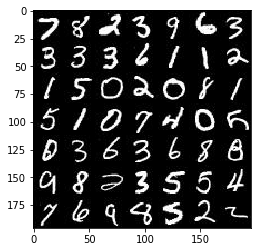

In [2]:
show_n_images = 50

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

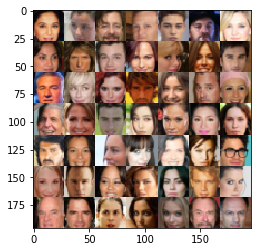

In [4]:
show_n_images = 50

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='inputs_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return (inputs_real, inputs_z, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=1):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with (tf.variable_scope('discriminator', reuse=reuse)):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        drop2 = tf.nn.dropout(x2, keep_prob)
        bn2 = tf.layers.batch_normalization(drop2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=1, padding='same')
        drop3 = tf.nn.dropout(x3, keep_prob)
        bn3 = tf.layers.batch_normalization(drop3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 7x7x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 7*7*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return (out, logits)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with (tf.variable_scope('generator', reuse=not is_train)):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 28x28x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
                        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    
    d_loss_fake = tf.reduce_mean(
                        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
                        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train \
                            .AdamOptimizer(learning_rate, beta1=beta1) \
                            .minimize(d_loss, var_list=d_vars)
                
        g_train_opt = tf.train \
                            .AdamOptimizer(learning_rate, beta1=beta1) \
                            .minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [14]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    #saver = tf.train.Saver()
    
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]
    
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels, alpha=0.2)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z, input_real: batch_images})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if steps % 100 == 0:
                    show_generator_output(sess, 16, input_z, image_channels, data_image_mode)
                    
        #saver.save(sess, './checkpoints/generator.ckpt')


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.0511... Generator Loss: 0.6482
Epoch 1/2... Discriminator Loss: 0.0580... Generator Loss: 4.1681
Epoch 1/2... Discriminator Loss: 5.3844... Generator Loss: 0.0067
Epoch 1/2... Discriminator Loss: 0.1765... Generator Loss: 3.4673
Epoch 1/2... Discriminator Loss: 3.6017... Generator Loss: 0.0783
Epoch 1/2... Discriminator Loss: 0.8012... Generator Loss: 1.2852
Epoch 1/2... Discriminator Loss: 1.1833... Generator Loss: 0.9899
Epoch 1/2... Discriminator Loss: 0.8326... Generator Loss: 1.0630
Epoch 1/2... Discriminator Loss: 0.8427... Generator Loss: 2.0986
Epoch 1/2... Discriminator Loss: 0.9614... Generator Loss: 0.6862


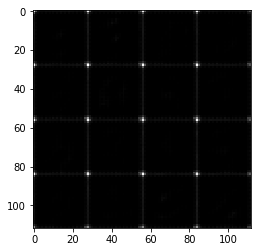

Epoch 1/2... Discriminator Loss: 0.4847... Generator Loss: 1.3224
Epoch 1/2... Discriminator Loss: 0.3575... Generator Loss: 2.0151
Epoch 1/2... Discriminator Loss: 0.2232... Generator Loss: 2.2824
Epoch 1/2... Discriminator Loss: 0.1606... Generator Loss: 2.4390
Epoch 1/2... Discriminator Loss: 0.1189... Generator Loss: 2.5581
Epoch 1/2... Discriminator Loss: 0.0543... Generator Loss: 3.9214
Epoch 1/2... Discriminator Loss: 0.0408... Generator Loss: 3.8089
Epoch 1/2... Discriminator Loss: 0.0617... Generator Loss: 3.3983
Epoch 1/2... Discriminator Loss: 0.0402... Generator Loss: 3.6362
Epoch 1/2... Discriminator Loss: 0.0394... Generator Loss: 3.5887


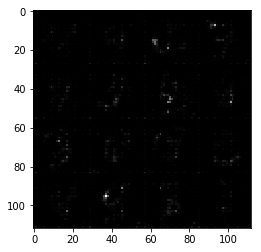

Epoch 1/2... Discriminator Loss: 0.0321... Generator Loss: 3.9815
Epoch 1/2... Discriminator Loss: 0.0766... Generator Loss: 2.9582
Epoch 1/2... Discriminator Loss: 0.0772... Generator Loss: 3.2861
Epoch 1/2... Discriminator Loss: 0.0607... Generator Loss: 3.1192
Epoch 1/2... Discriminator Loss: 0.0246... Generator Loss: 4.1905
Epoch 1/2... Discriminator Loss: 0.0433... Generator Loss: 3.8217
Epoch 1/2... Discriminator Loss: 0.0744... Generator Loss: 2.8679
Epoch 1/2... Discriminator Loss: 2.2185... Generator Loss: 0.3431
Epoch 1/2... Discriminator Loss: 0.1546... Generator Loss: 3.0189
Epoch 1/2... Discriminator Loss: 0.1439... Generator Loss: 2.3280


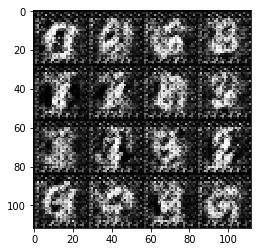

Epoch 1/2... Discriminator Loss: 0.1034... Generator Loss: 2.9082
Epoch 1/2... Discriminator Loss: 0.0317... Generator Loss: 6.2053
Epoch 1/2... Discriminator Loss: 0.0196... Generator Loss: 5.9068
Epoch 1/2... Discriminator Loss: 0.0967... Generator Loss: 2.6962
Epoch 1/2... Discriminator Loss: 4.4948... Generator Loss: 12.2707
Epoch 1/2... Discriminator Loss: 0.2607... Generator Loss: 3.7203
Epoch 1/2... Discriminator Loss: 0.1830... Generator Loss: 4.1057
Epoch 1/2... Discriminator Loss: 1.1565... Generator Loss: 0.5118
Epoch 1/2... Discriminator Loss: 0.1333... Generator Loss: 11.1048
Epoch 1/2... Discriminator Loss: 0.0366... Generator Loss: 8.9235


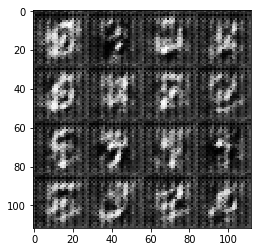

Epoch 1/2... Discriminator Loss: 0.0201... Generator Loss: 15.0410
Epoch 1/2... Discriminator Loss: 1.1524... Generator Loss: 0.6501
Epoch 1/2... Discriminator Loss: 0.5427... Generator Loss: 1.5165
Epoch 1/2... Discriminator Loss: 0.1928... Generator Loss: 3.5568
Epoch 1/2... Discriminator Loss: 1.3003... Generator Loss: 0.5384
Epoch 1/2... Discriminator Loss: 0.0230... Generator Loss: 5.8277
Epoch 1/2... Discriminator Loss: 0.0043... Generator Loss: 11.2324
Epoch 1/2... Discriminator Loss: 0.1172... Generator Loss: 3.6143
Epoch 1/2... Discriminator Loss: 0.2906... Generator Loss: 7.9551
Epoch 1/2... Discriminator Loss: 0.0602... Generator Loss: 7.3511


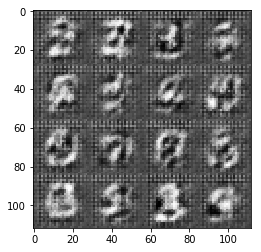

Epoch 1/2... Discriminator Loss: 0.6172... Generator Loss: 0.9735
Epoch 1/2... Discriminator Loss: 0.0266... Generator Loss: 8.0473
Epoch 1/2... Discriminator Loss: 0.2255... Generator Loss: 11.3277
Epoch 1/2... Discriminator Loss: 0.5699... Generator Loss: 1.7674
Epoch 1/2... Discriminator Loss: 0.0923... Generator Loss: 7.4856
Epoch 1/2... Discriminator Loss: 0.0326... Generator Loss: 6.6476
Epoch 1/2... Discriminator Loss: 0.5984... Generator Loss: 6.0027
Epoch 1/2... Discriminator Loss: 0.0212... Generator Loss: 6.0808
Epoch 1/2... Discriminator Loss: 1.1500... Generator Loss: 0.5593
Epoch 1/2... Discriminator Loss: 0.2744... Generator Loss: 2.2808


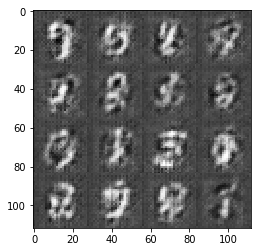

Epoch 1/2... Discriminator Loss: 0.1494... Generator Loss: 3.0293
Epoch 1/2... Discriminator Loss: 0.1306... Generator Loss: 3.8457
Epoch 1/2... Discriminator Loss: 2.2580... Generator Loss: 8.7079
Epoch 1/2... Discriminator Loss: 1.2393... Generator Loss: 0.4766
Epoch 1/2... Discriminator Loss: 0.4668... Generator Loss: 1.4021
Epoch 1/2... Discriminator Loss: 0.2418... Generator Loss: 2.0790
Epoch 1/2... Discriminator Loss: 0.0351... Generator Loss: 6.5805
Epoch 1/2... Discriminator Loss: 0.2131... Generator Loss: 10.2824
Epoch 1/2... Discriminator Loss: 0.1146... Generator Loss: 6.0870
Epoch 1/2... Discriminator Loss: 1.5897... Generator Loss: 0.3181


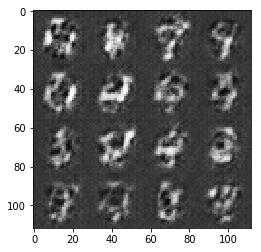

Epoch 1/2... Discriminator Loss: 0.0344... Generator Loss: 8.0379
Epoch 1/2... Discriminator Loss: 0.0193... Generator Loss: 9.8849
Epoch 1/2... Discriminator Loss: 0.2321... Generator Loss: 9.6907
Epoch 1/2... Discriminator Loss: 0.0264... Generator Loss: 9.0274
Epoch 1/2... Discriminator Loss: 0.0395... Generator Loss: 5.5007
Epoch 1/2... Discriminator Loss: 0.1146... Generator Loss: 5.4601
Epoch 1/2... Discriminator Loss: 0.3030... Generator Loss: 1.9188
Epoch 1/2... Discriminator Loss: 0.1144... Generator Loss: 3.1901
Epoch 1/2... Discriminator Loss: 0.0301... Generator Loss: 6.1403
Epoch 1/2... Discriminator Loss: 0.0230... Generator Loss: 6.5453


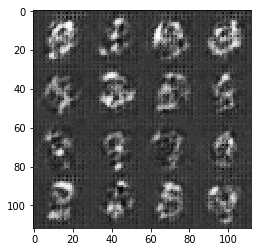

Epoch 1/2... Discriminator Loss: 0.2181... Generator Loss: 6.5260
Epoch 1/2... Discriminator Loss: 0.2245... Generator Loss: 2.7372
Epoch 1/2... Discriminator Loss: 0.0417... Generator Loss: 4.0542
Epoch 1/2... Discriminator Loss: 0.0520... Generator Loss: 8.3141
Epoch 1/2... Discriminator Loss: 0.0832... Generator Loss: 3.1691
Epoch 1/2... Discriminator Loss: 0.2420... Generator Loss: 1.8937
Epoch 1/2... Discriminator Loss: 0.1307... Generator Loss: 2.6792
Epoch 1/2... Discriminator Loss: 0.1966... Generator Loss: 2.3472
Epoch 1/2... Discriminator Loss: 0.0590... Generator Loss: 3.3635
Epoch 1/2... Discriminator Loss: 0.5623... Generator Loss: 1.0826


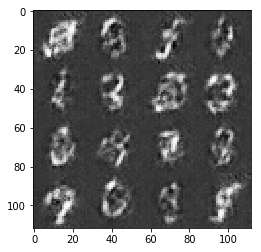

Epoch 1/2... Discriminator Loss: 0.0822... Generator Loss: 5.7030
Epoch 1/2... Discriminator Loss: 0.0669... Generator Loss: 6.2832
Epoch 1/2... Discriminator Loss: 0.0445... Generator Loss: 7.9947
Epoch 2/2... Discriminator Loss: 0.1476... Generator Loss: 2.3671
Epoch 2/2... Discriminator Loss: 0.0646... Generator Loss: 3.6153
Epoch 2/2... Discriminator Loss: 0.1325... Generator Loss: 2.5069
Epoch 2/2... Discriminator Loss: 2.0565... Generator Loss: 0.2049
Epoch 2/2... Discriminator Loss: 0.5681... Generator Loss: 4.0676
Epoch 2/2... Discriminator Loss: 0.3364... Generator Loss: 1.8587
Epoch 2/2... Discriminator Loss: 0.2286... Generator Loss: 2.0696


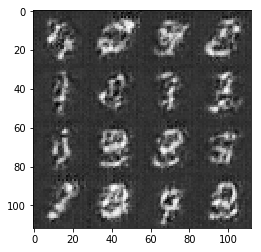

Epoch 2/2... Discriminator Loss: 0.0573... Generator Loss: 3.8325
Epoch 2/2... Discriminator Loss: 0.1603... Generator Loss: 2.6223
Epoch 2/2... Discriminator Loss: 0.0461... Generator Loss: 4.0439
Epoch 2/2... Discriminator Loss: 0.1475... Generator Loss: 2.3287
Epoch 2/2... Discriminator Loss: 0.1088... Generator Loss: 2.6959
Epoch 2/2... Discriminator Loss: 0.0422... Generator Loss: 4.1658
Epoch 2/2... Discriminator Loss: 0.0399... Generator Loss: 3.8813
Epoch 2/2... Discriminator Loss: 0.3686... Generator Loss: 1.4060
Epoch 2/2... Discriminator Loss: 0.0867... Generator Loss: 4.6290
Epoch 2/2... Discriminator Loss: 0.0144... Generator Loss: 7.4361


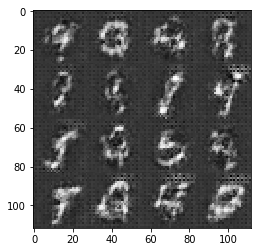

Epoch 2/2... Discriminator Loss: 0.1070... Generator Loss: 2.7354
Epoch 2/2... Discriminator Loss: 0.0486... Generator Loss: 3.9234
Epoch 2/2... Discriminator Loss: 0.0221... Generator Loss: 6.0118
Epoch 2/2... Discriminator Loss: 0.0331... Generator Loss: 5.7071
Epoch 2/2... Discriminator Loss: 0.0848... Generator Loss: 4.4469
Epoch 2/2... Discriminator Loss: 0.0162... Generator Loss: 7.7902
Epoch 2/2... Discriminator Loss: 0.0207... Generator Loss: 4.9823
Epoch 2/2... Discriminator Loss: 0.0831... Generator Loss: 3.0965
Epoch 2/2... Discriminator Loss: 0.0404... Generator Loss: 4.8241
Epoch 2/2... Discriminator Loss: 0.2509... Generator Loss: 1.8250


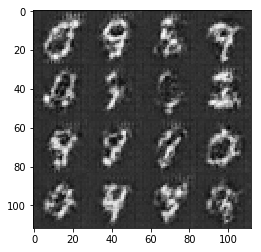

Epoch 2/2... Discriminator Loss: 0.0182... Generator Loss: 5.7471
Epoch 2/2... Discriminator Loss: 0.0219... Generator Loss: 4.9130
Epoch 2/2... Discriminator Loss: 2.5123... Generator Loss: 2.2004
Epoch 2/2... Discriminator Loss: 1.0408... Generator Loss: 0.8776
Epoch 2/2... Discriminator Loss: 0.8023... Generator Loss: 1.9548
Epoch 2/2... Discriminator Loss: 0.5116... Generator Loss: 2.1366
Epoch 2/2... Discriminator Loss: 0.5887... Generator Loss: 0.9997
Epoch 2/2... Discriminator Loss: 0.1403... Generator Loss: 3.3426
Epoch 2/2... Discriminator Loss: 0.7382... Generator Loss: 0.7959
Epoch 2/2... Discriminator Loss: 0.1607... Generator Loss: 3.4941


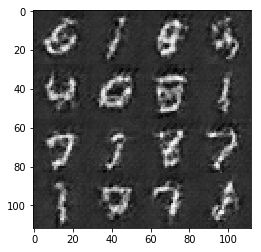

Epoch 2/2... Discriminator Loss: 0.1864... Generator Loss: 2.1282
Epoch 2/2... Discriminator Loss: 0.0791... Generator Loss: 3.7842
Epoch 2/2... Discriminator Loss: 0.1809... Generator Loss: 2.2040
Epoch 2/2... Discriminator Loss: 0.1018... Generator Loss: 4.3656
Epoch 2/2... Discriminator Loss: 0.0813... Generator Loss: 3.2330
Epoch 2/2... Discriminator Loss: 0.0323... Generator Loss: 4.7943
Epoch 2/2... Discriminator Loss: 0.0797... Generator Loss: 6.2554
Epoch 2/2... Discriminator Loss: 0.0541... Generator Loss: 5.2643
Epoch 2/2... Discriminator Loss: 0.0377... Generator Loss: 4.6754
Epoch 2/2... Discriminator Loss: 0.0564... Generator Loss: 3.6806


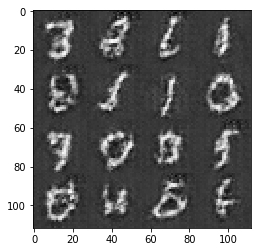

Epoch 2/2... Discriminator Loss: 0.0926... Generator Loss: 4.0630
Epoch 2/2... Discriminator Loss: 0.0444... Generator Loss: 3.9852
Epoch 2/2... Discriminator Loss: 0.0862... Generator Loss: 3.3376
Epoch 2/2... Discriminator Loss: 0.1090... Generator Loss: 2.6929
Epoch 2/2... Discriminator Loss: 0.1583... Generator Loss: 2.3033
Epoch 2/2... Discriminator Loss: 0.0730... Generator Loss: 3.3361
Epoch 2/2... Discriminator Loss: 0.1251... Generator Loss: 2.6043
Epoch 2/2... Discriminator Loss: 0.0896... Generator Loss: 3.5898
Epoch 2/2... Discriminator Loss: 0.1852... Generator Loss: 2.2157
Epoch 2/2... Discriminator Loss: 0.1716... Generator Loss: 2.3156


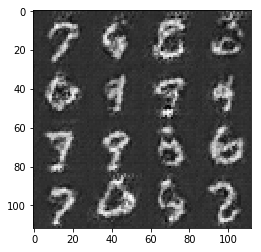

Epoch 2/2... Discriminator Loss: 0.0202... Generator Loss: 7.8607
Epoch 2/2... Discriminator Loss: 0.2056... Generator Loss: 2.0567
Epoch 2/2... Discriminator Loss: 0.0312... Generator Loss: 4.3057
Epoch 2/2... Discriminator Loss: 0.2636... Generator Loss: 1.8895
Epoch 2/2... Discriminator Loss: 3.6255... Generator Loss: 0.2477
Epoch 2/2... Discriminator Loss: 0.3511... Generator Loss: 2.6031
Epoch 2/2... Discriminator Loss: 1.1363... Generator Loss: 3.2956
Epoch 2/2... Discriminator Loss: 0.4511... Generator Loss: 1.5894
Epoch 2/2... Discriminator Loss: 0.8473... Generator Loss: 3.8268
Epoch 2/2... Discriminator Loss: 0.4551... Generator Loss: 1.2730


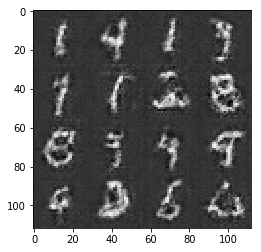

Epoch 2/2... Discriminator Loss: 0.3090... Generator Loss: 1.9057
Epoch 2/2... Discriminator Loss: 0.2516... Generator Loss: 2.2638
Epoch 2/2... Discriminator Loss: 0.0716... Generator Loss: 4.1071
Epoch 2/2... Discriminator Loss: 0.2049... Generator Loss: 2.1677
Epoch 2/2... Discriminator Loss: 0.2119... Generator Loss: 2.1549
Epoch 2/2... Discriminator Loss: 0.0350... Generator Loss: 4.5397
Epoch 2/2... Discriminator Loss: 0.5078... Generator Loss: 1.2642
Epoch 2/2... Discriminator Loss: 0.1848... Generator Loss: 2.1408
Epoch 2/2... Discriminator Loss: 0.0565... Generator Loss: 4.3327
Epoch 2/2... Discriminator Loss: 0.0527... Generator Loss: 4.0369


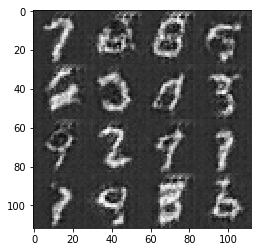

Epoch 2/2... Discriminator Loss: 0.2212... Generator Loss: 2.1330
Epoch 2/2... Discriminator Loss: 0.0333... Generator Loss: 4.6221
Epoch 2/2... Discriminator Loss: 0.1150... Generator Loss: 2.7674
Epoch 2/2... Discriminator Loss: 0.2125... Generator Loss: 2.0066
Epoch 2/2... Discriminator Loss: 0.1960... Generator Loss: 2.1789
Epoch 2/2... Discriminator Loss: 0.0563... Generator Loss: 3.5475
Epoch 2/2... Discriminator Loss: 0.0241... Generator Loss: 5.1210
Epoch 2/2... Discriminator Loss: 0.1009... Generator Loss: 2.7091
Epoch 2/2... Discriminator Loss: 3.3473... Generator Loss: 0.0735
Epoch 2/2... Discriminator Loss: 0.8529... Generator Loss: 2.1091


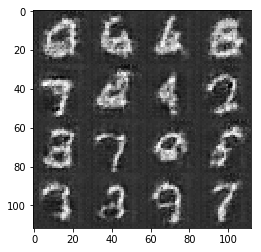

Epoch 2/2... Discriminator Loss: 0.5845... Generator Loss: 1.7497
Epoch 2/2... Discriminator Loss: 0.4095... Generator Loss: 1.9784
Epoch 2/2... Discriminator Loss: 0.3502... Generator Loss: 1.5296
Epoch 2/2... Discriminator Loss: 0.1624... Generator Loss: 2.6857
Epoch 2/2... Discriminator Loss: 0.0952... Generator Loss: 3.6340
Epoch 2/2... Discriminator Loss: 0.2808... Generator Loss: 1.7038
Epoch 2/2... Discriminator Loss: 0.0602... Generator Loss: 4.7611


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/8... Discriminator Loss: 0.6728... Generator Loss: 1.5186
Epoch 1/8... Discriminator Loss: 1.1272... Generator Loss: 0.8372
Epoch 1/8... Discriminator Loss: 0.3232... Generator Loss: 2.3715
Epoch 1/8... Discriminator Loss: 0.1226... Generator Loss: 4.2754
Epoch 1/8... Discriminator Loss: 0.9746... Generator Loss: 0.7104
Epoch 1/8... Discriminator Loss: 0.3357... Generator Loss: 2.6196
Epoch 1/8... Discriminator Loss: 0.4234... Generator Loss: 1.6064
Epoch 1/8... Discriminator Loss: 0.5877... Generator Loss: 1.1269
Epoch 1/8... Discriminator Loss: 0.1138... Generator Loss: 4.6090
Epoch 1/8... Discriminator Loss: 0.0383... Generator Loss: 4.0158


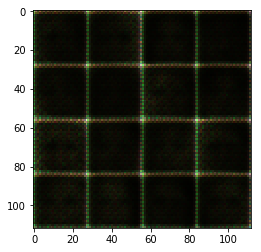

Epoch 1/8... Discriminator Loss: 0.0431... Generator Loss: 5.1493
Epoch 1/8... Discriminator Loss: 0.0573... Generator Loss: 5.8116
Epoch 1/8... Discriminator Loss: 0.0197... Generator Loss: 6.1787
Epoch 1/8... Discriminator Loss: 0.1315... Generator Loss: 2.5443
Epoch 1/8... Discriminator Loss: 0.0390... Generator Loss: 4.0249
Epoch 1/8... Discriminator Loss: 1.9109... Generator Loss: 0.3166
Epoch 1/8... Discriminator Loss: 0.0496... Generator Loss: 5.9687
Epoch 1/8... Discriminator Loss: 0.0226... Generator Loss: 7.6569
Epoch 1/8... Discriminator Loss: 0.0425... Generator Loss: 4.4188
Epoch 1/8... Discriminator Loss: 0.0176... Generator Loss: 11.2877


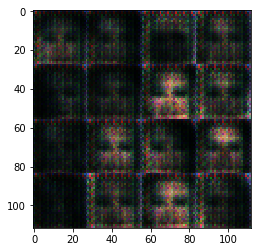

Epoch 1/8... Discriminator Loss: 0.0046... Generator Loss: 10.1641
Epoch 1/8... Discriminator Loss: 0.0157... Generator Loss: 4.7534
Epoch 1/8... Discriminator Loss: 0.0167... Generator Loss: 8.4297
Epoch 1/8... Discriminator Loss: 0.0059... Generator Loss: 6.9933
Epoch 1/8... Discriminator Loss: 0.1426... Generator Loss: 2.6345
Epoch 1/8... Discriminator Loss: 0.1045... Generator Loss: 4.6590
Epoch 1/8... Discriminator Loss: 0.0116... Generator Loss: 8.6840
Epoch 1/8... Discriminator Loss: 3.2107... Generator Loss: 0.1940
Epoch 1/8... Discriminator Loss: 1.1724... Generator Loss: 2.4985
Epoch 1/8... Discriminator Loss: 0.1298... Generator Loss: 3.7857


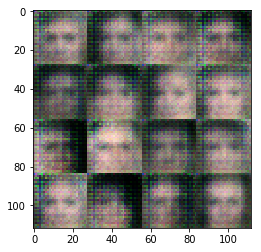

Epoch 1/8... Discriminator Loss: 0.0436... Generator Loss: 5.1883
Epoch 1/8... Discriminator Loss: 0.3382... Generator Loss: 2.9410
Epoch 1/8... Discriminator Loss: 0.2581... Generator Loss: 3.7506
Epoch 1/8... Discriminator Loss: 0.7456... Generator Loss: 0.8706
Epoch 1/8... Discriminator Loss: 0.2229... Generator Loss: 2.7091
Epoch 1/8... Discriminator Loss: 0.0117... Generator Loss: 9.6059
Epoch 1/8... Discriminator Loss: 1.2423... Generator Loss: 0.4302
Epoch 1/8... Discriminator Loss: 0.0857... Generator Loss: 6.3817
Epoch 1/8... Discriminator Loss: 2.5465... Generator Loss: 0.3115
Epoch 1/8... Discriminator Loss: 2.7727... Generator Loss: 7.5936


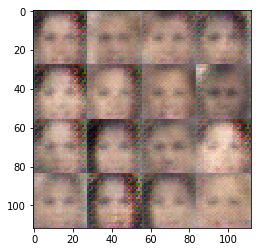

Epoch 1/8... Discriminator Loss: 0.1478... Generator Loss: 2.7957
Epoch 1/8... Discriminator Loss: 0.1403... Generator Loss: 6.0365
Epoch 1/8... Discriminator Loss: 2.2179... Generator Loss: 0.1487
Epoch 1/8... Discriminator Loss: 0.1272... Generator Loss: 3.6513
Epoch 1/8... Discriminator Loss: 0.1594... Generator Loss: 5.3392
Epoch 1/8... Discriminator Loss: 0.2873... Generator Loss: 2.7121
Epoch 1/8... Discriminator Loss: 0.1165... Generator Loss: 3.3148
Epoch 1/8... Discriminator Loss: 0.5408... Generator Loss: 8.0897
Epoch 1/8... Discriminator Loss: 0.4946... Generator Loss: 11.5567
Epoch 1/8... Discriminator Loss: 0.1720... Generator Loss: 3.2248


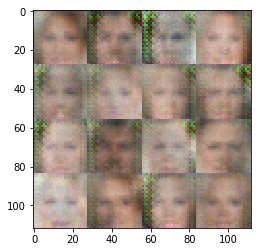

Epoch 1/8... Discriminator Loss: 1.3815... Generator Loss: 5.5735
Epoch 1/8... Discriminator Loss: 0.1686... Generator Loss: 10.5814
Epoch 1/8... Discriminator Loss: 0.1419... Generator Loss: 3.8295
Epoch 1/8... Discriminator Loss: 0.1603... Generator Loss: 5.5645
Epoch 1/8... Discriminator Loss: 0.0745... Generator Loss: 5.1192
Epoch 1/8... Discriminator Loss: 0.2997... Generator Loss: 2.4982
Epoch 1/8... Discriminator Loss: 0.4996... Generator Loss: 1.5383
Epoch 1/8... Discriminator Loss: 0.0705... Generator Loss: 7.0556
Epoch 1/8... Discriminator Loss: 0.0278... Generator Loss: 8.2699
Epoch 1/8... Discriminator Loss: 0.1870... Generator Loss: 2.6217


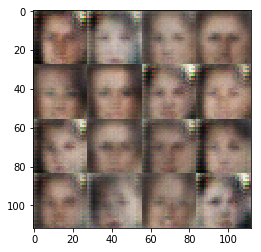

Epoch 1/8... Discriminator Loss: 4.7258... Generator Loss: 4.4191
Epoch 1/8... Discriminator Loss: 3.6593... Generator Loss: 7.2007
Epoch 1/8... Discriminator Loss: 0.2579... Generator Loss: 8.8595
Epoch 1/8... Discriminator Loss: 0.0736... Generator Loss: 8.9286
Epoch 1/8... Discriminator Loss: 0.1174... Generator Loss: 3.7036
Epoch 1/8... Discriminator Loss: 0.1500... Generator Loss: 3.0759
Epoch 1/8... Discriminator Loss: 0.0663... Generator Loss: 6.2871
Epoch 1/8... Discriminator Loss: 1.2995... Generator Loss: 0.5007
Epoch 1/8... Discriminator Loss: 0.3359... Generator Loss: 3.9660
Epoch 1/8... Discriminator Loss: 0.0962... Generator Loss: 4.2926


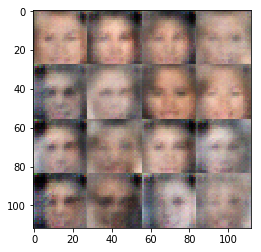

Epoch 1/8... Discriminator Loss: 0.2095... Generator Loss: 2.4974
Epoch 1/8... Discriminator Loss: 0.1690... Generator Loss: 2.8124
Epoch 1/8... Discriminator Loss: 0.2533... Generator Loss: 3.9785
Epoch 1/8... Discriminator Loss: 0.1185... Generator Loss: 3.5219
Epoch 1/8... Discriminator Loss: 0.1402... Generator Loss: 2.8761
Epoch 1/8... Discriminator Loss: 0.0221... Generator Loss: 7.4156
Epoch 1/8... Discriminator Loss: 0.0262... Generator Loss: 10.0951
Epoch 1/8... Discriminator Loss: 0.0753... Generator Loss: 7.8343
Epoch 1/8... Discriminator Loss: 0.2624... Generator Loss: 5.1199
Epoch 1/8... Discriminator Loss: 0.1276... Generator Loss: 2.9867


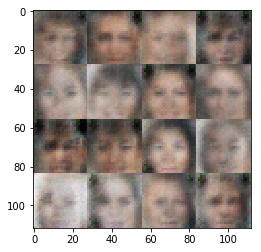

Epoch 1/8... Discriminator Loss: 0.1473... Generator Loss: 3.4870
Epoch 1/8... Discriminator Loss: 2.0286... Generator Loss: 10.7940
Epoch 1/8... Discriminator Loss: 0.0581... Generator Loss: 5.5782
Epoch 1/8... Discriminator Loss: 0.0292... Generator Loss: 5.9887
Epoch 1/8... Discriminator Loss: 0.0228... Generator Loss: 5.7848
Epoch 1/8... Discriminator Loss: 0.6520... Generator Loss: 4.2834
Epoch 1/8... Discriminator Loss: 0.0856... Generator Loss: 9.0541
Epoch 1/8... Discriminator Loss: 0.2712... Generator Loss: 2.5200
Epoch 1/8... Discriminator Loss: 0.0125... Generator Loss: 12.5157
Epoch 1/8... Discriminator Loss: 0.1376... Generator Loss: 6.4900


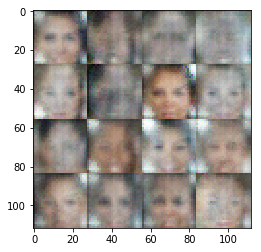

Epoch 1/8... Discriminator Loss: 0.1889... Generator Loss: 10.8197
Epoch 1/8... Discriminator Loss: 1.4335... Generator Loss: 0.8737
Epoch 1/8... Discriminator Loss: 0.0880... Generator Loss: 3.6030
Epoch 1/8... Discriminator Loss: 0.0603... Generator Loss: 4.0201
Epoch 1/8... Discriminator Loss: 0.1194... Generator Loss: 3.2700
Epoch 1/8... Discriminator Loss: 0.1757... Generator Loss: 2.6200
Epoch 1/8... Discriminator Loss: 0.1670... Generator Loss: 3.5605
Epoch 1/8... Discriminator Loss: 0.0119... Generator Loss: 8.9914
Epoch 1/8... Discriminator Loss: 0.0153... Generator Loss: 9.1321
Epoch 1/8... Discriminator Loss: 0.0402... Generator Loss: 4.2750


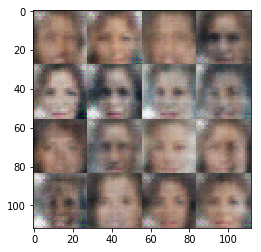

Epoch 1/8... Discriminator Loss: 0.0628... Generator Loss: 4.5601
Epoch 1/8... Discriminator Loss: 2.1484... Generator Loss: 9.3954
Epoch 1/8... Discriminator Loss: 0.1371... Generator Loss: 3.4797
Epoch 1/8... Discriminator Loss: 0.1416... Generator Loss: 3.0183
Epoch 1/8... Discriminator Loss: 0.1813... Generator Loss: 3.2205
Epoch 1/8... Discriminator Loss: 0.0328... Generator Loss: 5.2802
Epoch 1/8... Discriminator Loss: 0.1226... Generator Loss: 3.7032
Epoch 1/8... Discriminator Loss: 0.0060... Generator Loss: 10.1332
Epoch 1/8... Discriminator Loss: 0.0437... Generator Loss: 4.9975
Epoch 1/8... Discriminator Loss: 0.2713... Generator Loss: 2.1451


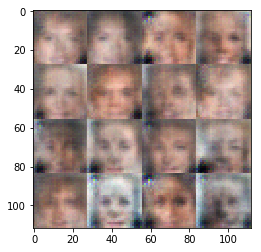

Epoch 1/8... Discriminator Loss: 0.2137... Generator Loss: 5.1133
Epoch 1/8... Discriminator Loss: 1.8383... Generator Loss: 7.6531
Epoch 1/8... Discriminator Loss: 0.2289... Generator Loss: 5.0699
Epoch 1/8... Discriminator Loss: 0.7796... Generator Loss: 3.2019
Epoch 1/8... Discriminator Loss: 0.2851... Generator Loss: 3.7609
Epoch 1/8... Discriminator Loss: 0.0493... Generator Loss: 4.1725
Epoch 1/8... Discriminator Loss: 0.1897... Generator Loss: 5.4165
Epoch 1/8... Discriminator Loss: 0.1344... Generator Loss: 3.1722
Epoch 1/8... Discriminator Loss: 0.0465... Generator Loss: 5.3879
Epoch 1/8... Discriminator Loss: 0.2807... Generator Loss: 5.8778


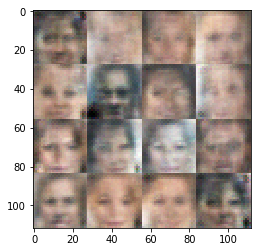

Epoch 1/8... Discriminator Loss: 0.0070... Generator Loss: 11.7871
Epoch 1/8... Discriminator Loss: 0.0233... Generator Loss: 12.3945
Epoch 1/8... Discriminator Loss: 0.1009... Generator Loss: 2.9978
Epoch 1/8... Discriminator Loss: 0.0656... Generator Loss: 3.5156
Epoch 1/8... Discriminator Loss: 0.3809... Generator Loss: 1.5919
Epoch 1/8... Discriminator Loss: 0.7255... Generator Loss: 1.2950
Epoch 1/8... Discriminator Loss: 0.0126... Generator Loss: 8.0412
Epoch 1/8... Discriminator Loss: 5.3312... Generator Loss: 7.2179
Epoch 1/8... Discriminator Loss: 0.2291... Generator Loss: 2.2055
Epoch 1/8... Discriminator Loss: 0.0858... Generator Loss: 8.3907


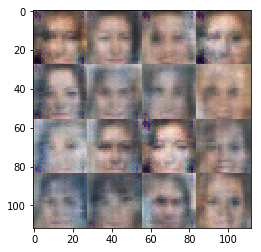

Epoch 1/8... Discriminator Loss: 0.0423... Generator Loss: 5.3924
Epoch 1/8... Discriminator Loss: 0.0675... Generator Loss: 4.4812
Epoch 1/8... Discriminator Loss: 0.0495... Generator Loss: 5.1836
Epoch 1/8... Discriminator Loss: 0.1836... Generator Loss: 11.0606
Epoch 1/8... Discriminator Loss: 0.0315... Generator Loss: 5.9895
Epoch 1/8... Discriminator Loss: 0.0298... Generator Loss: 5.2938
Epoch 1/8... Discriminator Loss: 0.1696... Generator Loss: 2.4203
Epoch 1/8... Discriminator Loss: 0.7089... Generator Loss: 1.0710
Epoch 1/8... Discriminator Loss: 0.0555... Generator Loss: 4.6947
Epoch 1/8... Discriminator Loss: 0.0797... Generator Loss: 3.2604


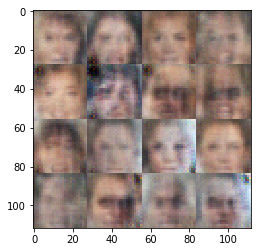

Epoch 1/8... Discriminator Loss: 0.0204... Generator Loss: 11.9145
Epoch 1/8... Discriminator Loss: 0.0147... Generator Loss: 7.0005
Epoch 1/8... Discriminator Loss: 0.0095... Generator Loss: 12.5009
Epoch 1/8... Discriminator Loss: 0.0118... Generator Loss: 5.6938
Epoch 1/8... Discriminator Loss: 0.3124... Generator Loss: 2.3572
Epoch 1/8... Discriminator Loss: 7.0190... Generator Loss: 0.0131
Epoch 1/8... Discriminator Loss: 0.0844... Generator Loss: 4.2119
Epoch 1/8... Discriminator Loss: 0.0191... Generator Loss: 6.0773
Epoch 1/8... Discriminator Loss: 0.3153... Generator Loss: 5.9625
Epoch 1/8... Discriminator Loss: 0.2443... Generator Loss: 2.0996


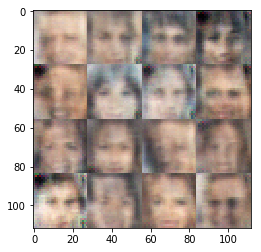

Epoch 1/8... Discriminator Loss: 0.1361... Generator Loss: 9.6754
Epoch 1/8... Discriminator Loss: 0.0249... Generator Loss: 10.3776
Epoch 1/8... Discriminator Loss: 0.0832... Generator Loss: 6.8010
Epoch 1/8... Discriminator Loss: 0.0515... Generator Loss: 8.7214
Epoch 1/8... Discriminator Loss: 0.0446... Generator Loss: 7.2959
Epoch 1/8... Discriminator Loss: 0.1240... Generator Loss: 2.7953
Epoch 1/8... Discriminator Loss: 0.0241... Generator Loss: 9.5451
Epoch 1/8... Discriminator Loss: 0.0295... Generator Loss: 5.7971
Epoch 1/8... Discriminator Loss: 0.0068... Generator Loss: 10.8773
Epoch 1/8... Discriminator Loss: 1.6892... Generator Loss: 0.4672


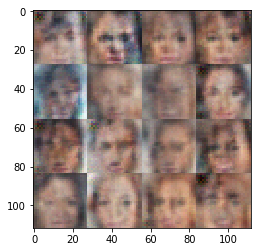

Epoch 1/8... Discriminator Loss: 0.9161... Generator Loss: 0.9887
Epoch 1/8... Discriminator Loss: 0.9234... Generator Loss: 0.9677
Epoch 1/8... Discriminator Loss: 0.0460... Generator Loss: 5.0189
Epoch 1/8... Discriminator Loss: 0.1111... Generator Loss: 3.3166
Epoch 1/8... Discriminator Loss: 3.3356... Generator Loss: 0.2307
Epoch 1/8... Discriminator Loss: 0.1106... Generator Loss: 9.1992
Epoch 1/8... Discriminator Loss: 0.3541... Generator Loss: 1.6544
Epoch 1/8... Discriminator Loss: 0.1271... Generator Loss: 9.4403
Epoch 1/8... Discriminator Loss: 0.5166... Generator Loss: 1.1686
Epoch 1/8... Discriminator Loss: 0.6421... Generator Loss: 1.5344


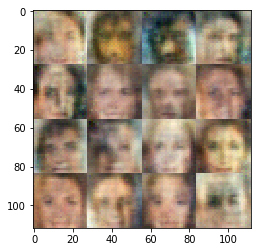

Epoch 1/8... Discriminator Loss: 0.7201... Generator Loss: 9.7492
Epoch 1/8... Discriminator Loss: 0.0949... Generator Loss: 3.5425
Epoch 1/8... Discriminator Loss: 0.0620... Generator Loss: 13.5475
Epoch 1/8... Discriminator Loss: 0.1803... Generator Loss: 7.6815
Epoch 1/8... Discriminator Loss: 0.3789... Generator Loss: 1.6773
Epoch 1/8... Discriminator Loss: 0.0789... Generator Loss: 5.4558
Epoch 1/8... Discriminator Loss: 0.1381... Generator Loss: 6.4432
Epoch 1/8... Discriminator Loss: 0.2130... Generator Loss: 2.4343
Epoch 1/8... Discriminator Loss: 1.0966... Generator Loss: 1.3594
Epoch 1/8... Discriminator Loss: 1.2398... Generator Loss: 0.5646


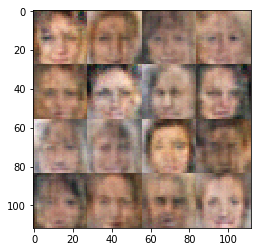

Epoch 1/8... Discriminator Loss: 0.0866... Generator Loss: 8.6844
Epoch 1/8... Discriminator Loss: 0.4928... Generator Loss: 2.3779
Epoch 1/8... Discriminator Loss: 1.3189... Generator Loss: 0.6025
Epoch 1/8... Discriminator Loss: 1.1608... Generator Loss: 0.6818
Epoch 1/8... Discriminator Loss: 0.1876... Generator Loss: 8.1473
Epoch 1/8... Discriminator Loss: 0.4638... Generator Loss: 1.5493
Epoch 1/8... Discriminator Loss: 0.0323... Generator Loss: 12.9054
Epoch 1/8... Discriminator Loss: 0.1263... Generator Loss: 4.2679
Epoch 1/8... Discriminator Loss: 0.0275... Generator Loss: 7.5080
Epoch 1/8... Discriminator Loss: 0.2421... Generator Loss: 2.1796


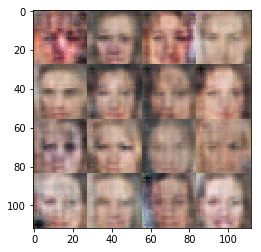

Epoch 1/8... Discriminator Loss: 0.2637... Generator Loss: 5.3837
Epoch 1/8... Discriminator Loss: 0.0168... Generator Loss: 8.9261
Epoch 1/8... Discriminator Loss: 1.2599... Generator Loss: 10.5492
Epoch 1/8... Discriminator Loss: 0.4663... Generator Loss: 2.6767
Epoch 1/8... Discriminator Loss: 0.2296... Generator Loss: 4.2305
Epoch 1/8... Discriminator Loss: 1.6567... Generator Loss: 0.6992
Epoch 1/8... Discriminator Loss: 0.9613... Generator Loss: 0.9085
Epoch 1/8... Discriminator Loss: 0.0982... Generator Loss: 5.0284
Epoch 1/8... Discriminator Loss: 0.0533... Generator Loss: 9.8396
Epoch 1/8... Discriminator Loss: 0.1264... Generator Loss: 6.0901


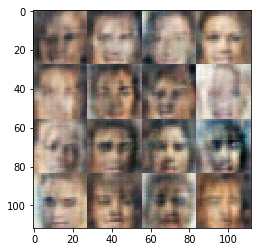

Epoch 1/8... Discriminator Loss: 0.1512... Generator Loss: 5.0296
Epoch 1/8... Discriminator Loss: 0.0088... Generator Loss: 8.0946
Epoch 1/8... Discriminator Loss: 0.2186... Generator Loss: 3.2610
Epoch 1/8... Discriminator Loss: 0.1594... Generator Loss: 2.9051
Epoch 1/8... Discriminator Loss: 0.0365... Generator Loss: 10.6002
Epoch 1/8... Discriminator Loss: 1.3379... Generator Loss: 0.6787
Epoch 1/8... Discriminator Loss: 1.5520... Generator Loss: 5.8208
Epoch 1/8... Discriminator Loss: 0.3282... Generator Loss: 1.8876
Epoch 1/8... Discriminator Loss: 0.1075... Generator Loss: 3.3989
Epoch 1/8... Discriminator Loss: 1.0552... Generator Loss: 0.6449


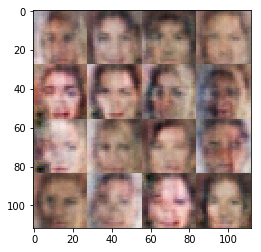

Epoch 1/8... Discriminator Loss: 2.4287... Generator Loss: 0.1242
Epoch 1/8... Discriminator Loss: 0.5055... Generator Loss: 2.1069
Epoch 1/8... Discriminator Loss: 0.2207... Generator Loss: 4.8992
Epoch 1/8... Discriminator Loss: 0.0818... Generator Loss: 4.6832
Epoch 1/8... Discriminator Loss: 0.0300... Generator Loss: 9.8066
Epoch 1/8... Discriminator Loss: 1.1851... Generator Loss: 0.5692
Epoch 1/8... Discriminator Loss: 0.3264... Generator Loss: 1.8911
Epoch 1/8... Discriminator Loss: 0.0158... Generator Loss: 8.5266
Epoch 1/8... Discriminator Loss: 0.0160... Generator Loss: 15.0734
Epoch 1/8... Discriminator Loss: 0.0801... Generator Loss: 16.1135


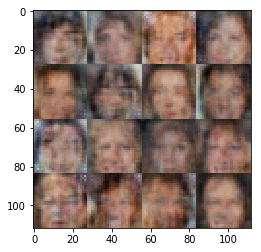

Epoch 1/8... Discriminator Loss: 0.2568... Generator Loss: 6.0893
Epoch 1/8... Discriminator Loss: 1.2055... Generator Loss: 11.7237
Epoch 1/8... Discriminator Loss: 0.3773... Generator Loss: 5.2493
Epoch 1/8... Discriminator Loss: 0.2418... Generator Loss: 2.6976
Epoch 1/8... Discriminator Loss: 0.4313... Generator Loss: 2.8397
Epoch 1/8... Discriminator Loss: 0.1665... Generator Loss: 3.8495
Epoch 1/8... Discriminator Loss: 0.8753... Generator Loss: 0.7836
Epoch 1/8... Discriminator Loss: 0.4710... Generator Loss: 1.4616
Epoch 1/8... Discriminator Loss: 0.0543... Generator Loss: 5.3488
Epoch 1/8... Discriminator Loss: 0.1052... Generator Loss: 6.3279


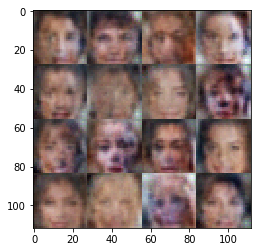

Epoch 1/8... Discriminator Loss: 0.0136... Generator Loss: 11.6816
Epoch 1/8... Discriminator Loss: 0.0135... Generator Loss: 8.8925
Epoch 1/8... Discriminator Loss: 0.0590... Generator Loss: 4.8858
Epoch 1/8... Discriminator Loss: 0.0475... Generator Loss: 5.4977
Epoch 1/8... Discriminator Loss: 3.0531... Generator Loss: 0.1001
Epoch 1/8... Discriminator Loss: 0.1072... Generator Loss: 4.7051
Epoch 1/8... Discriminator Loss: 0.3181... Generator Loss: 2.1805
Epoch 1/8... Discriminator Loss: 0.0478... Generator Loss: 11.0473
Epoch 1/8... Discriminator Loss: 0.0470... Generator Loss: 5.1170
Epoch 1/8... Discriminator Loss: 0.2271... Generator Loss: 3.1002


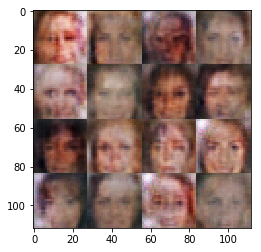

Epoch 1/8... Discriminator Loss: 0.0312... Generator Loss: 7.2498
Epoch 1/8... Discriminator Loss: 0.0100... Generator Loss: 16.6544
Epoch 1/8... Discriminator Loss: 0.0575... Generator Loss: 5.3256
Epoch 1/8... Discriminator Loss: 1.3580... Generator Loss: 1.9070
Epoch 1/8... Discriminator Loss: 0.0972... Generator Loss: 4.0714
Epoch 1/8... Discriminator Loss: 0.9684... Generator Loss: 8.6844
Epoch 1/8... Discriminator Loss: 0.2239... Generator Loss: 6.2116
Epoch 1/8... Discriminator Loss: 0.0173... Generator Loss: 11.8069
Epoch 1/8... Discriminator Loss: 0.6253... Generator Loss: 1.6074
Epoch 1/8... Discriminator Loss: 0.0244... Generator Loss: 8.8446


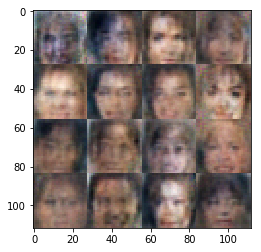

Epoch 1/8... Discriminator Loss: 2.6157... Generator Loss: 0.1235
Epoch 1/8... Discriminator Loss: 0.0061... Generator Loss: 11.4698
Epoch 1/8... Discriminator Loss: 0.4242... Generator Loss: 1.6991
Epoch 1/8... Discriminator Loss: 0.0091... Generator Loss: 9.1649
Epoch 1/8... Discriminator Loss: 0.0445... Generator Loss: 9.3559
Epoch 1/8... Discriminator Loss: 0.0396... Generator Loss: 9.1638
Epoch 1/8... Discriminator Loss: 0.4358... Generator Loss: 1.7242
Epoch 1/8... Discriminator Loss: 0.0231... Generator Loss: 5.0808
Epoch 1/8... Discriminator Loss: 0.0128... Generator Loss: 9.9410
Epoch 1/8... Discriminator Loss: 0.0151... Generator Loss: 9.5606


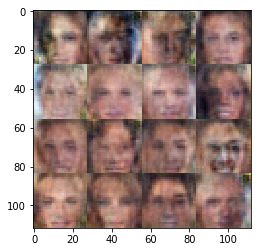

Epoch 1/8... Discriminator Loss: 0.1059... Generator Loss: 3.2994
Epoch 1/8... Discriminator Loss: 0.0084... Generator Loss: 15.1992
Epoch 1/8... Discriminator Loss: 0.1333... Generator Loss: 2.7683
Epoch 1/8... Discriminator Loss: 0.8742... Generator Loss: 2.1930
Epoch 1/8... Discriminator Loss: 0.6949... Generator Loss: 2.2401
Epoch 1/8... Discriminator Loss: 0.6653... Generator Loss: 1.1339
Epoch 1/8... Discriminator Loss: 0.5986... Generator Loss: 1.3351
Epoch 1/8... Discriminator Loss: 0.1557... Generator Loss: 3.1084
Epoch 1/8... Discriminator Loss: 0.7305... Generator Loss: 1.1812
Epoch 1/8... Discriminator Loss: 1.2142... Generator Loss: 1.2644


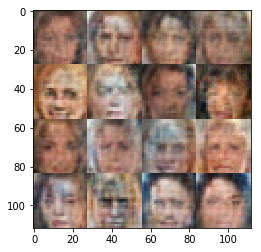

Epoch 1/8... Discriminator Loss: 0.3835... Generator Loss: 2.5472
Epoch 1/8... Discriminator Loss: 1.7387... Generator Loss: 6.1212
Epoch 1/8... Discriminator Loss: 0.5720... Generator Loss: 3.2780
Epoch 1/8... Discriminator Loss: 0.4681... Generator Loss: 1.5470
Epoch 1/8... Discriminator Loss: 0.1058... Generator Loss: 3.5502
Epoch 1/8... Discriminator Loss: 0.1037... Generator Loss: 5.6285
Epoch 1/8... Discriminator Loss: 0.8037... Generator Loss: 2.0401
Epoch 1/8... Discriminator Loss: 2.2205... Generator Loss: 0.1959
Epoch 1/8... Discriminator Loss: 0.0089... Generator Loss: 7.3157
Epoch 1/8... Discriminator Loss: 0.0418... Generator Loss: 5.5091


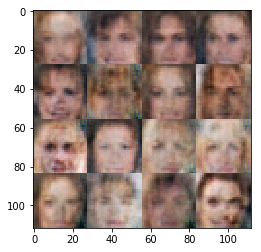

Epoch 1/8... Discriminator Loss: 0.2661... Generator Loss: 2.6744
Epoch 1/8... Discriminator Loss: 0.1907... Generator Loss: 3.0226
Epoch 1/8... Discriminator Loss: 0.0240... Generator Loss: 8.5587
Epoch 1/8... Discriminator Loss: 0.0481... Generator Loss: 4.9078
Epoch 1/8... Discriminator Loss: 1.0793... Generator Loss: 0.5762
Epoch 1/8... Discriminator Loss: 0.0228... Generator Loss: 7.2103
Epoch 1/8... Discriminator Loss: 1.7518... Generator Loss: 8.3744
Epoch 1/8... Discriminator Loss: 0.2357... Generator Loss: 7.6139
Epoch 1/8... Discriminator Loss: 0.0982... Generator Loss: 3.5448
Epoch 1/8... Discriminator Loss: 0.0209... Generator Loss: 10.2827


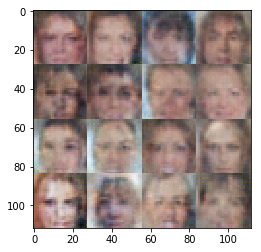

Epoch 1/8... Discriminator Loss: 0.0425... Generator Loss: 4.2603
Epoch 1/8... Discriminator Loss: 0.0079... Generator Loss: 7.3735
Epoch 1/8... Discriminator Loss: 0.0298... Generator Loss: 6.1823
Epoch 1/8... Discriminator Loss: 0.0420... Generator Loss: 10.1706
Epoch 1/8... Discriminator Loss: 3.5362... Generator Loss: 5.5487
Epoch 1/8... Discriminator Loss: 0.8861... Generator Loss: 1.2803
Epoch 1/8... Discriminator Loss: 0.1312... Generator Loss: 10.7155
Epoch 1/8... Discriminator Loss: 1.8137... Generator Loss: 0.2698
Epoch 1/8... Discriminator Loss: 1.3939... Generator Loss: 0.5244
Epoch 1/8... Discriminator Loss: 0.0362... Generator Loss: 5.5999


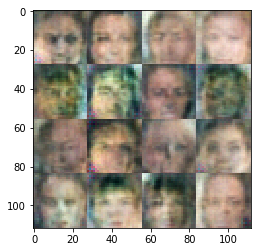

Epoch 1/8... Discriminator Loss: 0.2887... Generator Loss: 2.3119
Epoch 1/8... Discriminator Loss: 0.0822... Generator Loss: 10.5757
Epoch 1/8... Discriminator Loss: 0.0157... Generator Loss: 6.5934
Epoch 1/8... Discriminator Loss: 0.0651... Generator Loss: 11.7941
Epoch 1/8... Discriminator Loss: 0.0763... Generator Loss: 12.7682
Epoch 1/8... Discriminator Loss: 0.1371... Generator Loss: 2.7660
Epoch 1/8... Discriminator Loss: 0.0212... Generator Loss: 7.5001
Epoch 1/8... Discriminator Loss: 0.0071... Generator Loss: 12.7882
Epoch 1/8... Discriminator Loss: 0.0272... Generator Loss: 5.1399
Epoch 1/8... Discriminator Loss: 1.9545... Generator Loss: 9.3935


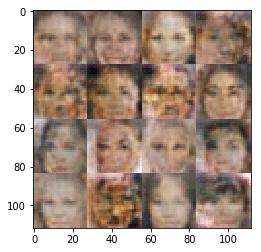

Epoch 1/8... Discriminator Loss: 0.0195... Generator Loss: 7.4156
Epoch 1/8... Discriminator Loss: 0.1024... Generator Loss: 8.9381
Epoch 1/8... Discriminator Loss: 0.0918... Generator Loss: 15.5841
Epoch 1/8... Discriminator Loss: 0.8831... Generator Loss: 1.9424
Epoch 1/8... Discriminator Loss: 0.1374... Generator Loss: 3.4645
Epoch 1/8... Discriminator Loss: 1.4871... Generator Loss: 0.3593
Epoch 2/8... Discriminator Loss: 1.1773... Generator Loss: 1.6853
Epoch 2/8... Discriminator Loss: 0.9951... Generator Loss: 0.8642
Epoch 2/8... Discriminator Loss: 2.0633... Generator Loss: 0.2022
Epoch 2/8... Discriminator Loss: 0.5262... Generator Loss: 1.4865


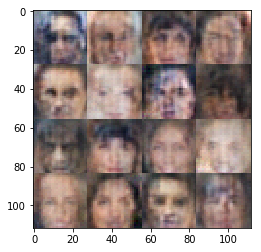

Epoch 2/8... Discriminator Loss: 0.1432... Generator Loss: 6.0179
Epoch 2/8... Discriminator Loss: 0.0294... Generator Loss: 7.1254
Epoch 2/8... Discriminator Loss: 0.3559... Generator Loss: 1.5282
Epoch 2/8... Discriminator Loss: 0.4394... Generator Loss: 1.4110
Epoch 2/8... Discriminator Loss: 0.0365... Generator Loss: 5.1139
Epoch 2/8... Discriminator Loss: 0.1245... Generator Loss: 2.9152
Epoch 2/8... Discriminator Loss: 0.2085... Generator Loss: 2.4140
Epoch 2/8... Discriminator Loss: 0.0127... Generator Loss: 7.5841
Epoch 2/8... Discriminator Loss: 0.0119... Generator Loss: 15.6538
Epoch 2/8... Discriminator Loss: 0.8979... Generator Loss: 0.7432


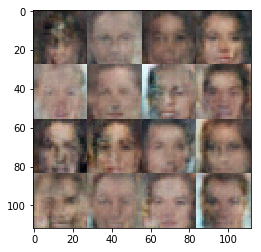

Epoch 2/8... Discriminator Loss: 1.5971... Generator Loss: 2.1827
Epoch 2/8... Discriminator Loss: 0.1132... Generator Loss: 6.4701
Epoch 2/8... Discriminator Loss: 1.4280... Generator Loss: 1.1802
Epoch 2/8... Discriminator Loss: 0.6034... Generator Loss: 7.3379
Epoch 2/8... Discriminator Loss: 0.4819... Generator Loss: 8.2584
Epoch 2/8... Discriminator Loss: 0.0193... Generator Loss: 14.1524
Epoch 2/8... Discriminator Loss: 0.0361... Generator Loss: 4.7310
Epoch 2/8... Discriminator Loss: 0.0363... Generator Loss: 7.4373
Epoch 2/8... Discriminator Loss: 0.2947... Generator Loss: 2.0457
Epoch 2/8... Discriminator Loss: 0.0264... Generator Loss: 13.9199


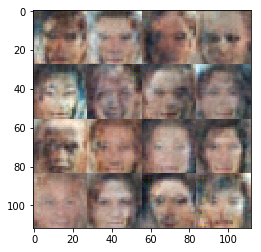

Epoch 2/8... Discriminator Loss: 0.4916... Generator Loss: 1.3880
Epoch 2/8... Discriminator Loss: 0.2491... Generator Loss: 2.2142
Epoch 2/8... Discriminator Loss: 0.0073... Generator Loss: 8.2270
Epoch 2/8... Discriminator Loss: 0.0229... Generator Loss: 7.0329
Epoch 2/8... Discriminator Loss: 0.0248... Generator Loss: 7.7533
Epoch 2/8... Discriminator Loss: 0.0095... Generator Loss: 13.2823
Epoch 2/8... Discriminator Loss: 0.3370... Generator Loss: 2.2019
Epoch 2/8... Discriminator Loss: 0.0790... Generator Loss: 9.5455
Epoch 2/8... Discriminator Loss: 0.0070... Generator Loss: 11.6537
Epoch 2/8... Discriminator Loss: 0.6178... Generator Loss: 1.7482


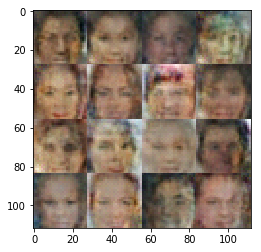

Epoch 2/8... Discriminator Loss: 0.0126... Generator Loss: 10.4444
Epoch 2/8... Discriminator Loss: 0.1269... Generator Loss: 5.3366
Epoch 2/8... Discriminator Loss: 0.0572... Generator Loss: 11.2849
Epoch 2/8... Discriminator Loss: 1.1676... Generator Loss: 0.7263
Epoch 2/8... Discriminator Loss: 3.0768... Generator Loss: 0.0639
Epoch 2/8... Discriminator Loss: 0.0507... Generator Loss: 5.6535
Epoch 2/8... Discriminator Loss: 0.0349... Generator Loss: 7.5279
Epoch 2/8... Discriminator Loss: 0.0258... Generator Loss: 8.7684
Epoch 2/8... Discriminator Loss: 0.0372... Generator Loss: 8.7732
Epoch 2/8... Discriminator Loss: 0.0743... Generator Loss: 13.2883


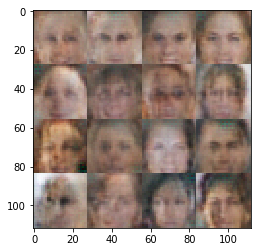

Epoch 2/8... Discriminator Loss: 0.0329... Generator Loss: 8.6141
Epoch 2/8... Discriminator Loss: 0.9093... Generator Loss: 11.8870
Epoch 2/8... Discriminator Loss: 0.0927... Generator Loss: 6.0898
Epoch 2/8... Discriminator Loss: 0.0232... Generator Loss: 7.2884
Epoch 2/8... Discriminator Loss: 0.0336... Generator Loss: 11.5383
Epoch 2/8... Discriminator Loss: 0.0805... Generator Loss: 3.7884
Epoch 2/8... Discriminator Loss: 0.1816... Generator Loss: 3.1710
Epoch 2/8... Discriminator Loss: 1.1079... Generator Loss: 0.6751
Epoch 2/8... Discriminator Loss: 0.9490... Generator Loss: 2.6979
Epoch 2/8... Discriminator Loss: 0.0824... Generator Loss: 2.8856


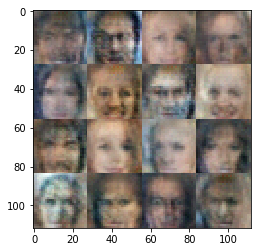

Epoch 2/8... Discriminator Loss: 0.6549... Generator Loss: 4.2910
Epoch 2/8... Discriminator Loss: 1.7413... Generator Loss: 0.3200
Epoch 2/8... Discriminator Loss: 0.8269... Generator Loss: 10.0830
Epoch 2/8... Discriminator Loss: 0.1947... Generator Loss: 2.1608
Epoch 2/8... Discriminator Loss: 0.0107... Generator Loss: 9.3863
Epoch 2/8... Discriminator Loss: 0.2129... Generator Loss: 2.4338
Epoch 2/8... Discriminator Loss: 0.1231... Generator Loss: 10.9230
Epoch 2/8... Discriminator Loss: 0.1628... Generator Loss: 2.3593
Epoch 2/8... Discriminator Loss: 0.0260... Generator Loss: 8.0530
Epoch 2/8... Discriminator Loss: 0.0343... Generator Loss: 4.8030


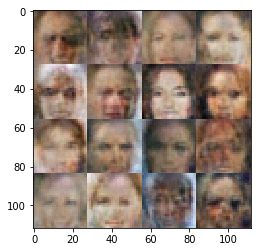

Epoch 2/8... Discriminator Loss: 0.0881... Generator Loss: 12.2876
Epoch 2/8... Discriminator Loss: 0.0262... Generator Loss: 10.7146
Epoch 2/8... Discriminator Loss: 0.0202... Generator Loss: 7.1130
Epoch 2/8... Discriminator Loss: 0.0318... Generator Loss: 17.2094
Epoch 2/8... Discriminator Loss: 0.0224... Generator Loss: 11.6076
Epoch 2/8... Discriminator Loss: 6.2996... Generator Loss: 4.8765
Epoch 2/8... Discriminator Loss: 1.0386... Generator Loss: 1.1013
Epoch 2/8... Discriminator Loss: 1.0158... Generator Loss: 0.8925
Epoch 2/8... Discriminator Loss: 1.3359... Generator Loss: 0.4945
Epoch 2/8... Discriminator Loss: 1.2383... Generator Loss: 0.5516


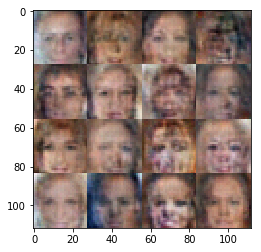

Epoch 2/8... Discriminator Loss: 0.9557... Generator Loss: 2.3613
Epoch 2/8... Discriminator Loss: 0.2470... Generator Loss: 3.1689
Epoch 2/8... Discriminator Loss: 2.6838... Generator Loss: 0.1095
Epoch 2/8... Discriminator Loss: 0.2031... Generator Loss: 2.4517
Epoch 2/8... Discriminator Loss: 1.1577... Generator Loss: 0.5527
Epoch 2/8... Discriminator Loss: 1.9794... Generator Loss: 0.2212
Epoch 2/8... Discriminator Loss: 0.6245... Generator Loss: 1.1013
Epoch 2/8... Discriminator Loss: 0.2543... Generator Loss: 2.0186
Epoch 2/8... Discriminator Loss: 0.2085... Generator Loss: 2.1032
Epoch 2/8... Discriminator Loss: 0.8516... Generator Loss: 1.0698


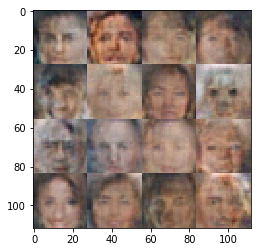

Epoch 2/8... Discriminator Loss: 0.5613... Generator Loss: 2.1257
Epoch 2/8... Discriminator Loss: 0.1514... Generator Loss: 3.6871
Epoch 2/8... Discriminator Loss: 0.2718... Generator Loss: 5.4143
Epoch 2/8... Discriminator Loss: 1.1597... Generator Loss: 4.8814
Epoch 2/8... Discriminator Loss: 0.0749... Generator Loss: 6.6387
Epoch 2/8... Discriminator Loss: 0.1723... Generator Loss: 5.3006
Epoch 2/8... Discriminator Loss: 0.4736... Generator Loss: 10.3795
Epoch 2/8... Discriminator Loss: 0.8366... Generator Loss: 4.3827
Epoch 2/8... Discriminator Loss: 0.1925... Generator Loss: 2.5030
Epoch 2/8... Discriminator Loss: 0.9470... Generator Loss: 1.0342


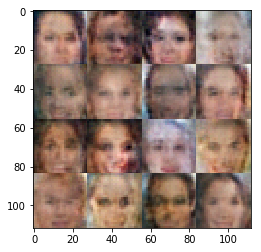

Epoch 2/8... Discriminator Loss: 0.1009... Generator Loss: 9.6189
Epoch 2/8... Discriminator Loss: 0.3153... Generator Loss: 1.9891
Epoch 2/8... Discriminator Loss: 1.0906... Generator Loss: 0.6046
Epoch 2/8... Discriminator Loss: 0.0999... Generator Loss: 13.0780
Epoch 2/8... Discriminator Loss: 0.0369... Generator Loss: 6.8809
Epoch 2/8... Discriminator Loss: 0.0442... Generator Loss: 4.8143
Epoch 2/8... Discriminator Loss: 0.0627... Generator Loss: 10.5478
Epoch 2/8... Discriminator Loss: 0.0091... Generator Loss: 6.3219
Epoch 2/8... Discriminator Loss: 0.0126... Generator Loss: 11.8533
Epoch 2/8... Discriminator Loss: 0.2319... Generator Loss: 4.3476


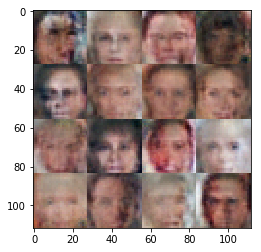

Epoch 2/8... Discriminator Loss: 0.9252... Generator Loss: 0.8442
Epoch 2/8... Discriminator Loss: 0.3475... Generator Loss: 1.8123
Epoch 2/8... Discriminator Loss: 0.0271... Generator Loss: 6.9235
Epoch 2/8... Discriminator Loss: 0.0463... Generator Loss: 4.6072
Epoch 2/8... Discriminator Loss: 0.0141... Generator Loss: 8.2631
Epoch 2/8... Discriminator Loss: 0.5386... Generator Loss: 1.2790
Epoch 2/8... Discriminator Loss: 0.5770... Generator Loss: 1.1186
Epoch 2/8... Discriminator Loss: 0.0443... Generator Loss: 8.4651
Epoch 2/8... Discriminator Loss: 0.0148... Generator Loss: 7.6001
Epoch 2/8... Discriminator Loss: 1.8022... Generator Loss: 0.5902


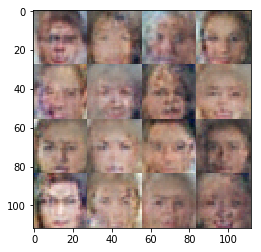

Epoch 2/8... Discriminator Loss: 1.1937... Generator Loss: 0.5702
Epoch 2/8... Discriminator Loss: 1.0405... Generator Loss: 0.7349
Epoch 2/8... Discriminator Loss: 1.1517... Generator Loss: 0.7547
Epoch 2/8... Discriminator Loss: 1.6689... Generator Loss: 0.2839
Epoch 2/8... Discriminator Loss: 0.9624... Generator Loss: 0.9281
Epoch 2/8... Discriminator Loss: 0.8750... Generator Loss: 1.3592
Epoch 2/8... Discriminator Loss: 0.9988... Generator Loss: 1.0355
Epoch 2/8... Discriminator Loss: 1.5701... Generator Loss: 0.4287
Epoch 2/8... Discriminator Loss: 1.0140... Generator Loss: 1.0547
Epoch 2/8... Discriminator Loss: 0.2791... Generator Loss: 3.8826


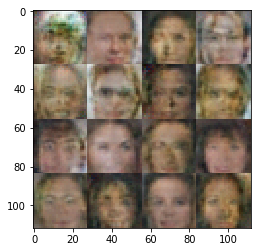

Epoch 2/8... Discriminator Loss: 0.2717... Generator Loss: 2.1683
Epoch 2/8... Discriminator Loss: 2.2990... Generator Loss: 4.0628
Epoch 2/8... Discriminator Loss: 0.7933... Generator Loss: 1.3833
Epoch 2/8... Discriminator Loss: 1.1672... Generator Loss: 1.3277
Epoch 2/8... Discriminator Loss: 1.1118... Generator Loss: 0.9279
Epoch 2/8... Discriminator Loss: 1.1045... Generator Loss: 0.7291
Epoch 2/8... Discriminator Loss: 1.1247... Generator Loss: 0.8870
Epoch 2/8... Discriminator Loss: 0.6414... Generator Loss: 8.7936
Epoch 2/8... Discriminator Loss: 0.3586... Generator Loss: 2.0094
Epoch 2/8... Discriminator Loss: 1.7172... Generator Loss: 0.2740


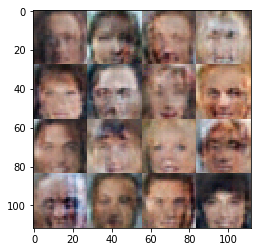

Epoch 2/8... Discriminator Loss: 1.5035... Generator Loss: 0.3690
Epoch 2/8... Discriminator Loss: 0.5780... Generator Loss: 1.4802
Epoch 2/8... Discriminator Loss: 0.6345... Generator Loss: 1.2681
Epoch 2/8... Discriminator Loss: 1.4094... Generator Loss: 0.4827
Epoch 2/8... Discriminator Loss: 0.0460... Generator Loss: 5.2488
Epoch 2/8... Discriminator Loss: 0.8222... Generator Loss: 0.9158
Epoch 2/8... Discriminator Loss: 0.1717... Generator Loss: 2.7405
Epoch 2/8... Discriminator Loss: 1.1741... Generator Loss: 0.5293
Epoch 2/8... Discriminator Loss: 1.6902... Generator Loss: 0.2624
Epoch 2/8... Discriminator Loss: 0.8345... Generator Loss: 0.7906


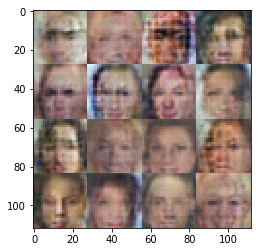

Epoch 2/8... Discriminator Loss: 0.0487... Generator Loss: 8.1584
Epoch 2/8... Discriminator Loss: 0.1772... Generator Loss: 2.7882
Epoch 2/8... Discriminator Loss: 0.2271... Generator Loss: 2.1415
Epoch 2/8... Discriminator Loss: 0.1238... Generator Loss: 3.3395
Epoch 2/8... Discriminator Loss: 0.0533... Generator Loss: 9.1384
Epoch 2/8... Discriminator Loss: 0.0525... Generator Loss: 4.3053
Epoch 2/8... Discriminator Loss: 0.0509... Generator Loss: 6.7972
Epoch 2/8... Discriminator Loss: 0.0256... Generator Loss: 7.9161
Epoch 2/8... Discriminator Loss: 0.5199... Generator Loss: 1.7319
Epoch 2/8... Discriminator Loss: 1.0695... Generator Loss: 0.7025


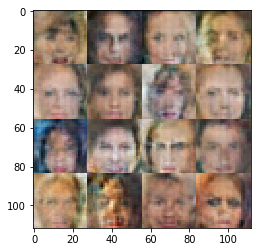

Epoch 2/8... Discriminator Loss: 0.7753... Generator Loss: 1.0270
Epoch 2/8... Discriminator Loss: 0.2203... Generator Loss: 2.5681
Epoch 2/8... Discriminator Loss: 0.0815... Generator Loss: 4.6892
Epoch 2/8... Discriminator Loss: 0.0630... Generator Loss: 4.8116
Epoch 2/8... Discriminator Loss: 0.0449... Generator Loss: 9.9594
Epoch 2/8... Discriminator Loss: 1.8376... Generator Loss: 0.2635
Epoch 2/8... Discriminator Loss: 0.0652... Generator Loss: 5.6260
Epoch 2/8... Discriminator Loss: 0.0802... Generator Loss: 4.6658
Epoch 2/8... Discriminator Loss: 0.9515... Generator Loss: 0.8108
Epoch 2/8... Discriminator Loss: 1.2893... Generator Loss: 0.6634


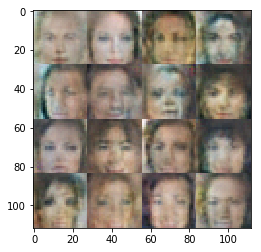

Epoch 2/8... Discriminator Loss: 0.2634... Generator Loss: 2.3144
Epoch 2/8... Discriminator Loss: 0.0402... Generator Loss: 10.7423
Epoch 2/8... Discriminator Loss: 0.2948... Generator Loss: 2.7482
Epoch 2/8... Discriminator Loss: 0.2222... Generator Loss: 2.3784
Epoch 2/8... Discriminator Loss: 1.4078... Generator Loss: 0.6040
Epoch 2/8... Discriminator Loss: 2.1387... Generator Loss: 0.1919
Epoch 2/8... Discriminator Loss: 0.5203... Generator Loss: 1.6726
Epoch 2/8... Discriminator Loss: 0.1394... Generator Loss: 4.0556
Epoch 2/8... Discriminator Loss: 0.1512... Generator Loss: 3.6662
Epoch 2/8... Discriminator Loss: 0.8509... Generator Loss: 2.3839


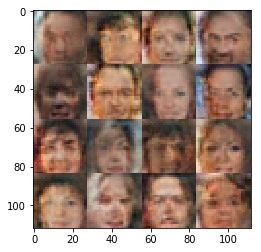

Epoch 2/8... Discriminator Loss: 0.2324... Generator Loss: 3.5722
Epoch 2/8... Discriminator Loss: 0.3193... Generator Loss: 2.0394
Epoch 2/8... Discriminator Loss: 0.1943... Generator Loss: 2.8933
Epoch 2/8... Discriminator Loss: 0.1627... Generator Loss: 2.7667
Epoch 2/8... Discriminator Loss: 0.1023... Generator Loss: 8.9695
Epoch 2/8... Discriminator Loss: 0.0440... Generator Loss: 6.0773
Epoch 2/8... Discriminator Loss: 0.4876... Generator Loss: 1.4290
Epoch 2/8... Discriminator Loss: 0.1332... Generator Loss: 3.6779
Epoch 2/8... Discriminator Loss: 0.0372... Generator Loss: 5.7285
Epoch 2/8... Discriminator Loss: 0.0260... Generator Loss: 9.0554


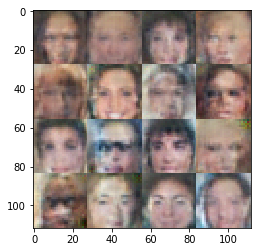

Epoch 2/8... Discriminator Loss: 0.4417... Generator Loss: 13.2760
Epoch 2/8... Discriminator Loss: 0.0336... Generator Loss: 7.2763
Epoch 2/8... Discriminator Loss: 0.0301... Generator Loss: 8.1432
Epoch 2/8... Discriminator Loss: 0.1277... Generator Loss: 3.2230
Epoch 2/8... Discriminator Loss: 0.7688... Generator Loss: 12.5982
Epoch 2/8... Discriminator Loss: 2.0613... Generator Loss: 2.3282
Epoch 2/8... Discriminator Loss: 0.9148... Generator Loss: 1.1744
Epoch 2/8... Discriminator Loss: 1.1043... Generator Loss: 0.6237
Epoch 2/8... Discriminator Loss: 0.9137... Generator Loss: 1.4402
Epoch 2/8... Discriminator Loss: 0.8993... Generator Loss: 1.9083


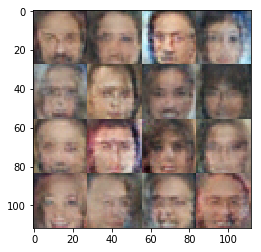

Epoch 2/8... Discriminator Loss: 0.4483... Generator Loss: 2.7901
Epoch 2/8... Discriminator Loss: 0.7627... Generator Loss: 0.9118
Epoch 2/8... Discriminator Loss: 0.2268... Generator Loss: 3.6251
Epoch 2/8... Discriminator Loss: 1.4137... Generator Loss: 1.0128
Epoch 2/8... Discriminator Loss: 1.0306... Generator Loss: 1.1759
Epoch 2/8... Discriminator Loss: 0.9486... Generator Loss: 0.9284
Epoch 2/8... Discriminator Loss: 0.7463... Generator Loss: 1.3079
Epoch 2/8... Discriminator Loss: 0.9111... Generator Loss: 1.0713
Epoch 2/8... Discriminator Loss: 1.1581... Generator Loss: 0.8533
Epoch 2/8... Discriminator Loss: 1.2847... Generator Loss: 0.4860


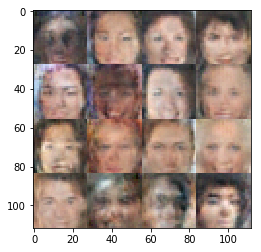

Epoch 2/8... Discriminator Loss: 1.0733... Generator Loss: 0.6543
Epoch 2/8... Discriminator Loss: 0.6738... Generator Loss: 1.2538
Epoch 2/8... Discriminator Loss: 0.1670... Generator Loss: 3.4534
Epoch 2/8... Discriminator Loss: 0.1839... Generator Loss: 3.9094
Epoch 2/8... Discriminator Loss: 0.6048... Generator Loss: 1.4291
Epoch 2/8... Discriminator Loss: 1.9445... Generator Loss: 1.0626
Epoch 2/8... Discriminator Loss: 1.3553... Generator Loss: 0.5276
Epoch 2/8... Discriminator Loss: 0.6082... Generator Loss: 1.3718
Epoch 2/8... Discriminator Loss: 0.3617... Generator Loss: 2.5587
Epoch 2/8... Discriminator Loss: 0.0680... Generator Loss: 6.7770


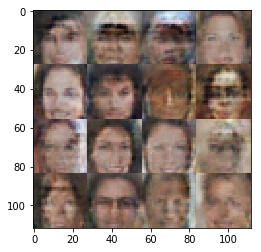

Epoch 2/8... Discriminator Loss: 0.2185... Generator Loss: 3.3955
Epoch 2/8... Discriminator Loss: 0.0722... Generator Loss: 4.8809
Epoch 2/8... Discriminator Loss: 0.1763... Generator Loss: 8.5076
Epoch 2/8... Discriminator Loss: 0.1782... Generator Loss: 3.2946
Epoch 2/8... Discriminator Loss: 0.1953... Generator Loss: 4.5477
Epoch 2/8... Discriminator Loss: 0.1854... Generator Loss: 2.4610
Epoch 2/8... Discriminator Loss: 0.4319... Generator Loss: 1.6165
Epoch 2/8... Discriminator Loss: 0.3209... Generator Loss: 2.0725
Epoch 2/8... Discriminator Loss: 0.0107... Generator Loss: 8.8800
Epoch 2/8... Discriminator Loss: 1.5727... Generator Loss: 0.3035


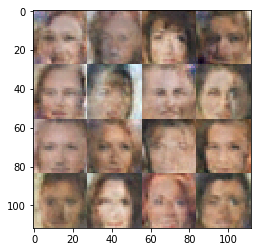

Epoch 2/8... Discriminator Loss: 2.0573... Generator Loss: 0.4819
Epoch 2/8... Discriminator Loss: 0.7673... Generator Loss: 1.4829
Epoch 2/8... Discriminator Loss: 1.0801... Generator Loss: 0.8325
Epoch 2/8... Discriminator Loss: 1.0067... Generator Loss: 1.0066
Epoch 2/8... Discriminator Loss: 0.8561... Generator Loss: 0.8793
Epoch 2/8... Discriminator Loss: 1.0740... Generator Loss: 0.6176
Epoch 2/8... Discriminator Loss: 0.9250... Generator Loss: 0.8034
Epoch 2/8... Discriminator Loss: 1.2545... Generator Loss: 1.6412
Epoch 2/8... Discriminator Loss: 0.9929... Generator Loss: 0.8441
Epoch 2/8... Discriminator Loss: 1.1625... Generator Loss: 0.5537


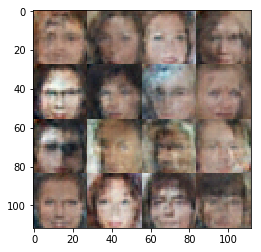

Epoch 2/8... Discriminator Loss: 1.1202... Generator Loss: 0.5810
Epoch 2/8... Discriminator Loss: 1.2650... Generator Loss: 0.4966
Epoch 2/8... Discriminator Loss: 0.9128... Generator Loss: 1.0373
Epoch 2/8... Discriminator Loss: 1.2457... Generator Loss: 0.4793
Epoch 2/8... Discriminator Loss: 0.9387... Generator Loss: 0.8773
Epoch 2/8... Discriminator Loss: 0.6205... Generator Loss: 2.7947
Epoch 2/8... Discriminator Loss: 4.1658... Generator Loss: 4.0661
Epoch 2/8... Discriminator Loss: 1.2558... Generator Loss: 0.6539
Epoch 2/8... Discriminator Loss: 0.7071... Generator Loss: 1.4229
Epoch 2/8... Discriminator Loss: 1.1819... Generator Loss: 0.6145


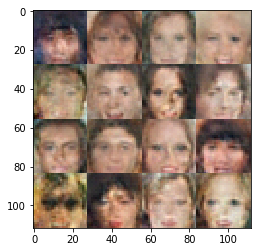

Epoch 2/8... Discriminator Loss: 1.0113... Generator Loss: 0.7142
Epoch 2/8... Discriminator Loss: 1.2005... Generator Loss: 0.5664
Epoch 2/8... Discriminator Loss: 1.0203... Generator Loss: 1.0481
Epoch 2/8... Discriminator Loss: 0.5821... Generator Loss: 1.5322
Epoch 2/8... Discriminator Loss: 1.0799... Generator Loss: 0.7799
Epoch 2/8... Discriminator Loss: 0.3752... Generator Loss: 3.6972
Epoch 2/8... Discriminator Loss: 0.3702... Generator Loss: 1.7373
Epoch 2/8... Discriminator Loss: 0.1098... Generator Loss: 4.2608
Epoch 2/8... Discriminator Loss: 0.2782... Generator Loss: 2.7044
Epoch 2/8... Discriminator Loss: 0.9584... Generator Loss: 0.7340


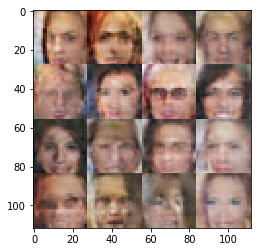

Epoch 2/8... Discriminator Loss: 0.0723... Generator Loss: 7.2244
Epoch 2/8... Discriminator Loss: 0.0535... Generator Loss: 6.2610
Epoch 2/8... Discriminator Loss: 1.6214... Generator Loss: 0.3715
Epoch 2/8... Discriminator Loss: 0.3645... Generator Loss: 2.0679
Epoch 2/8... Discriminator Loss: 1.0567... Generator Loss: 2.1790
Epoch 2/8... Discriminator Loss: 0.9968... Generator Loss: 0.6298
Epoch 2/8... Discriminator Loss: 0.9470... Generator Loss: 0.8780
Epoch 2/8... Discriminator Loss: 0.9401... Generator Loss: 0.9044
Epoch 2/8... Discriminator Loss: 1.3205... Generator Loss: 0.4773
Epoch 2/8... Discriminator Loss: 0.6712... Generator Loss: 1.2618


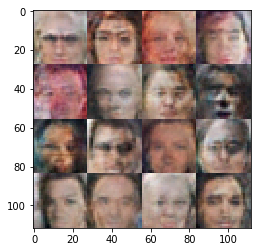

Epoch 2/8... Discriminator Loss: 1.2953... Generator Loss: 0.5649
Epoch 2/8... Discriminator Loss: 0.3855... Generator Loss: 1.6201
Epoch 2/8... Discriminator Loss: 0.1505... Generator Loss: 4.7597
Epoch 2/8... Discriminator Loss: 0.0810... Generator Loss: 5.2790
Epoch 2/8... Discriminator Loss: 0.0963... Generator Loss: 5.0974
Epoch 2/8... Discriminator Loss: 0.2471... Generator Loss: 6.1699
Epoch 2/8... Discriminator Loss: 0.0690... Generator Loss: 5.0446
Epoch 2/8... Discriminator Loss: 0.6217... Generator Loss: 1.1149
Epoch 2/8... Discriminator Loss: 1.0062... Generator Loss: 0.9227
Epoch 2/8... Discriminator Loss: 0.4820... Generator Loss: 1.8371


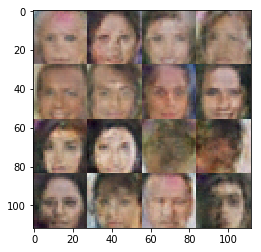

Epoch 2/8... Discriminator Loss: 0.8353... Generator Loss: 4.9539
Epoch 2/8... Discriminator Loss: 0.0381... Generator Loss: 5.1832
Epoch 2/8... Discriminator Loss: 0.5623... Generator Loss: 2.2588
Epoch 2/8... Discriminator Loss: 0.0671... Generator Loss: 5.4829
Epoch 2/8... Discriminator Loss: 2.2851... Generator Loss: 0.1682
Epoch 2/8... Discriminator Loss: 2.6197... Generator Loss: 0.1816
Epoch 2/8... Discriminator Loss: 0.8499... Generator Loss: 1.0584
Epoch 2/8... Discriminator Loss: 0.2393... Generator Loss: 3.7828
Epoch 2/8... Discriminator Loss: 0.3851... Generator Loss: 8.5935
Epoch 2/8... Discriminator Loss: 0.0589... Generator Loss: 6.7156


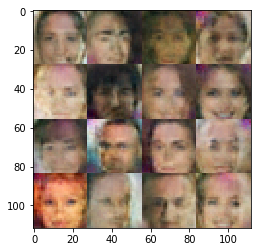

Epoch 2/8... Discriminator Loss: 0.1680... Generator Loss: 11.0505
Epoch 2/8... Discriminator Loss: 0.0843... Generator Loss: 8.0543
Epoch 2/8... Discriminator Loss: 0.3311... Generator Loss: 3.0263
Epoch 2/8... Discriminator Loss: 0.3963... Generator Loss: 1.7213
Epoch 2/8... Discriminator Loss: 0.0356... Generator Loss: 9.4553
Epoch 2/8... Discriminator Loss: 1.0233... Generator Loss: 1.1268
Epoch 2/8... Discriminator Loss: 0.7560... Generator Loss: 1.1821


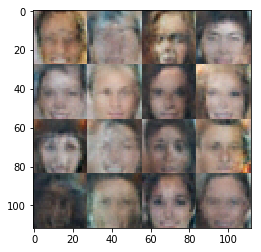

Epoch 2/8... Discriminator Loss: 1.0132... Generator Loss: 0.5324
Epoch 2/8... Discriminator Loss: 0.9010... Generator Loss: 0.9464
Epoch 2/8... Discriminator Loss: 1.3850... Generator Loss: 0.4707
Epoch 2/8... Discriminator Loss: 1.2448... Generator Loss: 0.4656
Epoch 2/8... Discriminator Loss: 1.1142... Generator Loss: 0.6467
Epoch 2/8... Discriminator Loss: 0.9339... Generator Loss: 0.9621
Epoch 2/8... Discriminator Loss: 1.0350... Generator Loss: 0.9471
Epoch 2/8... Discriminator Loss: 1.4795... Generator Loss: 0.4407
Epoch 2/8... Discriminator Loss: 1.3169... Generator Loss: 0.4420
Epoch 2/8... Discriminator Loss: 0.8978... Generator Loss: 1.2898


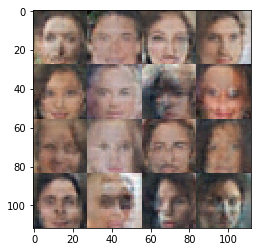

Epoch 2/8... Discriminator Loss: 0.6841... Generator Loss: 1.0504
Epoch 2/8... Discriminator Loss: 0.9744... Generator Loss: 0.7606
Epoch 2/8... Discriminator Loss: 1.0819... Generator Loss: 1.3510
Epoch 3/8... Discriminator Loss: 0.6302... Generator Loss: 1.5139
Epoch 3/8... Discriminator Loss: 1.1692... Generator Loss: 0.5317
Epoch 3/8... Discriminator Loss: 1.2147... Generator Loss: 0.4963
Epoch 3/8... Discriminator Loss: 1.1131... Generator Loss: 0.6160
Epoch 3/8... Discriminator Loss: 0.7590... Generator Loss: 1.1619
Epoch 3/8... Discriminator Loss: 1.1438... Generator Loss: 0.6643
Epoch 3/8... Discriminator Loss: 0.8625... Generator Loss: 1.4228


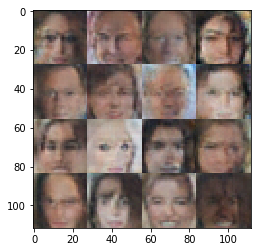

Epoch 3/8... Discriminator Loss: 1.2070... Generator Loss: 0.5432
Epoch 3/8... Discriminator Loss: 1.0472... Generator Loss: 0.7216
Epoch 3/8... Discriminator Loss: 1.3421... Generator Loss: 0.4311
Epoch 3/8... Discriminator Loss: 1.3799... Generator Loss: 0.5080
Epoch 3/8... Discriminator Loss: 1.4193... Generator Loss: 0.3781
Epoch 3/8... Discriminator Loss: 1.2736... Generator Loss: 0.4766
Epoch 3/8... Discriminator Loss: 0.8784... Generator Loss: 0.7544
Epoch 3/8... Discriminator Loss: 1.4643... Generator Loss: 0.4495
Epoch 3/8... Discriminator Loss: 1.0032... Generator Loss: 0.6989
Epoch 3/8... Discriminator Loss: 1.1933... Generator Loss: 0.5471


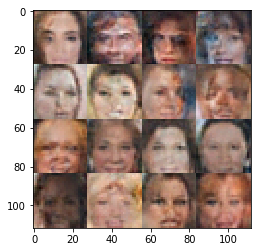

Epoch 3/8... Discriminator Loss: 0.9810... Generator Loss: 0.7788
Epoch 3/8... Discriminator Loss: 0.7701... Generator Loss: 1.0633
Epoch 3/8... Discriminator Loss: 1.1012... Generator Loss: 0.6282
Epoch 3/8... Discriminator Loss: 0.8972... Generator Loss: 0.9763
Epoch 3/8... Discriminator Loss: 0.8803... Generator Loss: 1.0381
Epoch 3/8... Discriminator Loss: 1.3074... Generator Loss: 2.0788
Epoch 3/8... Discriminator Loss: 0.9753... Generator Loss: 1.0279
Epoch 3/8... Discriminator Loss: 0.8555... Generator Loss: 1.0399
Epoch 3/8... Discriminator Loss: 1.1757... Generator Loss: 0.5346
Epoch 3/8... Discriminator Loss: 0.8185... Generator Loss: 1.2646


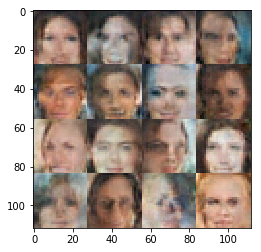

Epoch 3/8... Discriminator Loss: 1.0209... Generator Loss: 0.7090
Epoch 3/8... Discriminator Loss: 0.7745... Generator Loss: 1.2170
Epoch 3/8... Discriminator Loss: 1.2284... Generator Loss: 0.4819
Epoch 3/8... Discriminator Loss: 0.9128... Generator Loss: 0.9031
Epoch 3/8... Discriminator Loss: 0.7957... Generator Loss: 1.2089
Epoch 3/8... Discriminator Loss: 1.2006... Generator Loss: 0.6544
Epoch 3/8... Discriminator Loss: 1.2020... Generator Loss: 0.6266
Epoch 3/8... Discriminator Loss: 0.9745... Generator Loss: 0.8674
Epoch 3/8... Discriminator Loss: 0.8145... Generator Loss: 0.7943
Epoch 3/8... Discriminator Loss: 1.1635... Generator Loss: 0.5869


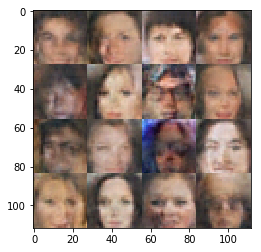

Epoch 3/8... Discriminator Loss: 1.3137... Generator Loss: 0.4250
Epoch 3/8... Discriminator Loss: 1.0680... Generator Loss: 0.6485
Epoch 3/8... Discriminator Loss: 1.1185... Generator Loss: 0.6190
Epoch 3/8... Discriminator Loss: 0.9694... Generator Loss: 1.0903
Epoch 3/8... Discriminator Loss: 1.9929... Generator Loss: 0.2031
Epoch 3/8... Discriminator Loss: 1.3687... Generator Loss: 0.4294
Epoch 3/8... Discriminator Loss: 1.1520... Generator Loss: 1.2338
Epoch 3/8... Discriminator Loss: 1.3794... Generator Loss: 0.4127
Epoch 3/8... Discriminator Loss: 0.8127... Generator Loss: 0.9804
Epoch 3/8... Discriminator Loss: 0.6656... Generator Loss: 1.7650


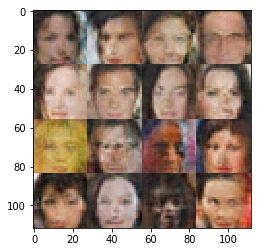

Epoch 3/8... Discriminator Loss: 1.0873... Generator Loss: 0.6095
Epoch 3/8... Discriminator Loss: 0.9330... Generator Loss: 1.1247
Epoch 3/8... Discriminator Loss: 1.1031... Generator Loss: 0.6691
Epoch 3/8... Discriminator Loss: 0.9502... Generator Loss: 0.8481
Epoch 3/8... Discriminator Loss: 1.2178... Generator Loss: 0.5305
Epoch 3/8... Discriminator Loss: 1.2245... Generator Loss: 0.4606
Epoch 3/8... Discriminator Loss: 1.0783... Generator Loss: 1.2848
Epoch 3/8... Discriminator Loss: 1.6516... Generator Loss: 0.2766
Epoch 3/8... Discriminator Loss: 0.7974... Generator Loss: 1.2336
Epoch 3/8... Discriminator Loss: 0.8754... Generator Loss: 1.0049


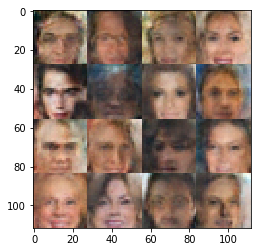

Epoch 3/8... Discriminator Loss: 0.6766... Generator Loss: 1.6467
Epoch 3/8... Discriminator Loss: 1.4012... Generator Loss: 0.4052
Epoch 3/8... Discriminator Loss: 0.7787... Generator Loss: 1.2488
Epoch 3/8... Discriminator Loss: 1.1064... Generator Loss: 0.6054
Epoch 3/8... Discriminator Loss: 0.9876... Generator Loss: 1.6679
Epoch 3/8... Discriminator Loss: 1.2092... Generator Loss: 0.6069
Epoch 3/8... Discriminator Loss: 1.1067... Generator Loss: 0.5599
Epoch 3/8... Discriminator Loss: 0.7197... Generator Loss: 1.2347
Epoch 3/8... Discriminator Loss: 0.9353... Generator Loss: 0.7071
Epoch 3/8... Discriminator Loss: 1.5313... Generator Loss: 0.3503


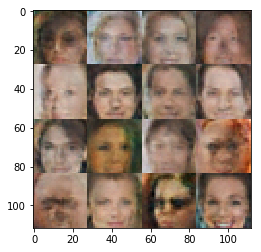

Epoch 3/8... Discriminator Loss: 1.5422... Generator Loss: 0.3235
Epoch 3/8... Discriminator Loss: 1.2526... Generator Loss: 0.4878
Epoch 3/8... Discriminator Loss: 1.2947... Generator Loss: 0.4383
Epoch 3/8... Discriminator Loss: 0.7640... Generator Loss: 1.2776
Epoch 3/8... Discriminator Loss: 0.6423... Generator Loss: 1.0741
Epoch 3/8... Discriminator Loss: 1.2899... Generator Loss: 0.4337
Epoch 3/8... Discriminator Loss: 1.3269... Generator Loss: 1.4911
Epoch 3/8... Discriminator Loss: 0.9613... Generator Loss: 0.9270
Epoch 3/8... Discriminator Loss: 1.0282... Generator Loss: 0.7158
Epoch 3/8... Discriminator Loss: 1.1530... Generator Loss: 0.7860


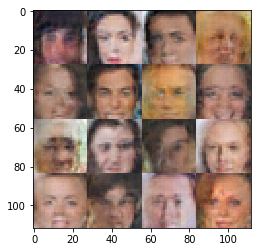

Epoch 3/8... Discriminator Loss: 0.8213... Generator Loss: 1.3201
Epoch 3/8... Discriminator Loss: 0.9760... Generator Loss: 1.5668
Epoch 3/8... Discriminator Loss: 0.8941... Generator Loss: 1.1460
Epoch 3/8... Discriminator Loss: 0.7813... Generator Loss: 0.9177
Epoch 3/8... Discriminator Loss: 1.1004... Generator Loss: 0.8064
Epoch 3/8... Discriminator Loss: 1.3675... Generator Loss: 0.6941
Epoch 3/8... Discriminator Loss: 0.8320... Generator Loss: 1.2723
Epoch 3/8... Discriminator Loss: 1.0172... Generator Loss: 1.1025
Epoch 3/8... Discriminator Loss: 0.7138... Generator Loss: 1.2221
Epoch 3/8... Discriminator Loss: 0.9588... Generator Loss: 0.8101


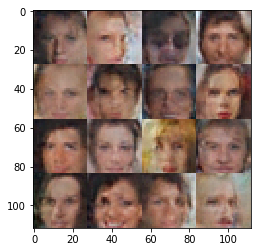

Epoch 3/8... Discriminator Loss: 1.2224... Generator Loss: 0.5973
Epoch 3/8... Discriminator Loss: 0.9807... Generator Loss: 1.0290
Epoch 3/8... Discriminator Loss: 0.8714... Generator Loss: 1.0576
Epoch 3/8... Discriminator Loss: 1.3315... Generator Loss: 0.4504
Epoch 3/8... Discriminator Loss: 0.9024... Generator Loss: 1.3927
Epoch 3/8... Discriminator Loss: 1.5988... Generator Loss: 0.3059
Epoch 3/8... Discriminator Loss: 1.1772... Generator Loss: 0.5491
Epoch 3/8... Discriminator Loss: 1.1581... Generator Loss: 1.0360
Epoch 3/8... Discriminator Loss: 0.9591... Generator Loss: 0.7757
Epoch 3/8... Discriminator Loss: 2.0579... Generator Loss: 0.1720


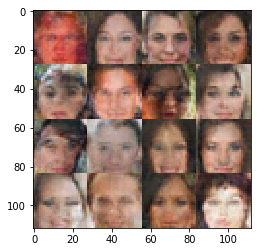

Epoch 3/8... Discriminator Loss: 1.0228... Generator Loss: 1.9691
Epoch 3/8... Discriminator Loss: 0.2212... Generator Loss: 2.7927
Epoch 3/8... Discriminator Loss: 0.1087... Generator Loss: 4.6983
Epoch 3/8... Discriminator Loss: 0.5508... Generator Loss: 5.0906
Epoch 3/8... Discriminator Loss: 1.9288... Generator Loss: 0.2042
Epoch 3/8... Discriminator Loss: 1.3394... Generator Loss: 0.4901
Epoch 3/8... Discriminator Loss: 1.3050... Generator Loss: 0.5208
Epoch 3/8... Discriminator Loss: 1.1916... Generator Loss: 0.5365
Epoch 3/8... Discriminator Loss: 0.7807... Generator Loss: 1.0941
Epoch 3/8... Discriminator Loss: 0.9120... Generator Loss: 1.1897


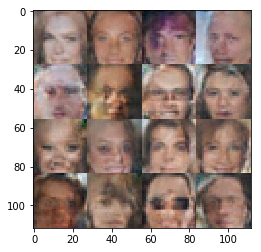

Epoch 3/8... Discriminator Loss: 1.0316... Generator Loss: 0.6676
Epoch 3/8... Discriminator Loss: 1.0454... Generator Loss: 1.3332
Epoch 3/8... Discriminator Loss: 0.9398... Generator Loss: 0.9690
Epoch 3/8... Discriminator Loss: 1.4886... Generator Loss: 0.3473
Epoch 3/8... Discriminator Loss: 0.8009... Generator Loss: 0.9575
Epoch 3/8... Discriminator Loss: 1.4353... Generator Loss: 1.6165
Epoch 3/8... Discriminator Loss: 0.8227... Generator Loss: 1.4423
Epoch 3/8... Discriminator Loss: 0.5893... Generator Loss: 1.2225
Epoch 3/8... Discriminator Loss: 1.1501... Generator Loss: 0.8258
Epoch 3/8... Discriminator Loss: 0.7635... Generator Loss: 1.0079


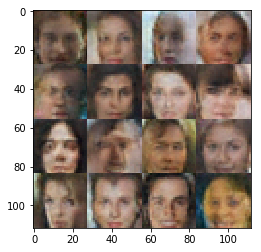

Epoch 3/8... Discriminator Loss: 0.8683... Generator Loss: 0.9117
Epoch 3/8... Discriminator Loss: 0.4020... Generator Loss: 2.0074
Epoch 3/8... Discriminator Loss: 1.3874... Generator Loss: 0.4114
Epoch 3/8... Discriminator Loss: 0.1139... Generator Loss: 5.4743
Epoch 3/8... Discriminator Loss: 0.1185... Generator Loss: 3.6118
Epoch 3/8... Discriminator Loss: 1.4581... Generator Loss: 0.3815
Epoch 3/8... Discriminator Loss: 0.2532... Generator Loss: 2.5197
Epoch 3/8... Discriminator Loss: 0.2329... Generator Loss: 2.9834
Epoch 3/8... Discriminator Loss: 1.5028... Generator Loss: 0.3917
Epoch 3/8... Discriminator Loss: 1.7013... Generator Loss: 0.4753


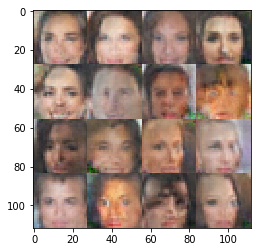

Epoch 3/8... Discriminator Loss: 0.9042... Generator Loss: 0.7532
Epoch 3/8... Discriminator Loss: 1.1419... Generator Loss: 0.6471
Epoch 3/8... Discriminator Loss: 1.6976... Generator Loss: 0.2924
Epoch 3/8... Discriminator Loss: 0.5161... Generator Loss: 1.7224
Epoch 3/8... Discriminator Loss: 0.5056... Generator Loss: 1.7484
Epoch 3/8... Discriminator Loss: 1.4778... Generator Loss: 0.3417
Epoch 3/8... Discriminator Loss: 0.3272... Generator Loss: 4.0330
Epoch 3/8... Discriminator Loss: 0.5377... Generator Loss: 1.6308
Epoch 3/8... Discriminator Loss: 0.7832... Generator Loss: 0.9367
Epoch 3/8... Discriminator Loss: 0.0470... Generator Loss: 8.4927


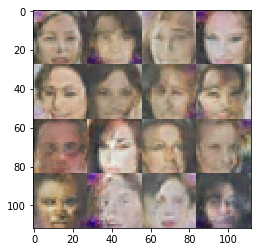

Epoch 3/8... Discriminator Loss: 0.0392... Generator Loss: 6.7061
Epoch 3/8... Discriminator Loss: 0.1423... Generator Loss: 6.6602
Epoch 3/8... Discriminator Loss: 0.1353... Generator Loss: 9.6128
Epoch 3/8... Discriminator Loss: 0.0648... Generator Loss: 4.8024
Epoch 3/8... Discriminator Loss: 0.1052... Generator Loss: 5.1915
Epoch 3/8... Discriminator Loss: 0.4838... Generator Loss: 7.5506
Epoch 3/8... Discriminator Loss: 0.2360... Generator Loss: 2.0365
Epoch 3/8... Discriminator Loss: 0.0532... Generator Loss: 12.0120
Epoch 3/8... Discriminator Loss: 0.1497... Generator Loss: 6.1984
Epoch 3/8... Discriminator Loss: 0.7683... Generator Loss: 11.0595


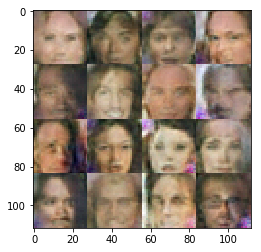

Epoch 3/8... Discriminator Loss: 4.2033... Generator Loss: 0.2968
Epoch 3/8... Discriminator Loss: 0.6599... Generator Loss: 3.0964
Epoch 3/8... Discriminator Loss: 0.7157... Generator Loss: 1.0323
Epoch 3/8... Discriminator Loss: 1.7886... Generator Loss: 0.2653
Epoch 3/8... Discriminator Loss: 1.7411... Generator Loss: 0.3188
Epoch 3/8... Discriminator Loss: 1.1155... Generator Loss: 1.5111
Epoch 3/8... Discriminator Loss: 0.6523... Generator Loss: 1.2165
Epoch 3/8... Discriminator Loss: 1.5233... Generator Loss: 0.3852
Epoch 3/8... Discriminator Loss: 1.0714... Generator Loss: 0.8590
Epoch 3/8... Discriminator Loss: 1.4417... Generator Loss: 0.5757


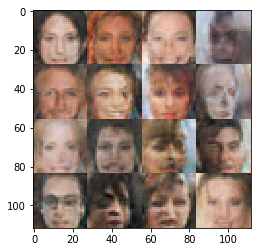

Epoch 3/8... Discriminator Loss: 0.7496... Generator Loss: 1.2256
Epoch 3/8... Discriminator Loss: 1.0816... Generator Loss: 0.7066
Epoch 3/8... Discriminator Loss: 0.9902... Generator Loss: 0.7373
Epoch 3/8... Discriminator Loss: 0.9743... Generator Loss: 0.9966
Epoch 3/8... Discriminator Loss: 1.3476... Generator Loss: 0.4383
Epoch 3/8... Discriminator Loss: 1.0577... Generator Loss: 0.6546
Epoch 3/8... Discriminator Loss: 0.9979... Generator Loss: 0.8521
Epoch 3/8... Discriminator Loss: 1.4862... Generator Loss: 0.3816
Epoch 3/8... Discriminator Loss: 1.2794... Generator Loss: 0.5226
Epoch 3/8... Discriminator Loss: 1.1245... Generator Loss: 0.6431


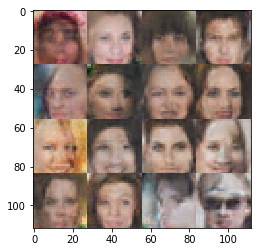

Epoch 3/8... Discriminator Loss: 0.9930... Generator Loss: 0.9855
Epoch 3/8... Discriminator Loss: 0.8791... Generator Loss: 1.1805
Epoch 3/8... Discriminator Loss: 1.3014... Generator Loss: 0.5321
Epoch 3/8... Discriminator Loss: 0.9059... Generator Loss: 0.7511
Epoch 3/8... Discriminator Loss: 0.5680... Generator Loss: 1.5627
Epoch 3/8... Discriminator Loss: 1.2991... Generator Loss: 0.5534
Epoch 3/8... Discriminator Loss: 0.7746... Generator Loss: 1.1642
Epoch 3/8... Discriminator Loss: 1.4443... Generator Loss: 0.5713
Epoch 3/8... Discriminator Loss: 1.2209... Generator Loss: 0.6362
Epoch 3/8... Discriminator Loss: 1.0011... Generator Loss: 1.1316


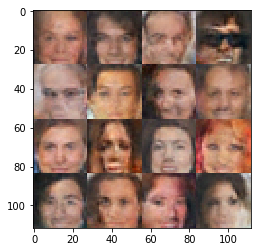

Epoch 3/8... Discriminator Loss: 1.2709... Generator Loss: 0.5251
Epoch 3/8... Discriminator Loss: 1.3053... Generator Loss: 0.4692
Epoch 3/8... Discriminator Loss: 1.0267... Generator Loss: 1.4608
Epoch 3/8... Discriminator Loss: 1.0122... Generator Loss: 0.6387
Epoch 3/8... Discriminator Loss: 1.2808... Generator Loss: 1.2446
Epoch 3/8... Discriminator Loss: 0.8580... Generator Loss: 1.2084
Epoch 3/8... Discriminator Loss: 0.8787... Generator Loss: 0.9657
Epoch 3/8... Discriminator Loss: 0.9640... Generator Loss: 0.7385
Epoch 3/8... Discriminator Loss: 1.1667... Generator Loss: 0.8648
Epoch 3/8... Discriminator Loss: 1.2234... Generator Loss: 0.6869


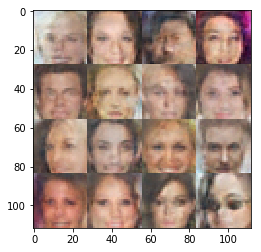

Epoch 3/8... Discriminator Loss: 1.6023... Generator Loss: 0.2941
Epoch 3/8... Discriminator Loss: 0.9468... Generator Loss: 1.1634
Epoch 3/8... Discriminator Loss: 1.0047... Generator Loss: 0.8966
Epoch 3/8... Discriminator Loss: 0.9364... Generator Loss: 0.8352
Epoch 3/8... Discriminator Loss: 1.5164... Generator Loss: 0.8055
Epoch 3/8... Discriminator Loss: 1.2420... Generator Loss: 0.6460
Epoch 3/8... Discriminator Loss: 1.2700... Generator Loss: 0.4915
Epoch 3/8... Discriminator Loss: 1.2959... Generator Loss: 0.4314
Epoch 3/8... Discriminator Loss: 1.1778... Generator Loss: 0.5869
Epoch 3/8... Discriminator Loss: 1.2597... Generator Loss: 0.5178


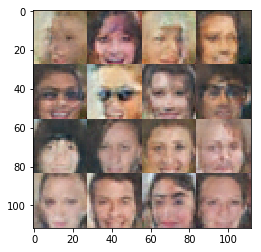

Epoch 3/8... Discriminator Loss: 1.3659... Generator Loss: 0.4150
Epoch 3/8... Discriminator Loss: 1.1619... Generator Loss: 0.5518
Epoch 3/8... Discriminator Loss: 1.3744... Generator Loss: 0.3897
Epoch 3/8... Discriminator Loss: 0.9714... Generator Loss: 0.9568
Epoch 3/8... Discriminator Loss: 1.1251... Generator Loss: 0.5365
Epoch 3/8... Discriminator Loss: 1.0595... Generator Loss: 0.6780
Epoch 3/8... Discriminator Loss: 1.1139... Generator Loss: 0.6169
Epoch 3/8... Discriminator Loss: 1.6755... Generator Loss: 0.2976
Epoch 3/8... Discriminator Loss: 0.8199... Generator Loss: 1.0362
Epoch 3/8... Discriminator Loss: 1.1426... Generator Loss: 0.5588


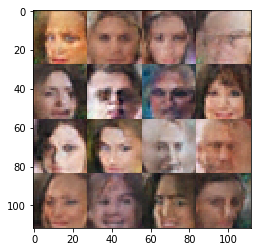

Epoch 3/8... Discriminator Loss: 1.0469... Generator Loss: 0.6513
Epoch 3/8... Discriminator Loss: 1.2213... Generator Loss: 0.5397
Epoch 3/8... Discriminator Loss: 1.3121... Generator Loss: 1.1374
Epoch 3/8... Discriminator Loss: 1.0478... Generator Loss: 0.6632
Epoch 3/8... Discriminator Loss: 0.8925... Generator Loss: 0.9233
Epoch 3/8... Discriminator Loss: 1.0727... Generator Loss: 1.0002
Epoch 3/8... Discriminator Loss: 1.0476... Generator Loss: 0.7434
Epoch 3/8... Discriminator Loss: 1.3150... Generator Loss: 0.5878
Epoch 3/8... Discriminator Loss: 1.3486... Generator Loss: 0.4287
Epoch 3/8... Discriminator Loss: 1.2710... Generator Loss: 0.4512


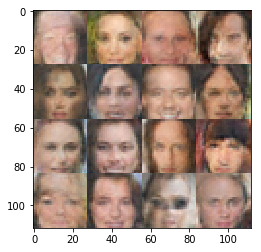

Epoch 3/8... Discriminator Loss: 1.4102... Generator Loss: 0.4865
Epoch 3/8... Discriminator Loss: 0.9664... Generator Loss: 0.9281
Epoch 3/8... Discriminator Loss: 1.1889... Generator Loss: 0.5582
Epoch 3/8... Discriminator Loss: 1.3167... Generator Loss: 0.4926
Epoch 3/8... Discriminator Loss: 1.4104... Generator Loss: 0.6359
Epoch 3/8... Discriminator Loss: 1.0184... Generator Loss: 0.6640
Epoch 3/8... Discriminator Loss: 1.0572... Generator Loss: 1.0091
Epoch 3/8... Discriminator Loss: 1.4865... Generator Loss: 0.3441
Epoch 3/8... Discriminator Loss: 0.8400... Generator Loss: 1.1054
Epoch 3/8... Discriminator Loss: 1.2157... Generator Loss: 0.7899


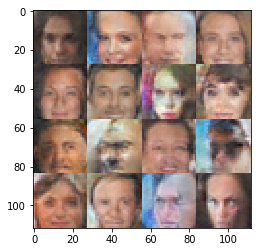

Epoch 3/8... Discriminator Loss: 0.4948... Generator Loss: 2.0399
Epoch 3/8... Discriminator Loss: 0.1388... Generator Loss: 3.7202
Epoch 3/8... Discriminator Loss: 0.4508... Generator Loss: 1.5250
Epoch 3/8... Discriminator Loss: 0.1135... Generator Loss: 4.9337
Epoch 3/8... Discriminator Loss: 0.9843... Generator Loss: 6.2505
Epoch 3/8... Discriminator Loss: 2.0592... Generator Loss: 0.2662
Epoch 3/8... Discriminator Loss: 3.5414... Generator Loss: 0.0503
Epoch 3/8... Discriminator Loss: 2.3353... Generator Loss: 0.1652
Epoch 3/8... Discriminator Loss: 0.0551... Generator Loss: 6.2527
Epoch 3/8... Discriminator Loss: 0.1970... Generator Loss: 3.4608


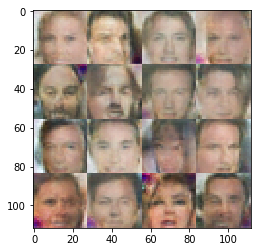

Epoch 3/8... Discriminator Loss: 0.0250... Generator Loss: 7.1000
Epoch 3/8... Discriminator Loss: 1.0488... Generator Loss: 0.7630
Epoch 3/8... Discriminator Loss: 0.1472... Generator Loss: 3.2966
Epoch 3/8... Discriminator Loss: 0.0387... Generator Loss: 4.4871
Epoch 3/8... Discriminator Loss: 1.4343... Generator Loss: 0.5002
Epoch 3/8... Discriminator Loss: 0.1314... Generator Loss: 11.9484
Epoch 3/8... Discriminator Loss: 0.0207... Generator Loss: 8.1778
Epoch 3/8... Discriminator Loss: 1.9986... Generator Loss: 0.2326
Epoch 3/8... Discriminator Loss: 0.1194... Generator Loss: 5.2786
Epoch 3/8... Discriminator Loss: 0.1998... Generator Loss: 9.5901


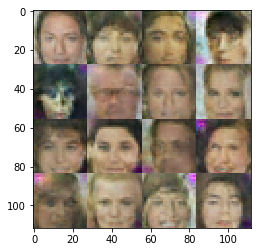

Epoch 3/8... Discriminator Loss: 0.1073... Generator Loss: 2.8371
Epoch 3/8... Discriminator Loss: 0.0252... Generator Loss: 7.4530
Epoch 3/8... Discriminator Loss: 0.8164... Generator Loss: 0.8221
Epoch 3/8... Discriminator Loss: 0.5752... Generator Loss: 1.2842
Epoch 3/8... Discriminator Loss: 0.8701... Generator Loss: 0.9629
Epoch 3/8... Discriminator Loss: 1.4071... Generator Loss: 0.5148
Epoch 3/8... Discriminator Loss: 1.6939... Generator Loss: 0.3040
Epoch 3/8... Discriminator Loss: 1.3369... Generator Loss: 0.4597
Epoch 3/8... Discriminator Loss: 1.2998... Generator Loss: 0.4344
Epoch 3/8... Discriminator Loss: 0.7378... Generator Loss: 0.9436


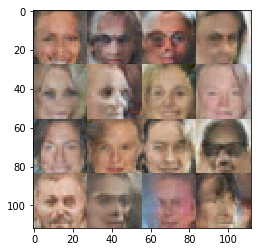

Epoch 3/8... Discriminator Loss: 1.0876... Generator Loss: 0.7101
Epoch 3/8... Discriminator Loss: 1.1078... Generator Loss: 0.9609
Epoch 3/8... Discriminator Loss: 1.2280... Generator Loss: 0.5832
Epoch 3/8... Discriminator Loss: 0.8077... Generator Loss: 0.7790
Epoch 3/8... Discriminator Loss: 1.0840... Generator Loss: 0.6781
Epoch 3/8... Discriminator Loss: 1.6919... Generator Loss: 0.2855
Epoch 3/8... Discriminator Loss: 1.1390... Generator Loss: 0.6466
Epoch 3/8... Discriminator Loss: 0.8329... Generator Loss: 0.9409
Epoch 3/8... Discriminator Loss: 0.9457... Generator Loss: 0.6990
Epoch 3/8... Discriminator Loss: 0.6817... Generator Loss: 1.1075


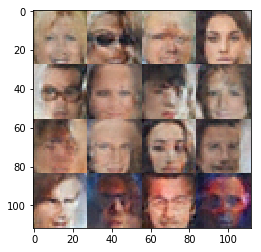

Epoch 3/8... Discriminator Loss: 2.4280... Generator Loss: 0.1246
Epoch 3/8... Discriminator Loss: 1.5747... Generator Loss: 0.3326
Epoch 3/8... Discriminator Loss: 1.2646... Generator Loss: 0.8369
Epoch 3/8... Discriminator Loss: 1.0228... Generator Loss: 0.8479
Epoch 3/8... Discriminator Loss: 0.6719... Generator Loss: 1.3537
Epoch 3/8... Discriminator Loss: 1.0007... Generator Loss: 0.7512
Epoch 3/8... Discriminator Loss: 1.0542... Generator Loss: 0.6470
Epoch 3/8... Discriminator Loss: 1.9121... Generator Loss: 0.2168
Epoch 3/8... Discriminator Loss: 0.7086... Generator Loss: 1.3197
Epoch 3/8... Discriminator Loss: 1.6564... Generator Loss: 0.3017


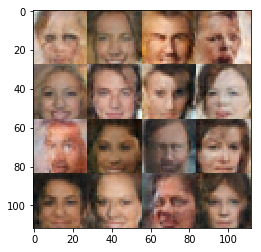

Epoch 3/8... Discriminator Loss: 1.1440... Generator Loss: 1.6971
Epoch 3/8... Discriminator Loss: 1.3326... Generator Loss: 0.5520
Epoch 3/8... Discriminator Loss: 0.9749... Generator Loss: 0.7610
Epoch 3/8... Discriminator Loss: 1.3125... Generator Loss: 0.4915
Epoch 3/8... Discriminator Loss: 1.3499... Generator Loss: 0.6103
Epoch 3/8... Discriminator Loss: 1.1965... Generator Loss: 0.9504
Epoch 3/8... Discriminator Loss: 1.5069... Generator Loss: 0.3465
Epoch 3/8... Discriminator Loss: 1.0930... Generator Loss: 1.0217
Epoch 3/8... Discriminator Loss: 1.1140... Generator Loss: 0.6934
Epoch 3/8... Discriminator Loss: 1.3180... Generator Loss: 0.6301


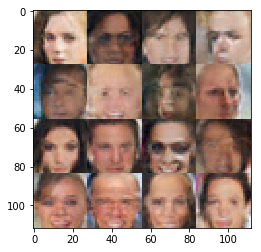

Epoch 3/8... Discriminator Loss: 1.4637... Generator Loss: 0.3742
Epoch 3/8... Discriminator Loss: 1.1609... Generator Loss: 0.6705
Epoch 3/8... Discriminator Loss: 1.3254... Generator Loss: 0.4165
Epoch 3/8... Discriminator Loss: 1.0572... Generator Loss: 0.9006
Epoch 3/8... Discriminator Loss: 1.4419... Generator Loss: 0.4148
Epoch 3/8... Discriminator Loss: 0.9673... Generator Loss: 0.9058
Epoch 3/8... Discriminator Loss: 1.0448... Generator Loss: 0.6759
Epoch 3/8... Discriminator Loss: 1.4311... Generator Loss: 0.4868
Epoch 3/8... Discriminator Loss: 1.7676... Generator Loss: 0.2555
Epoch 3/8... Discriminator Loss: 1.4967... Generator Loss: 0.5394


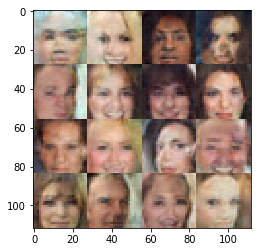

Epoch 3/8... Discriminator Loss: 0.9475... Generator Loss: 1.0930
Epoch 3/8... Discriminator Loss: 1.2015... Generator Loss: 0.5922
Epoch 3/8... Discriminator Loss: 1.1465... Generator Loss: 0.6265
Epoch 3/8... Discriminator Loss: 1.1246... Generator Loss: 0.8196
Epoch 3/8... Discriminator Loss: 1.2855... Generator Loss: 0.4757
Epoch 3/8... Discriminator Loss: 0.9917... Generator Loss: 0.7722
Epoch 3/8... Discriminator Loss: 1.0184... Generator Loss: 0.6960
Epoch 3/8... Discriminator Loss: 1.1593... Generator Loss: 0.6278
Epoch 3/8... Discriminator Loss: 1.6630... Generator Loss: 0.3940
Epoch 3/8... Discriminator Loss: 1.6365... Generator Loss: 0.2793


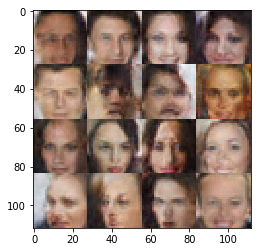

Epoch 3/8... Discriminator Loss: 1.5863... Generator Loss: 0.4840
Epoch 3/8... Discriminator Loss: 1.4451... Generator Loss: 0.4475
Epoch 3/8... Discriminator Loss: 1.2063... Generator Loss: 1.0005
Epoch 3/8... Discriminator Loss: 1.3842... Generator Loss: 0.4355
Epoch 3/8... Discriminator Loss: 1.0103... Generator Loss: 0.7079
Epoch 3/8... Discriminator Loss: 1.0279... Generator Loss: 0.6976
Epoch 3/8... Discriminator Loss: 0.8145... Generator Loss: 1.0547
Epoch 3/8... Discriminator Loss: 1.1537... Generator Loss: 0.6550
Epoch 3/8... Discriminator Loss: 1.2788... Generator Loss: 0.4993
Epoch 4/8... Discriminator Loss: 1.2309... Generator Loss: 0.7396


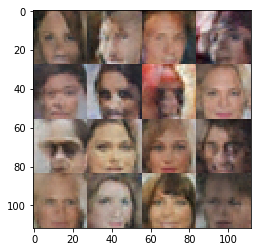

Epoch 4/8... Discriminator Loss: 1.4158... Generator Loss: 0.4017
Epoch 4/8... Discriminator Loss: 1.2429... Generator Loss: 0.5372
Epoch 4/8... Discriminator Loss: 0.8760... Generator Loss: 1.1656
Epoch 4/8... Discriminator Loss: 0.8020... Generator Loss: 1.2589
Epoch 4/8... Discriminator Loss: 1.4282... Generator Loss: 0.4009
Epoch 4/8... Discriminator Loss: 1.2078... Generator Loss: 0.8233
Epoch 4/8... Discriminator Loss: 1.1326... Generator Loss: 0.5999
Epoch 4/8... Discriminator Loss: 1.4426... Generator Loss: 0.3899
Epoch 4/8... Discriminator Loss: 1.5767... Generator Loss: 0.3303
Epoch 4/8... Discriminator Loss: 1.0744... Generator Loss: 0.8030


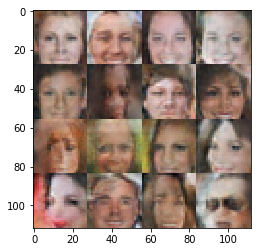

Epoch 4/8... Discriminator Loss: 1.5917... Generator Loss: 0.3444
Epoch 4/8... Discriminator Loss: 1.1589... Generator Loss: 0.5801
Epoch 4/8... Discriminator Loss: 1.0301... Generator Loss: 0.6592
Epoch 4/8... Discriminator Loss: 1.2134... Generator Loss: 0.4670
Epoch 4/8... Discriminator Loss: 1.0095... Generator Loss: 0.6954
Epoch 4/8... Discriminator Loss: 0.7983... Generator Loss: 0.9869
Epoch 4/8... Discriminator Loss: 1.2456... Generator Loss: 0.4659
Epoch 4/8... Discriminator Loss: 1.0698... Generator Loss: 0.6871
Epoch 4/8... Discriminator Loss: 1.1453... Generator Loss: 0.6161
Epoch 4/8... Discriminator Loss: 1.2831... Generator Loss: 0.6400


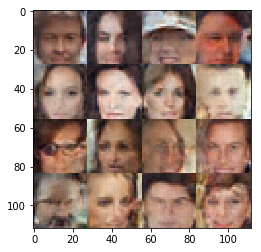

Epoch 4/8... Discriminator Loss: 1.1023... Generator Loss: 0.6163
Epoch 4/8... Discriminator Loss: 1.0708... Generator Loss: 0.6299
Epoch 4/8... Discriminator Loss: 1.3704... Generator Loss: 0.4012
Epoch 4/8... Discriminator Loss: 1.5457... Generator Loss: 0.3620
Epoch 4/8... Discriminator Loss: 1.0282... Generator Loss: 0.7625
Epoch 4/8... Discriminator Loss: 1.0394... Generator Loss: 0.6707
Epoch 4/8... Discriminator Loss: 1.2528... Generator Loss: 0.5842
Epoch 4/8... Discriminator Loss: 0.8192... Generator Loss: 0.9262
Epoch 4/8... Discriminator Loss: 1.2947... Generator Loss: 1.0978
Epoch 4/8... Discriminator Loss: 1.4064... Generator Loss: 0.5364


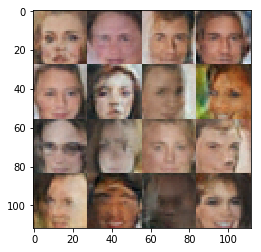

Epoch 4/8... Discriminator Loss: 1.4014... Generator Loss: 0.4391
Epoch 4/8... Discriminator Loss: 1.3073... Generator Loss: 0.4959
Epoch 4/8... Discriminator Loss: 1.1885... Generator Loss: 0.5761
Epoch 4/8... Discriminator Loss: 0.9850... Generator Loss: 0.6631
Epoch 4/8... Discriminator Loss: 1.1082... Generator Loss: 0.9039
Epoch 4/8... Discriminator Loss: 1.5908... Generator Loss: 0.4458
Epoch 4/8... Discriminator Loss: 1.0001... Generator Loss: 0.8245
Epoch 4/8... Discriminator Loss: 1.3527... Generator Loss: 0.5675
Epoch 4/8... Discriminator Loss: 1.2612... Generator Loss: 0.5183
Epoch 4/8... Discriminator Loss: 1.3373... Generator Loss: 0.4084


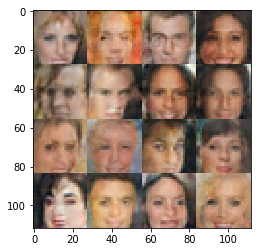

Epoch 4/8... Discriminator Loss: 0.5785... Generator Loss: 1.2748
Epoch 4/8... Discriminator Loss: 1.5560... Generator Loss: 0.3369
Epoch 4/8... Discriminator Loss: 0.6810... Generator Loss: 1.1179
Epoch 4/8... Discriminator Loss: 0.2708... Generator Loss: 2.1260
Epoch 4/8... Discriminator Loss: 0.1681... Generator Loss: 3.5034
Epoch 4/8... Discriminator Loss: 0.1960... Generator Loss: 2.8328
Epoch 4/8... Discriminator Loss: 0.2007... Generator Loss: 2.8815
Epoch 4/8... Discriminator Loss: 0.0837... Generator Loss: 3.9973
Epoch 4/8... Discriminator Loss: 0.0932... Generator Loss: 4.6866
Epoch 4/8... Discriminator Loss: 0.1522... Generator Loss: 3.1725


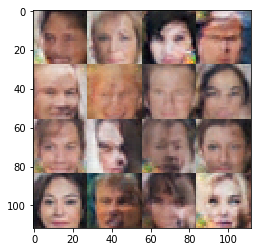

Epoch 4/8... Discriminator Loss: 0.5800... Generator Loss: 1.2073
Epoch 4/8... Discriminator Loss: 0.1468... Generator Loss: 2.9150
Epoch 4/8... Discriminator Loss: 0.4006... Generator Loss: 1.9425
Epoch 4/8... Discriminator Loss: 0.1740... Generator Loss: 5.8914
Epoch 4/8... Discriminator Loss: 0.4230... Generator Loss: 4.0039
Epoch 4/8... Discriminator Loss: 0.3866... Generator Loss: 1.7448
Epoch 4/8... Discriminator Loss: 2.4745... Generator Loss: 5.7001
Epoch 4/8... Discriminator Loss: 1.2860... Generator Loss: 0.4660
Epoch 4/8... Discriminator Loss: 1.4051... Generator Loss: 0.4020
Epoch 4/8... Discriminator Loss: 1.1270... Generator Loss: 0.5589


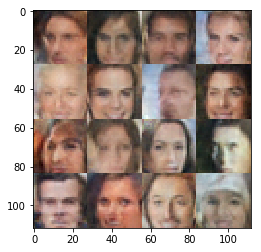

Epoch 4/8... Discriminator Loss: 1.5889... Generator Loss: 0.3613
Epoch 4/8... Discriminator Loss: 1.1147... Generator Loss: 0.6191
Epoch 4/8... Discriminator Loss: 0.7100... Generator Loss: 1.1775
Epoch 4/8... Discriminator Loss: 0.2125... Generator Loss: 5.4771
Epoch 4/8... Discriminator Loss: 0.0320... Generator Loss: 4.8587
Epoch 4/8... Discriminator Loss: 0.0697... Generator Loss: 8.1105
Epoch 4/8... Discriminator Loss: 0.0530... Generator Loss: 4.4479
Epoch 4/8... Discriminator Loss: 0.0254... Generator Loss: 8.4404
Epoch 4/8... Discriminator Loss: 1.3405... Generator Loss: 0.5154
Epoch 4/8... Discriminator Loss: 1.1454... Generator Loss: 0.6706


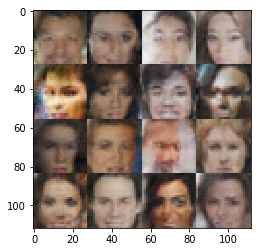

Epoch 4/8... Discriminator Loss: 1.2749... Generator Loss: 0.5012
Epoch 4/8... Discriminator Loss: 1.9325... Generator Loss: 0.2699
Epoch 4/8... Discriminator Loss: 1.3415... Generator Loss: 0.7902
Epoch 4/8... Discriminator Loss: 0.7957... Generator Loss: 1.3406
Epoch 4/8... Discriminator Loss: 1.5557... Generator Loss: 0.4126
Epoch 4/8... Discriminator Loss: 0.6522... Generator Loss: 1.4742
Epoch 4/8... Discriminator Loss: 0.8412... Generator Loss: 1.1739
Epoch 4/8... Discriminator Loss: 0.8226... Generator Loss: 1.4005
Epoch 4/8... Discriminator Loss: 1.2071... Generator Loss: 0.6463
Epoch 4/8... Discriminator Loss: 0.0278... Generator Loss: 10.2858


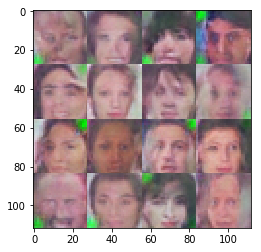

Epoch 4/8... Discriminator Loss: 0.7386... Generator Loss: 1.0861
Epoch 4/8... Discriminator Loss: 0.1165... Generator Loss: 3.7805
Epoch 4/8... Discriminator Loss: 0.0224... Generator Loss: 6.8805
Epoch 4/8... Discriminator Loss: 0.0405... Generator Loss: 6.3203
Epoch 4/8... Discriminator Loss: 0.1433... Generator Loss: 6.6620
Epoch 4/8... Discriminator Loss: 0.0314... Generator Loss: 6.3932
Epoch 4/8... Discriminator Loss: 0.8267... Generator Loss: 4.8354
Epoch 4/8... Discriminator Loss: 0.2252... Generator Loss: 4.7771
Epoch 4/8... Discriminator Loss: 0.0312... Generator Loss: 8.7493
Epoch 4/8... Discriminator Loss: 0.0283... Generator Loss: 7.3368


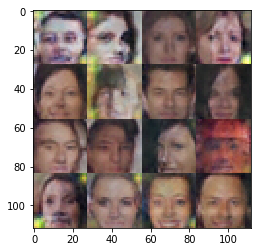

Epoch 4/8... Discriminator Loss: 0.9101... Generator Loss: 0.9042
Epoch 4/8... Discriminator Loss: 0.8153... Generator Loss: 0.8471
Epoch 4/8... Discriminator Loss: 0.0698... Generator Loss: 12.2065
Epoch 4/8... Discriminator Loss: 0.0755... Generator Loss: 4.8240
Epoch 4/8... Discriminator Loss: 0.0552... Generator Loss: 4.4724
Epoch 4/8... Discriminator Loss: 0.6289... Generator Loss: 1.2905
Epoch 4/8... Discriminator Loss: 0.1203... Generator Loss: 2.9620
Epoch 4/8... Discriminator Loss: 0.5757... Generator Loss: 1.1421
Epoch 4/8... Discriminator Loss: 0.0150... Generator Loss: 13.7891
Epoch 4/8... Discriminator Loss: 0.0875... Generator Loss: 9.9930


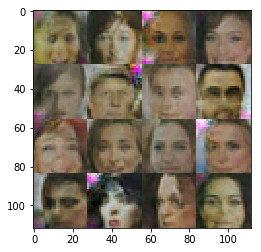

Epoch 4/8... Discriminator Loss: 0.0284... Generator Loss: 8.6844
Epoch 4/8... Discriminator Loss: 0.0238... Generator Loss: 9.3209
Epoch 4/8... Discriminator Loss: 0.0067... Generator Loss: 10.1031
Epoch 4/8... Discriminator Loss: 0.0200... Generator Loss: 7.5762
Epoch 4/8... Discriminator Loss: 0.1156... Generator Loss: 3.0995
Epoch 4/8... Discriminator Loss: 0.1379... Generator Loss: 3.0625
Epoch 4/8... Discriminator Loss: 0.0210... Generator Loss: 9.4393
Epoch 4/8... Discriminator Loss: 0.0229... Generator Loss: 4.9462
Epoch 4/8... Discriminator Loss: 0.0104... Generator Loss: 8.1074
Epoch 4/8... Discriminator Loss: 0.0027... Generator Loss: 9.3115


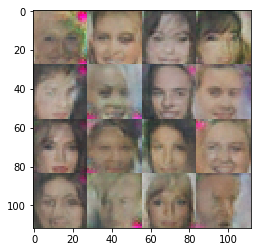

Epoch 4/8... Discriminator Loss: 0.0218... Generator Loss: 10.9757
Epoch 4/8... Discriminator Loss: 0.0071... Generator Loss: 7.9223
Epoch 4/8... Discriminator Loss: 1.1034... Generator Loss: 2.3221
Epoch 4/8... Discriminator Loss: 1.2264... Generator Loss: 0.7427
Epoch 4/8... Discriminator Loss: 0.9265... Generator Loss: 1.3518
Epoch 4/8... Discriminator Loss: 1.8291... Generator Loss: 0.2673
Epoch 4/8... Discriminator Loss: 1.2334... Generator Loss: 0.6353
Epoch 4/8... Discriminator Loss: 0.9629... Generator Loss: 0.9410
Epoch 4/8... Discriminator Loss: 0.8696... Generator Loss: 1.2465
Epoch 4/8... Discriminator Loss: 0.9864... Generator Loss: 0.7867


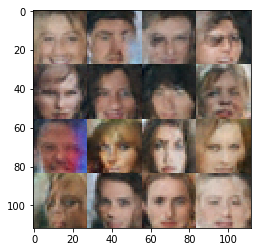

Epoch 4/8... Discriminator Loss: 2.0271... Generator Loss: 0.2228
Epoch 4/8... Discriminator Loss: 0.8530... Generator Loss: 1.3364
Epoch 4/8... Discriminator Loss: 1.5779... Generator Loss: 0.4003
Epoch 4/8... Discriminator Loss: 1.2641... Generator Loss: 0.6562
Epoch 4/8... Discriminator Loss: 1.4583... Generator Loss: 0.3563
Epoch 4/8... Discriminator Loss: 1.3607... Generator Loss: 0.4238
Epoch 4/8... Discriminator Loss: 1.2206... Generator Loss: 0.6391
Epoch 4/8... Discriminator Loss: 1.2412... Generator Loss: 0.6336
Epoch 4/8... Discriminator Loss: 1.2126... Generator Loss: 0.5318
Epoch 4/8... Discriminator Loss: 0.9653... Generator Loss: 0.9761


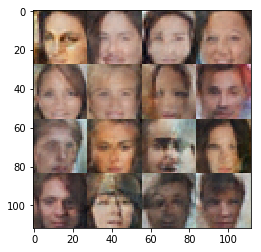

Epoch 4/8... Discriminator Loss: 1.2207... Generator Loss: 0.5646
Epoch 4/8... Discriminator Loss: 0.8974... Generator Loss: 1.1513
Epoch 4/8... Discriminator Loss: 1.6203... Generator Loss: 0.3244
Epoch 4/8... Discriminator Loss: 1.0235... Generator Loss: 0.9279
Epoch 4/8... Discriminator Loss: 1.6568... Generator Loss: 0.3121
Epoch 4/8... Discriminator Loss: 0.9701... Generator Loss: 0.8295
Epoch 4/8... Discriminator Loss: 1.4777... Generator Loss: 0.4088
Epoch 4/8... Discriminator Loss: 1.3765... Generator Loss: 0.6185
Epoch 4/8... Discriminator Loss: 0.9512... Generator Loss: 0.8462
Epoch 4/8... Discriminator Loss: 1.1377... Generator Loss: 0.8143


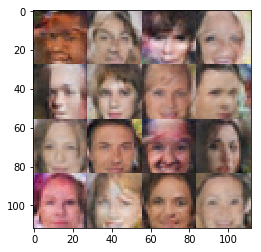

Epoch 4/8... Discriminator Loss: 1.2249... Generator Loss: 0.6195
Epoch 4/8... Discriminator Loss: 1.2055... Generator Loss: 0.5945
Epoch 4/8... Discriminator Loss: 1.0611... Generator Loss: 0.7761
Epoch 4/8... Discriminator Loss: 1.4341... Generator Loss: 0.4976
Epoch 4/8... Discriminator Loss: 1.3759... Generator Loss: 1.7680
Epoch 4/8... Discriminator Loss: 1.2379... Generator Loss: 0.6141
Epoch 4/8... Discriminator Loss: 1.6766... Generator Loss: 0.8390
Epoch 4/8... Discriminator Loss: 1.3563... Generator Loss: 0.5239
Epoch 4/8... Discriminator Loss: 1.2213... Generator Loss: 0.7381
Epoch 4/8... Discriminator Loss: 1.2723... Generator Loss: 0.6554


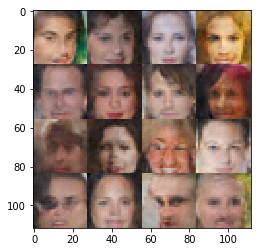

Epoch 4/8... Discriminator Loss: 0.4974... Generator Loss: 1.4085
Epoch 4/8... Discriminator Loss: 1.6482... Generator Loss: 0.2971
Epoch 4/8... Discriminator Loss: 1.1146... Generator Loss: 0.5973
Epoch 4/8... Discriminator Loss: 1.4921... Generator Loss: 0.3749
Epoch 4/8... Discriminator Loss: 1.4361... Generator Loss: 0.4958
Epoch 4/8... Discriminator Loss: 1.1340... Generator Loss: 1.0823
Epoch 4/8... Discriminator Loss: 1.6113... Generator Loss: 0.3501
Epoch 4/8... Discriminator Loss: 1.4347... Generator Loss: 0.5244
Epoch 4/8... Discriminator Loss: 1.3556... Generator Loss: 0.4870
Epoch 4/8... Discriminator Loss: 1.6144... Generator Loss: 0.7847


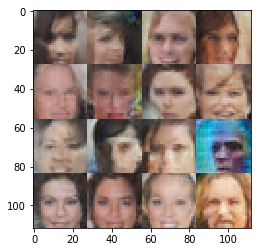

Epoch 4/8... Discriminator Loss: 1.6168... Generator Loss: 0.3109
Epoch 4/8... Discriminator Loss: 1.5411... Generator Loss: 0.4301
Epoch 4/8... Discriminator Loss: 1.0184... Generator Loss: 0.9276
Epoch 4/8... Discriminator Loss: 1.1316... Generator Loss: 0.7192
Epoch 4/8... Discriminator Loss: 1.2335... Generator Loss: 0.4938
Epoch 4/8... Discriminator Loss: 1.2690... Generator Loss: 0.8204
Epoch 4/8... Discriminator Loss: 1.1727... Generator Loss: 0.5992
Epoch 4/8... Discriminator Loss: 1.1406... Generator Loss: 0.7485
Epoch 4/8... Discriminator Loss: 1.7604... Generator Loss: 0.2803
Epoch 4/8... Discriminator Loss: 1.3971... Generator Loss: 0.4323


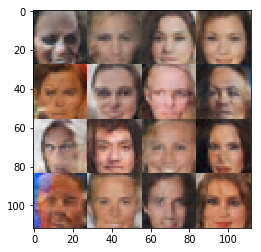

Epoch 4/8... Discriminator Loss: 1.3203... Generator Loss: 0.6523
Epoch 4/8... Discriminator Loss: 1.4131... Generator Loss: 0.3966
Epoch 4/8... Discriminator Loss: 1.0699... Generator Loss: 0.6963
Epoch 4/8... Discriminator Loss: 1.3239... Generator Loss: 0.4328
Epoch 4/8... Discriminator Loss: 1.0166... Generator Loss: 0.9141
Epoch 4/8... Discriminator Loss: 1.4797... Generator Loss: 0.3652
Epoch 4/8... Discriminator Loss: 1.5204... Generator Loss: 0.4169
Epoch 4/8... Discriminator Loss: 1.8224... Generator Loss: 0.2423
Epoch 4/8... Discriminator Loss: 1.4719... Generator Loss: 0.4782
Epoch 4/8... Discriminator Loss: 1.2773... Generator Loss: 0.5108


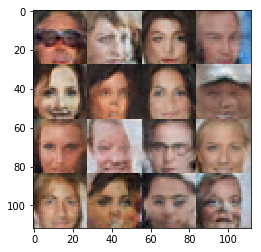

Epoch 4/8... Discriminator Loss: 1.2319... Generator Loss: 0.5097
Epoch 4/8... Discriminator Loss: 2.1752... Generator Loss: 0.3834
Epoch 4/8... Discriminator Loss: 1.4085... Generator Loss: 0.5890
Epoch 4/8... Discriminator Loss: 1.1035... Generator Loss: 0.6654
Epoch 4/8... Discriminator Loss: 1.3578... Generator Loss: 0.5104
Epoch 4/8... Discriminator Loss: 0.9114... Generator Loss: 0.7973
Epoch 4/8... Discriminator Loss: 1.1106... Generator Loss: 0.7218
Epoch 4/8... Discriminator Loss: 1.0865... Generator Loss: 0.7827
Epoch 4/8... Discriminator Loss: 0.9744... Generator Loss: 0.7245
Epoch 4/8... Discriminator Loss: 1.6683... Generator Loss: 0.3585


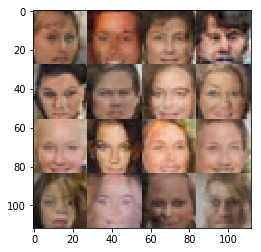

Epoch 4/8... Discriminator Loss: 1.2994... Generator Loss: 0.5671
Epoch 4/8... Discriminator Loss: 1.3278... Generator Loss: 0.6621
Epoch 4/8... Discriminator Loss: 1.5378... Generator Loss: 0.5092
Epoch 4/8... Discriminator Loss: 1.3885... Generator Loss: 0.5676
Epoch 4/8... Discriminator Loss: 1.2306... Generator Loss: 0.5948
Epoch 4/8... Discriminator Loss: 1.1511... Generator Loss: 0.8653
Epoch 4/8... Discriminator Loss: 1.3025... Generator Loss: 0.6023
Epoch 4/8... Discriminator Loss: 1.1496... Generator Loss: 0.7161
Epoch 4/8... Discriminator Loss: 1.5927... Generator Loss: 0.3245
Epoch 4/8... Discriminator Loss: 0.9632... Generator Loss: 1.2045


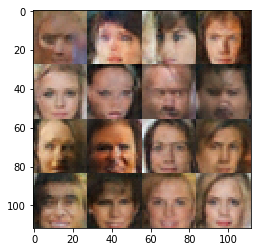

Epoch 4/8... Discriminator Loss: 1.3289... Generator Loss: 0.4707
Epoch 4/8... Discriminator Loss: 1.2967... Generator Loss: 0.5890
Epoch 4/8... Discriminator Loss: 1.2058... Generator Loss: 0.5886
Epoch 4/8... Discriminator Loss: 1.2686... Generator Loss: 0.5746
Epoch 4/8... Discriminator Loss: 1.3969... Generator Loss: 0.4663
Epoch 4/8... Discriminator Loss: 0.9743... Generator Loss: 0.8633
Epoch 4/8... Discriminator Loss: 1.9576... Generator Loss: 0.2375
Epoch 4/8... Discriminator Loss: 1.2815... Generator Loss: 0.5234
Epoch 4/8... Discriminator Loss: 1.6166... Generator Loss: 0.4098
Epoch 4/8... Discriminator Loss: 0.9005... Generator Loss: 0.8805


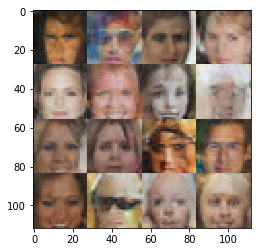

Epoch 4/8... Discriminator Loss: 1.3953... Generator Loss: 0.5112
Epoch 4/8... Discriminator Loss: 1.1275... Generator Loss: 0.5535
Epoch 4/8... Discriminator Loss: 1.1007... Generator Loss: 0.6326
Epoch 4/8... Discriminator Loss: 1.0850... Generator Loss: 0.6408
Epoch 4/8... Discriminator Loss: 1.4389... Generator Loss: 0.6450
Epoch 4/8... Discriminator Loss: 1.0657... Generator Loss: 0.7665
Epoch 4/8... Discriminator Loss: 1.8132... Generator Loss: 0.2528
Epoch 4/8... Discriminator Loss: 1.5377... Generator Loss: 0.3270
Epoch 4/8... Discriminator Loss: 1.1824... Generator Loss: 0.5103
Epoch 4/8... Discriminator Loss: 1.1237... Generator Loss: 0.6694


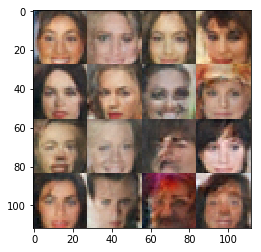

Epoch 4/8... Discriminator Loss: 1.3307... Generator Loss: 0.4818
Epoch 4/8... Discriminator Loss: 1.2139... Generator Loss: 0.5116
Epoch 4/8... Discriminator Loss: 1.2510... Generator Loss: 0.5616
Epoch 4/8... Discriminator Loss: 1.5040... Generator Loss: 0.3997
Epoch 4/8... Discriminator Loss: 1.3178... Generator Loss: 0.5115
Epoch 4/8... Discriminator Loss: 1.1740... Generator Loss: 0.5162
Epoch 4/8... Discriminator Loss: 1.3942... Generator Loss: 0.4964
Epoch 4/8... Discriminator Loss: 0.8355... Generator Loss: 0.9124
Epoch 4/8... Discriminator Loss: 1.3191... Generator Loss: 0.6081
Epoch 4/8... Discriminator Loss: 0.8478... Generator Loss: 0.9545


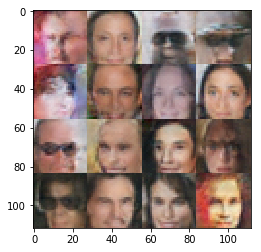

Epoch 4/8... Discriminator Loss: 1.1110... Generator Loss: 0.9159
Epoch 4/8... Discriminator Loss: 1.3176... Generator Loss: 0.4448
Epoch 4/8... Discriminator Loss: 1.2983... Generator Loss: 0.5728
Epoch 4/8... Discriminator Loss: 1.2877... Generator Loss: 0.5525
Epoch 4/8... Discriminator Loss: 1.4598... Generator Loss: 0.4288
Epoch 4/8... Discriminator Loss: 1.1696... Generator Loss: 0.5728
Epoch 4/8... Discriminator Loss: 1.7593... Generator Loss: 0.2569
Epoch 4/8... Discriminator Loss: 1.3837... Generator Loss: 0.5377
Epoch 4/8... Discriminator Loss: 0.7091... Generator Loss: 1.1789
Epoch 4/8... Discriminator Loss: 1.2569... Generator Loss: 0.6114


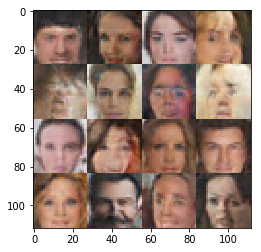

Epoch 4/8... Discriminator Loss: 1.2676... Generator Loss: 1.1909
Epoch 4/8... Discriminator Loss: 1.1440... Generator Loss: 0.6767
Epoch 4/8... Discriminator Loss: 1.6923... Generator Loss: 0.3068
Epoch 4/8... Discriminator Loss: 1.0912... Generator Loss: 0.7867
Epoch 4/8... Discriminator Loss: 1.4800... Generator Loss: 0.4574
Epoch 4/8... Discriminator Loss: 1.2858... Generator Loss: 0.5730
Epoch 4/8... Discriminator Loss: 1.0933... Generator Loss: 0.6285
Epoch 4/8... Discriminator Loss: 1.5197... Generator Loss: 0.6234
Epoch 4/8... Discriminator Loss: 1.1159... Generator Loss: 0.8185
Epoch 4/8... Discriminator Loss: 0.8018... Generator Loss: 0.8906


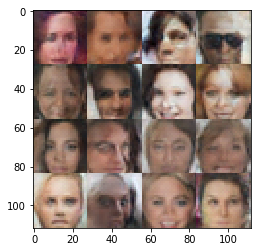

Epoch 4/8... Discriminator Loss: 1.6561... Generator Loss: 0.3003
Epoch 4/8... Discriminator Loss: 1.9921... Generator Loss: 0.2399
Epoch 4/8... Discriminator Loss: 0.8917... Generator Loss: 0.8058
Epoch 4/8... Discriminator Loss: 2.1423... Generator Loss: 0.1699
Epoch 4/8... Discriminator Loss: 0.8959... Generator Loss: 1.0305
Epoch 4/8... Discriminator Loss: 1.1686... Generator Loss: 0.6974
Epoch 4/8... Discriminator Loss: 1.4875... Generator Loss: 0.6142
Epoch 4/8... Discriminator Loss: 1.0561... Generator Loss: 0.6883
Epoch 4/8... Discriminator Loss: 0.9043... Generator Loss: 0.7387
Epoch 4/8... Discriminator Loss: 0.2764... Generator Loss: 2.1391


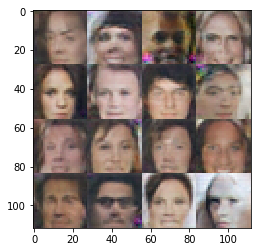

Epoch 4/8... Discriminator Loss: 0.2688... Generator Loss: 2.0699
Epoch 4/8... Discriminator Loss: 0.3912... Generator Loss: 2.1256
Epoch 4/8... Discriminator Loss: 0.0304... Generator Loss: 7.2677
Epoch 4/8... Discriminator Loss: 0.3419... Generator Loss: 2.1473
Epoch 4/8... Discriminator Loss: 0.1032... Generator Loss: 5.0286
Epoch 4/8... Discriminator Loss: 0.7119... Generator Loss: 0.9493
Epoch 4/8... Discriminator Loss: 0.2180... Generator Loss: 2.3877
Epoch 4/8... Discriminator Loss: 0.0407... Generator Loss: 7.0104
Epoch 4/8... Discriminator Loss: 2.1983... Generator Loss: 0.2161
Epoch 4/8... Discriminator Loss: 0.0523... Generator Loss: 5.1985


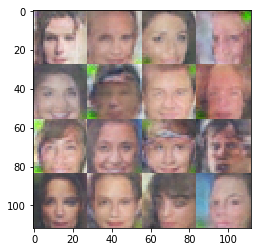

Epoch 4/8... Discriminator Loss: 0.9925... Generator Loss: 0.7209
Epoch 4/8... Discriminator Loss: 0.0337... Generator Loss: 5.5147
Epoch 4/8... Discriminator Loss: 0.1067... Generator Loss: 4.2246
Epoch 4/8... Discriminator Loss: 0.0249... Generator Loss: 5.9859
Epoch 4/8... Discriminator Loss: 0.0724... Generator Loss: 7.1732
Epoch 4/8... Discriminator Loss: 0.4540... Generator Loss: 1.4631
Epoch 4/8... Discriminator Loss: 0.2695... Generator Loss: 10.9946
Epoch 4/8... Discriminator Loss: 0.2318... Generator Loss: 2.3125
Epoch 4/8... Discriminator Loss: 1.5545... Generator Loss: 0.6701
Epoch 4/8... Discriminator Loss: 0.0811... Generator Loss: 7.3381


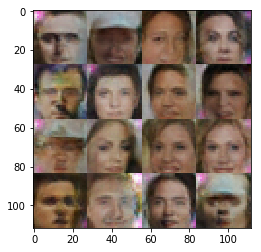

Epoch 4/8... Discriminator Loss: 0.4219... Generator Loss: 1.5870
Epoch 4/8... Discriminator Loss: 0.1377... Generator Loss: 3.7355
Epoch 4/8... Discriminator Loss: 0.5270... Generator Loss: 1.2217
Epoch 4/8... Discriminator Loss: 0.0353... Generator Loss: 6.4858
Epoch 4/8... Discriminator Loss: 0.0671... Generator Loss: 4.1384
Epoch 4/8... Discriminator Loss: 0.1271... Generator Loss: 7.4304
Epoch 4/8... Discriminator Loss: 0.0066... Generator Loss: 8.2472
Epoch 4/8... Discriminator Loss: 0.0142... Generator Loss: 8.1130
Epoch 4/8... Discriminator Loss: 0.0898... Generator Loss: 3.1761
Epoch 4/8... Discriminator Loss: 0.0067... Generator Loss: 8.8181


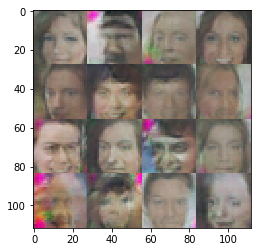

Epoch 4/8... Discriminator Loss: 0.0085... Generator Loss: 12.5420
Epoch 4/8... Discriminator Loss: 0.0040... Generator Loss: 11.5620
Epoch 4/8... Discriminator Loss: 0.0254... Generator Loss: 5.5923
Epoch 4/8... Discriminator Loss: 0.0035... Generator Loss: 13.6775
Epoch 4/8... Discriminator Loss: 0.3484... Generator Loss: 4.0914
Epoch 4/8... Discriminator Loss: 0.0387... Generator Loss: 7.1930
Epoch 4/8... Discriminator Loss: 0.0910... Generator Loss: 3.3745
Epoch 4/8... Discriminator Loss: 0.0068... Generator Loss: 8.9232
Epoch 4/8... Discriminator Loss: 1.5606... Generator Loss: 0.4323
Epoch 4/8... Discriminator Loss: 0.0112... Generator Loss: 12.7321


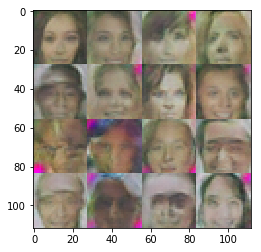

Epoch 4/8... Discriminator Loss: 0.0184... Generator Loss: 13.3241
Epoch 4/8... Discriminator Loss: 0.0557... Generator Loss: 4.6337
Epoch 4/8... Discriminator Loss: 0.0093... Generator Loss: 10.2363
Epoch 4/8... Discriminator Loss: 0.3869... Generator Loss: 1.6209
Epoch 4/8... Discriminator Loss: 0.2524... Generator Loss: 1.9599
Epoch 4/8... Discriminator Loss: 0.1143... Generator Loss: 3.2946
Epoch 4/8... Discriminator Loss: 0.1390... Generator Loss: 2.5716
Epoch 4/8... Discriminator Loss: 0.6957... Generator Loss: 9.0217
Epoch 4/8... Discriminator Loss: 5.3841... Generator Loss: 4.4223
Epoch 4/8... Discriminator Loss: 0.7989... Generator Loss: 0.9288


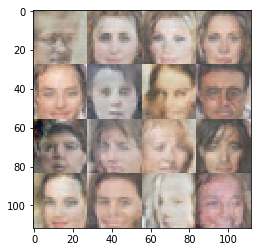

Epoch 4/8... Discriminator Loss: 1.5370... Generator Loss: 0.4662
Epoch 4/8... Discriminator Loss: 1.3953... Generator Loss: 0.4473
Epoch 4/8... Discriminator Loss: 1.0920... Generator Loss: 0.9130
Epoch 4/8... Discriminator Loss: 1.0881... Generator Loss: 0.5502
Epoch 4/8... Discriminator Loss: 1.3798... Generator Loss: 0.5069
Epoch 4/8... Discriminator Loss: 0.9791... Generator Loss: 0.8015
Epoch 5/8... Discriminator Loss: 0.7218... Generator Loss: 1.0797
Epoch 5/8... Discriminator Loss: 1.2954... Generator Loss: 0.4364
Epoch 5/8... Discriminator Loss: 1.3694... Generator Loss: 0.4697
Epoch 5/8... Discriminator Loss: 0.7681... Generator Loss: 1.0436


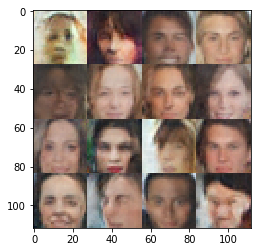

Epoch 5/8... Discriminator Loss: 0.8757... Generator Loss: 0.7021
Epoch 5/8... Discriminator Loss: 1.4947... Generator Loss: 0.3656
Epoch 5/8... Discriminator Loss: 1.0156... Generator Loss: 0.6334
Epoch 5/8... Discriminator Loss: 1.0862... Generator Loss: 1.3005
Epoch 5/8... Discriminator Loss: 1.0042... Generator Loss: 0.8119
Epoch 5/8... Discriminator Loss: 1.3119... Generator Loss: 0.4472
Epoch 5/8... Discriminator Loss: 1.3920... Generator Loss: 0.3809
Epoch 5/8... Discriminator Loss: 1.6675... Generator Loss: 0.2885
Epoch 5/8... Discriminator Loss: 1.6847... Generator Loss: 0.2719
Epoch 5/8... Discriminator Loss: 0.9207... Generator Loss: 0.9582


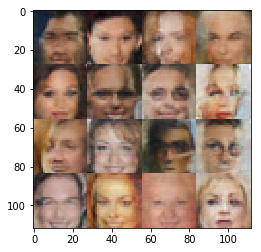

Epoch 5/8... Discriminator Loss: 1.8013... Generator Loss: 0.2300
Epoch 5/8... Discriminator Loss: 1.1410... Generator Loss: 0.9538
Epoch 5/8... Discriminator Loss: 1.0508... Generator Loss: 1.3159
Epoch 5/8... Discriminator Loss: 1.5401... Generator Loss: 0.5264
Epoch 5/8... Discriminator Loss: 1.0540... Generator Loss: 0.8557
Epoch 5/8... Discriminator Loss: 1.4893... Generator Loss: 0.4347
Epoch 5/8... Discriminator Loss: 1.0764... Generator Loss: 0.6416
Epoch 5/8... Discriminator Loss: 1.2288... Generator Loss: 0.6337
Epoch 5/8... Discriminator Loss: 0.9974... Generator Loss: 1.3335
Epoch 5/8... Discriminator Loss: 1.1339... Generator Loss: 0.6480


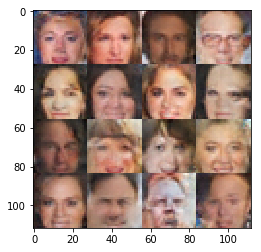

Epoch 5/8... Discriminator Loss: 1.0739... Generator Loss: 0.6360
Epoch 5/8... Discriminator Loss: 1.7945... Generator Loss: 0.2741
Epoch 5/8... Discriminator Loss: 1.0628... Generator Loss: 0.8633
Epoch 5/8... Discriminator Loss: 1.1698... Generator Loss: 0.5664
Epoch 5/8... Discriminator Loss: 1.2585... Generator Loss: 0.4635
Epoch 5/8... Discriminator Loss: 1.3582... Generator Loss: 0.4939
Epoch 5/8... Discriminator Loss: 0.8941... Generator Loss: 1.1144
Epoch 5/8... Discriminator Loss: 1.4534... Generator Loss: 0.4286
Epoch 5/8... Discriminator Loss: 1.2649... Generator Loss: 0.6753
Epoch 5/8... Discriminator Loss: 1.4947... Generator Loss: 0.3658


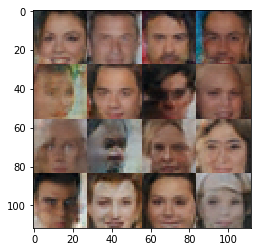

Epoch 5/8... Discriminator Loss: 0.9586... Generator Loss: 0.7541
Epoch 5/8... Discriminator Loss: 1.9937... Generator Loss: 0.2212
Epoch 5/8... Discriminator Loss: 1.4957... Generator Loss: 0.4105
Epoch 5/8... Discriminator Loss: 1.1617... Generator Loss: 0.6751
Epoch 5/8... Discriminator Loss: 1.3752... Generator Loss: 0.7902
Epoch 5/8... Discriminator Loss: 1.5828... Generator Loss: 0.4267
Epoch 5/8... Discriminator Loss: 1.3774... Generator Loss: 0.4059
Epoch 5/8... Discriminator Loss: 1.5123... Generator Loss: 0.3378
Epoch 5/8... Discriminator Loss: 1.6782... Generator Loss: 0.3183
Epoch 5/8... Discriminator Loss: 1.1977... Generator Loss: 0.6855


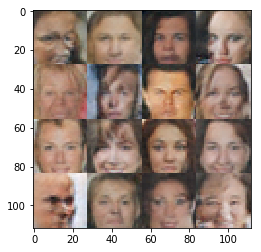

Epoch 5/8... Discriminator Loss: 1.7597... Generator Loss: 0.3061
Epoch 5/8... Discriminator Loss: 1.1969... Generator Loss: 0.6199
Epoch 5/8... Discriminator Loss: 0.9198... Generator Loss: 0.9771
Epoch 5/8... Discriminator Loss: 1.1073... Generator Loss: 1.2296
Epoch 5/8... Discriminator Loss: 1.3275... Generator Loss: 0.7920
Epoch 5/8... Discriminator Loss: 1.5132... Generator Loss: 0.5047
Epoch 5/8... Discriminator Loss: 1.7980... Generator Loss: 0.2912
Epoch 5/8... Discriminator Loss: 1.1746... Generator Loss: 0.6895
Epoch 5/8... Discriminator Loss: 1.3344... Generator Loss: 0.4829
Epoch 5/8... Discriminator Loss: 1.3671... Generator Loss: 0.4191


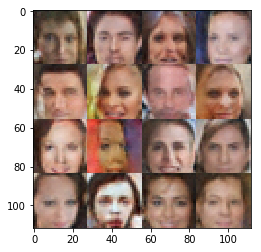

Epoch 5/8... Discriminator Loss: 1.6091... Generator Loss: 0.2978
Epoch 5/8... Discriminator Loss: 0.8583... Generator Loss: 1.3467
Epoch 5/8... Discriminator Loss: 0.9645... Generator Loss: 0.8400
Epoch 5/8... Discriminator Loss: 0.8914... Generator Loss: 1.1897
Epoch 5/8... Discriminator Loss: 1.2731... Generator Loss: 0.6726
Epoch 5/8... Discriminator Loss: 1.3226... Generator Loss: 0.5393
Epoch 5/8... Discriminator Loss: 1.3665... Generator Loss: 0.6043
Epoch 5/8... Discriminator Loss: 1.2065... Generator Loss: 0.6911
Epoch 5/8... Discriminator Loss: 1.5071... Generator Loss: 0.3494
Epoch 5/8... Discriminator Loss: 1.3366... Generator Loss: 0.9329


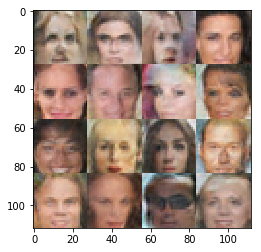

Epoch 5/8... Discriminator Loss: 1.1544... Generator Loss: 0.5470
Epoch 5/8... Discriminator Loss: 0.8456... Generator Loss: 1.0018
Epoch 5/8... Discriminator Loss: 1.7361... Generator Loss: 0.2704
Epoch 5/8... Discriminator Loss: 1.4146... Generator Loss: 0.4898
Epoch 5/8... Discriminator Loss: 1.5910... Generator Loss: 0.3332
Epoch 5/8... Discriminator Loss: 1.3505... Generator Loss: 0.9112
Epoch 5/8... Discriminator Loss: 0.7520... Generator Loss: 1.0204
Epoch 5/8... Discriminator Loss: 1.3311... Generator Loss: 0.4725
Epoch 5/8... Discriminator Loss: 1.3957... Generator Loss: 0.4142
Epoch 5/8... Discriminator Loss: 1.3942... Generator Loss: 0.6636


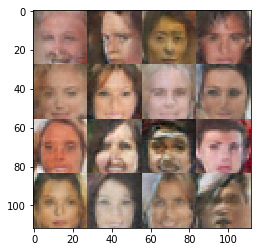

Epoch 5/8... Discriminator Loss: 1.4647... Generator Loss: 0.4160
Epoch 5/8... Discriminator Loss: 1.6811... Generator Loss: 0.3138
Epoch 5/8... Discriminator Loss: 1.4528... Generator Loss: 0.5651
Epoch 5/8... Discriminator Loss: 1.2341... Generator Loss: 0.6764
Epoch 5/8... Discriminator Loss: 1.4648... Generator Loss: 0.3741
Epoch 5/8... Discriminator Loss: 1.6122... Generator Loss: 0.4210
Epoch 5/8... Discriminator Loss: 0.9950... Generator Loss: 1.0158
Epoch 5/8... Discriminator Loss: 1.2162... Generator Loss: 0.5195
Epoch 5/8... Discriminator Loss: 1.0612... Generator Loss: 0.8357
Epoch 5/8... Discriminator Loss: 1.3107... Generator Loss: 0.7350


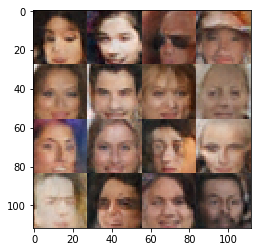

Epoch 5/8... Discriminator Loss: 1.3871... Generator Loss: 0.4885
Epoch 5/8... Discriminator Loss: 1.1149... Generator Loss: 0.5695
Epoch 5/8... Discriminator Loss: 1.0536... Generator Loss: 0.7267
Epoch 5/8... Discriminator Loss: 0.8035... Generator Loss: 1.3166
Epoch 5/8... Discriminator Loss: 1.3553... Generator Loss: 0.4488
Epoch 5/8... Discriminator Loss: 1.3757... Generator Loss: 0.4361
Epoch 5/8... Discriminator Loss: 1.5469... Generator Loss: 0.5133
Epoch 5/8... Discriminator Loss: 1.1061... Generator Loss: 0.8322
Epoch 5/8... Discriminator Loss: 1.6312... Generator Loss: 0.3299
Epoch 5/8... Discriminator Loss: 1.3525... Generator Loss: 0.5508


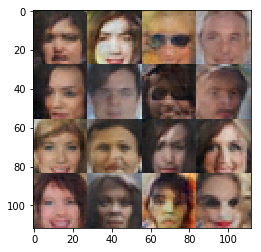

Epoch 5/8... Discriminator Loss: 1.7209... Generator Loss: 0.5025
Epoch 5/8... Discriminator Loss: 1.2202... Generator Loss: 0.5538
Epoch 5/8... Discriminator Loss: 1.5968... Generator Loss: 0.3619
Epoch 5/8... Discriminator Loss: 1.4388... Generator Loss: 0.4437
Epoch 5/8... Discriminator Loss: 1.1585... Generator Loss: 0.5569
Epoch 5/8... Discriminator Loss: 1.7507... Generator Loss: 0.3074
Epoch 5/8... Discriminator Loss: 1.3003... Generator Loss: 0.6008
Epoch 5/8... Discriminator Loss: 1.5204... Generator Loss: 0.3584
Epoch 5/8... Discriminator Loss: 1.7298... Generator Loss: 0.3518
Epoch 5/8... Discriminator Loss: 1.5842... Generator Loss: 0.3268


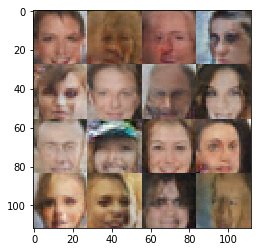

Epoch 5/8... Discriminator Loss: 1.1217... Generator Loss: 0.6527
Epoch 5/8... Discriminator Loss: 1.4482... Generator Loss: 0.5439
Epoch 5/8... Discriminator Loss: 1.1504... Generator Loss: 0.7144
Epoch 5/8... Discriminator Loss: 1.2424... Generator Loss: 0.5404
Epoch 5/8... Discriminator Loss: 1.6233... Generator Loss: 0.3326
Epoch 5/8... Discriminator Loss: 1.3565... Generator Loss: 0.9152
Epoch 5/8... Discriminator Loss: 1.5847... Generator Loss: 1.0231
Epoch 5/8... Discriminator Loss: 0.9381... Generator Loss: 0.9113
Epoch 5/8... Discriminator Loss: 1.0101... Generator Loss: 0.7534
Epoch 5/8... Discriminator Loss: 1.1538... Generator Loss: 0.6563


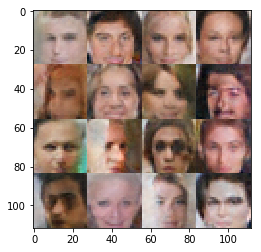

Epoch 5/8... Discriminator Loss: 1.7228... Generator Loss: 0.3332
Epoch 5/8... Discriminator Loss: 1.0451... Generator Loss: 0.7562
Epoch 5/8... Discriminator Loss: 1.4115... Generator Loss: 0.4195
Epoch 5/8... Discriminator Loss: 1.4000... Generator Loss: 0.5293
Epoch 5/8... Discriminator Loss: 1.3765... Generator Loss: 0.6548
Epoch 5/8... Discriminator Loss: 1.6186... Generator Loss: 0.4268
Epoch 5/8... Discriminator Loss: 1.3255... Generator Loss: 0.4520
Epoch 5/8... Discriminator Loss: 0.9454... Generator Loss: 0.8980
Epoch 5/8... Discriminator Loss: 1.4307... Generator Loss: 0.4399
Epoch 5/8... Discriminator Loss: 1.3097... Generator Loss: 0.4735


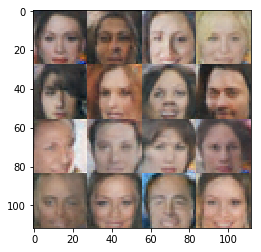

Epoch 5/8... Discriminator Loss: 0.9794... Generator Loss: 0.9898
Epoch 5/8... Discriminator Loss: 1.5539... Generator Loss: 0.3476
Epoch 5/8... Discriminator Loss: 1.3830... Generator Loss: 0.4391
Epoch 5/8... Discriminator Loss: 1.3817... Generator Loss: 0.5517
Epoch 5/8... Discriminator Loss: 1.1342... Generator Loss: 0.6986
Epoch 5/8... Discriminator Loss: 1.0040... Generator Loss: 1.1084
Epoch 5/8... Discriminator Loss: 1.3728... Generator Loss: 0.4005
Epoch 5/8... Discriminator Loss: 1.3742... Generator Loss: 0.5070
Epoch 5/8... Discriminator Loss: 1.4845... Generator Loss: 0.4043
Epoch 5/8... Discriminator Loss: 1.1815... Generator Loss: 0.6221


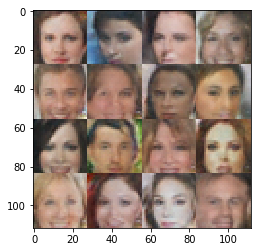

Epoch 5/8... Discriminator Loss: 1.2793... Generator Loss: 0.5385
Epoch 5/8... Discriminator Loss: 1.2397... Generator Loss: 0.5240
Epoch 5/8... Discriminator Loss: 1.0557... Generator Loss: 0.6434
Epoch 5/8... Discriminator Loss: 1.3107... Generator Loss: 0.5747
Epoch 5/8... Discriminator Loss: 1.1535... Generator Loss: 0.5969
Epoch 5/8... Discriminator Loss: 1.5969... Generator Loss: 0.3822
Epoch 5/8... Discriminator Loss: 1.7130... Generator Loss: 0.2663
Epoch 5/8... Discriminator Loss: 1.1166... Generator Loss: 1.1247
Epoch 5/8... Discriminator Loss: 1.3766... Generator Loss: 0.6598
Epoch 5/8... Discriminator Loss: 1.1647... Generator Loss: 0.6759


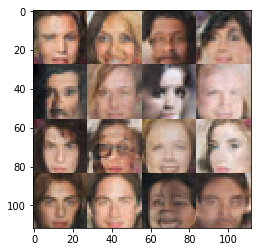

Epoch 5/8... Discriminator Loss: 1.5234... Generator Loss: 0.3738
Epoch 5/8... Discriminator Loss: 1.7438... Generator Loss: 0.3374
Epoch 5/8... Discriminator Loss: 1.3646... Generator Loss: 0.4040
Epoch 5/8... Discriminator Loss: 0.9424... Generator Loss: 0.7608
Epoch 5/8... Discriminator Loss: 1.2756... Generator Loss: 0.7868
Epoch 5/8... Discriminator Loss: 1.0800... Generator Loss: 0.6269
Epoch 5/8... Discriminator Loss: 1.2685... Generator Loss: 0.4439
Epoch 5/8... Discriminator Loss: 1.3951... Generator Loss: 0.4239
Epoch 5/8... Discriminator Loss: 1.2680... Generator Loss: 0.5594
Epoch 5/8... Discriminator Loss: 1.0752... Generator Loss: 0.6236


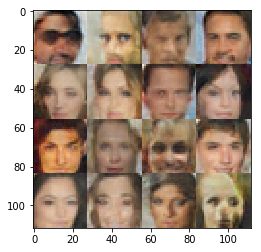

Epoch 5/8... Discriminator Loss: 1.9425... Generator Loss: 0.2073
Epoch 5/8... Discriminator Loss: 1.4656... Generator Loss: 0.4808
Epoch 5/8... Discriminator Loss: 1.3858... Generator Loss: 0.6114
Epoch 5/8... Discriminator Loss: 0.8695... Generator Loss: 1.1288
Epoch 5/8... Discriminator Loss: 1.3516... Generator Loss: 0.5628
Epoch 5/8... Discriminator Loss: 1.3737... Generator Loss: 0.5806
Epoch 5/8... Discriminator Loss: 1.4231... Generator Loss: 0.6394
Epoch 5/8... Discriminator Loss: 1.1158... Generator Loss: 0.7753
Epoch 5/8... Discriminator Loss: 1.3907... Generator Loss: 0.5682
Epoch 5/8... Discriminator Loss: 1.3686... Generator Loss: 0.5609


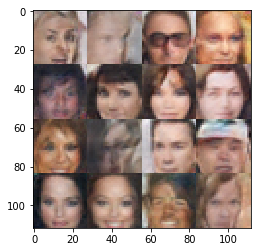

Epoch 5/8... Discriminator Loss: 1.4547... Generator Loss: 0.3795
Epoch 5/8... Discriminator Loss: 1.3696... Generator Loss: 0.6357
Epoch 5/8... Discriminator Loss: 0.8354... Generator Loss: 0.9058
Epoch 5/8... Discriminator Loss: 1.0689... Generator Loss: 0.6909
Epoch 5/8... Discriminator Loss: 1.4447... Generator Loss: 0.5388
Epoch 5/8... Discriminator Loss: 1.5673... Generator Loss: 0.3695
Epoch 5/8... Discriminator Loss: 1.2865... Generator Loss: 0.5677
Epoch 5/8... Discriminator Loss: 1.3008... Generator Loss: 0.5595
Epoch 5/8... Discriminator Loss: 1.2296... Generator Loss: 0.5032
Epoch 5/8... Discriminator Loss: 1.0515... Generator Loss: 0.9000


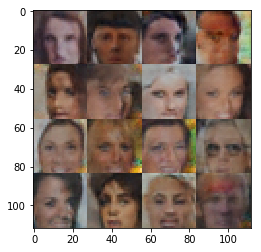

Epoch 5/8... Discriminator Loss: 1.5800... Generator Loss: 0.3781
Epoch 5/8... Discriminator Loss: 1.6186... Generator Loss: 0.6398
Epoch 5/8... Discriminator Loss: 0.9936... Generator Loss: 0.7320
Epoch 5/8... Discriminator Loss: 1.5576... Generator Loss: 0.3323
Epoch 5/8... Discriminator Loss: 1.2460... Generator Loss: 0.6382
Epoch 5/8... Discriminator Loss: 1.2372... Generator Loss: 0.5742
Epoch 5/8... Discriminator Loss: 1.3048... Generator Loss: 0.5291
Epoch 5/8... Discriminator Loss: 1.3273... Generator Loss: 0.5947
Epoch 5/8... Discriminator Loss: 0.6563... Generator Loss: 1.5360
Epoch 5/8... Discriminator Loss: 0.8433... Generator Loss: 0.9613


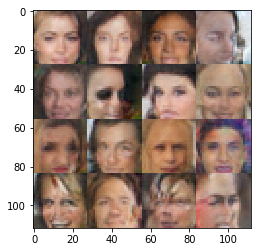

Epoch 5/8... Discriminator Loss: 1.1524... Generator Loss: 0.6667
Epoch 5/8... Discriminator Loss: 1.5758... Generator Loss: 0.3262
Epoch 5/8... Discriminator Loss: 0.0870... Generator Loss: 4.6019
Epoch 5/8... Discriminator Loss: 0.8327... Generator Loss: 1.0468
Epoch 5/8... Discriminator Loss: 0.2613... Generator Loss: 2.1624
Epoch 5/8... Discriminator Loss: 0.1263... Generator Loss: 3.4361
Epoch 5/8... Discriminator Loss: 0.0725... Generator Loss: 3.9758
Epoch 5/8... Discriminator Loss: 0.0073... Generator Loss: 6.9721
Epoch 5/8... Discriminator Loss: 3.1348... Generator Loss: 0.0671
Epoch 5/8... Discriminator Loss: 2.2639... Generator Loss: 0.4457


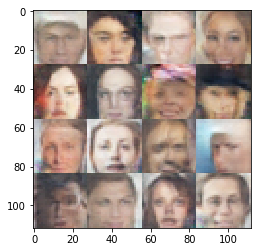

Epoch 5/8... Discriminator Loss: 0.0606... Generator Loss: 4.5472
Epoch 5/8... Discriminator Loss: 0.1642... Generator Loss: 3.3996
Epoch 5/8... Discriminator Loss: 0.5420... Generator Loss: 1.4673
Epoch 5/8... Discriminator Loss: 0.0413... Generator Loss: 6.0298
Epoch 5/8... Discriminator Loss: 0.6013... Generator Loss: 1.1559
Epoch 5/8... Discriminator Loss: 0.1840... Generator Loss: 7.5019
Epoch 5/8... Discriminator Loss: 0.3189... Generator Loss: 2.4974
Epoch 5/8... Discriminator Loss: 0.0046... Generator Loss: 9.0680
Epoch 5/8... Discriminator Loss: 0.0162... Generator Loss: 8.2908
Epoch 5/8... Discriminator Loss: 0.0446... Generator Loss: 6.4872


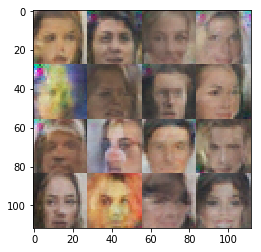

Epoch 5/8... Discriminator Loss: 0.7248... Generator Loss: 1.2662
Epoch 5/8... Discriminator Loss: 0.3038... Generator Loss: 2.0490
Epoch 5/8... Discriminator Loss: 0.7088... Generator Loss: 0.9278
Epoch 5/8... Discriminator Loss: 0.8893... Generator Loss: 0.6837
Epoch 5/8... Discriminator Loss: 0.1821... Generator Loss: 7.5821
Epoch 5/8... Discriminator Loss: 0.0131... Generator Loss: 6.7284
Epoch 5/8... Discriminator Loss: 0.8371... Generator Loss: 0.9939
Epoch 5/8... Discriminator Loss: 0.6419... Generator Loss: 1.1476
Epoch 5/8... Discriminator Loss: 0.0262... Generator Loss: 6.7131
Epoch 5/8... Discriminator Loss: 2.5791... Generator Loss: 10.1241


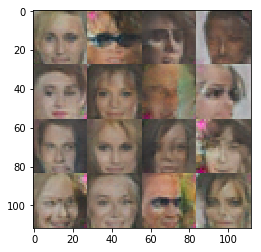

Epoch 5/8... Discriminator Loss: 0.9480... Generator Loss: 0.7534
Epoch 5/8... Discriminator Loss: 1.6727... Generator Loss: 0.2816
Epoch 5/8... Discriminator Loss: 0.9056... Generator Loss: 0.8068
Epoch 5/8... Discriminator Loss: 1.3444... Generator Loss: 1.4763
Epoch 5/8... Discriminator Loss: 1.0985... Generator Loss: 0.6394
Epoch 5/8... Discriminator Loss: 1.3490... Generator Loss: 0.4351
Epoch 5/8... Discriminator Loss: 1.2668... Generator Loss: 0.4675
Epoch 5/8... Discriminator Loss: 1.1817... Generator Loss: 0.5683
Epoch 5/8... Discriminator Loss: 0.8369... Generator Loss: 1.0370
Epoch 5/8... Discriminator Loss: 0.9869... Generator Loss: 0.7352


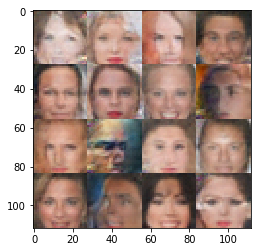

Epoch 5/8... Discriminator Loss: 1.2965... Generator Loss: 0.4742
Epoch 5/8... Discriminator Loss: 0.9063... Generator Loss: 0.8860
Epoch 5/8... Discriminator Loss: 1.2630... Generator Loss: 0.5650
Epoch 5/8... Discriminator Loss: 0.9821... Generator Loss: 0.6509
Epoch 5/8... Discriminator Loss: 0.8432... Generator Loss: 1.0196
Epoch 5/8... Discriminator Loss: 1.5052... Generator Loss: 0.3713
Epoch 5/8... Discriminator Loss: 1.2062... Generator Loss: 0.5365
Epoch 5/8... Discriminator Loss: 1.0837... Generator Loss: 0.6415
Epoch 5/8... Discriminator Loss: 1.1492... Generator Loss: 0.8441
Epoch 5/8... Discriminator Loss: 1.3028... Generator Loss: 0.7729


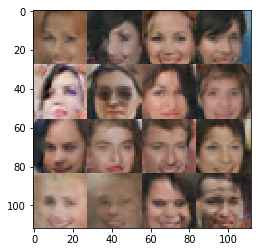

Epoch 5/8... Discriminator Loss: 1.0603... Generator Loss: 0.8320
Epoch 5/8... Discriminator Loss: 1.3182... Generator Loss: 0.4861
Epoch 5/8... Discriminator Loss: 0.8651... Generator Loss: 0.9015
Epoch 5/8... Discriminator Loss: 1.3795... Generator Loss: 0.4316
Epoch 5/8... Discriminator Loss: 1.2577... Generator Loss: 0.6337
Epoch 5/8... Discriminator Loss: 1.1920... Generator Loss: 0.6358
Epoch 5/8... Discriminator Loss: 1.3617... Generator Loss: 0.4459
Epoch 5/8... Discriminator Loss: 0.9934... Generator Loss: 0.7542
Epoch 5/8... Discriminator Loss: 1.2105... Generator Loss: 0.5777
Epoch 5/8... Discriminator Loss: 1.4953... Generator Loss: 0.3955


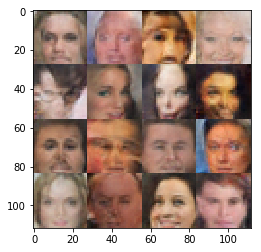

Epoch 5/8... Discriminator Loss: 1.2188... Generator Loss: 0.6073
Epoch 5/8... Discriminator Loss: 1.0924... Generator Loss: 0.5777
Epoch 5/8... Discriminator Loss: 1.4261... Generator Loss: 0.5295
Epoch 5/8... Discriminator Loss: 1.5104... Generator Loss: 1.3969
Epoch 5/8... Discriminator Loss: 1.7224... Generator Loss: 0.3094
Epoch 5/8... Discriminator Loss: 1.5893... Generator Loss: 0.3319
Epoch 5/8... Discriminator Loss: 1.2107... Generator Loss: 0.9841
Epoch 5/8... Discriminator Loss: 1.2208... Generator Loss: 0.6435
Epoch 5/8... Discriminator Loss: 1.6421... Generator Loss: 0.2934
Epoch 5/8... Discriminator Loss: 2.3150... Generator Loss: 0.2019


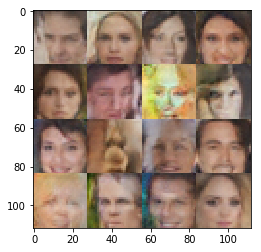

Epoch 5/8... Discriminator Loss: 1.1909... Generator Loss: 0.8791
Epoch 5/8... Discriminator Loss: 1.4414... Generator Loss: 0.4398
Epoch 5/8... Discriminator Loss: 1.0982... Generator Loss: 0.6054
Epoch 5/8... Discriminator Loss: 1.2815... Generator Loss: 0.5224
Epoch 5/8... Discriminator Loss: 1.3943... Generator Loss: 0.6111
Epoch 5/8... Discriminator Loss: 1.1280... Generator Loss: 1.1340
Epoch 5/8... Discriminator Loss: 1.3674... Generator Loss: 0.4941
Epoch 5/8... Discriminator Loss: 1.4222... Generator Loss: 1.1406
Epoch 5/8... Discriminator Loss: 1.6348... Generator Loss: 0.3470
Epoch 5/8... Discriminator Loss: 0.9993... Generator Loss: 0.9330


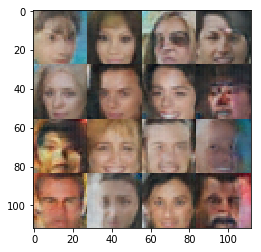

Epoch 5/8... Discriminator Loss: 1.1536... Generator Loss: 1.0075
Epoch 5/8... Discriminator Loss: 1.4480... Generator Loss: 0.5927
Epoch 5/8... Discriminator Loss: 1.2311... Generator Loss: 0.5661
Epoch 5/8... Discriminator Loss: 1.4095... Generator Loss: 0.4138
Epoch 5/8... Discriminator Loss: 1.0965... Generator Loss: 0.7291
Epoch 5/8... Discriminator Loss: 1.5478... Generator Loss: 0.3782
Epoch 5/8... Discriminator Loss: 1.0598... Generator Loss: 1.0330
Epoch 5/8... Discriminator Loss: 1.3212... Generator Loss: 0.5356
Epoch 5/8... Discriminator Loss: 1.5606... Generator Loss: 0.3111
Epoch 5/8... Discriminator Loss: 1.1236... Generator Loss: 0.6207


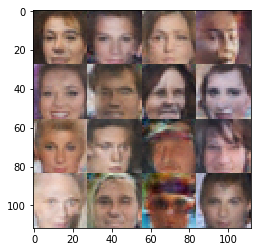

Epoch 5/8... Discriminator Loss: 1.4630... Generator Loss: 0.4299
Epoch 5/8... Discriminator Loss: 1.2219... Generator Loss: 0.7949
Epoch 5/8... Discriminator Loss: 1.5292... Generator Loss: 0.4068
Epoch 5/8... Discriminator Loss: 1.4472... Generator Loss: 0.5494
Epoch 5/8... Discriminator Loss: 1.5144... Generator Loss: 0.3635
Epoch 5/8... Discriminator Loss: 1.2190... Generator Loss: 0.6265
Epoch 5/8... Discriminator Loss: 1.2646... Generator Loss: 0.5959
Epoch 5/8... Discriminator Loss: 1.5397... Generator Loss: 0.3364
Epoch 5/8... Discriminator Loss: 1.4861... Generator Loss: 1.0222
Epoch 5/8... Discriminator Loss: 1.2985... Generator Loss: 0.5719


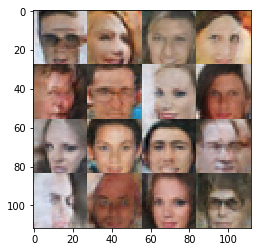

Epoch 5/8... Discriminator Loss: 1.1669... Generator Loss: 0.6542
Epoch 5/8... Discriminator Loss: 1.3693... Generator Loss: 0.4958
Epoch 5/8... Discriminator Loss: 1.7759... Generator Loss: 0.3265
Epoch 5/8... Discriminator Loss: 1.5321... Generator Loss: 0.3609
Epoch 5/8... Discriminator Loss: 1.3635... Generator Loss: 0.4867
Epoch 5/8... Discriminator Loss: 1.1809... Generator Loss: 0.7721
Epoch 5/8... Discriminator Loss: 1.4480... Generator Loss: 0.4777
Epoch 5/8... Discriminator Loss: 1.7455... Generator Loss: 0.4997
Epoch 5/8... Discriminator Loss: 1.2196... Generator Loss: 0.5653
Epoch 5/8... Discriminator Loss: 1.0620... Generator Loss: 0.6308


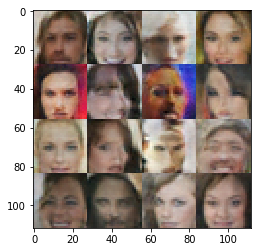

Epoch 5/8... Discriminator Loss: 1.2546... Generator Loss: 0.6974
Epoch 5/8... Discriminator Loss: 1.5086... Generator Loss: 0.3426
Epoch 5/8... Discriminator Loss: 0.9137... Generator Loss: 0.8960
Epoch 5/8... Discriminator Loss: 1.0015... Generator Loss: 1.2054
Epoch 5/8... Discriminator Loss: 1.0631... Generator Loss: 0.7868
Epoch 5/8... Discriminator Loss: 1.0356... Generator Loss: 0.8974
Epoch 5/8... Discriminator Loss: 1.1643... Generator Loss: 0.5962
Epoch 5/8... Discriminator Loss: 1.0827... Generator Loss: 0.6732
Epoch 5/8... Discriminator Loss: 1.1669... Generator Loss: 0.5616
Epoch 5/8... Discriminator Loss: 0.9891... Generator Loss: 0.7790


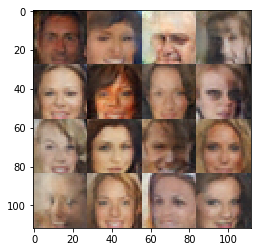

Epoch 5/8... Discriminator Loss: 1.3118... Generator Loss: 0.5995
Epoch 5/8... Discriminator Loss: 1.3324... Generator Loss: 0.5764
Epoch 5/8... Discriminator Loss: 1.4659... Generator Loss: 0.4062
Epoch 5/8... Discriminator Loss: 1.2171... Generator Loss: 0.6142
Epoch 5/8... Discriminator Loss: 1.2026... Generator Loss: 0.5274
Epoch 5/8... Discriminator Loss: 1.8402... Generator Loss: 0.4841
Epoch 5/8... Discriminator Loss: 1.7638... Generator Loss: 0.2946
Epoch 5/8... Discriminator Loss: 0.7526... Generator Loss: 0.8526
Epoch 5/8... Discriminator Loss: 1.2412... Generator Loss: 0.5451
Epoch 5/8... Discriminator Loss: 1.0564... Generator Loss: 0.7132


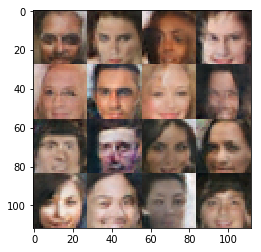

Epoch 5/8... Discriminator Loss: 1.3172... Generator Loss: 0.5872
Epoch 5/8... Discriminator Loss: 1.3806... Generator Loss: 0.4343
Epoch 6/8... Discriminator Loss: 1.4311... Generator Loss: 0.4205
Epoch 6/8... Discriminator Loss: 1.4519... Generator Loss: 0.4186
Epoch 6/8... Discriminator Loss: 1.3225... Generator Loss: 0.5146
Epoch 6/8... Discriminator Loss: 1.1820... Generator Loss: 0.7276
Epoch 6/8... Discriminator Loss: 1.0748... Generator Loss: 0.7807
Epoch 6/8... Discriminator Loss: 2.2434... Generator Loss: 0.1884
Epoch 6/8... Discriminator Loss: 1.2814... Generator Loss: 1.1989
Epoch 6/8... Discriminator Loss: 1.1916... Generator Loss: 0.6962


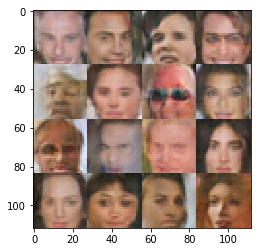

Epoch 6/8... Discriminator Loss: 1.5174... Generator Loss: 0.3471
Epoch 6/8... Discriminator Loss: 1.7048... Generator Loss: 0.3192
Epoch 6/8... Discriminator Loss: 1.5175... Generator Loss: 0.3468
Epoch 6/8... Discriminator Loss: 1.4547... Generator Loss: 0.8127
Epoch 6/8... Discriminator Loss: 1.3477... Generator Loss: 0.5946
Epoch 6/8... Discriminator Loss: 1.0051... Generator Loss: 0.7112
Epoch 6/8... Discriminator Loss: 1.3008... Generator Loss: 0.4721
Epoch 6/8... Discriminator Loss: 1.4601... Generator Loss: 0.5462
Epoch 6/8... Discriminator Loss: 2.0718... Generator Loss: 0.2116
Epoch 6/8... Discriminator Loss: 1.6381... Generator Loss: 0.3342


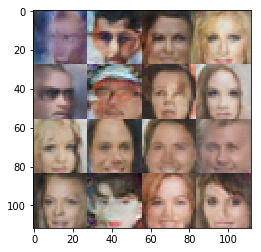

Epoch 6/8... Discriminator Loss: 1.1969... Generator Loss: 1.1541
Epoch 6/8... Discriminator Loss: 1.3542... Generator Loss: 0.6081
Epoch 6/8... Discriminator Loss: 1.4161... Generator Loss: 0.6584
Epoch 6/8... Discriminator Loss: 1.5333... Generator Loss: 0.3916
Epoch 6/8... Discriminator Loss: 1.0156... Generator Loss: 0.9852
Epoch 6/8... Discriminator Loss: 1.5811... Generator Loss: 0.4711
Epoch 6/8... Discriminator Loss: 1.5516... Generator Loss: 0.3589
Epoch 6/8... Discriminator Loss: 1.2627... Generator Loss: 0.6471
Epoch 6/8... Discriminator Loss: 1.4040... Generator Loss: 0.5782
Epoch 6/8... Discriminator Loss: 1.1447... Generator Loss: 0.8215


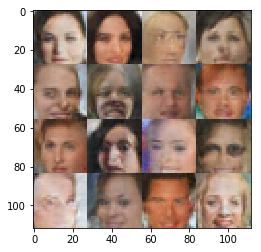

Epoch 6/8... Discriminator Loss: 1.1094... Generator Loss: 0.9150
Epoch 6/8... Discriminator Loss: 1.5639... Generator Loss: 0.3811
Epoch 6/8... Discriminator Loss: 1.5847... Generator Loss: 0.4261
Epoch 6/8... Discriminator Loss: 1.3408... Generator Loss: 0.6202
Epoch 6/8... Discriminator Loss: 0.9590... Generator Loss: 1.0389
Epoch 6/8... Discriminator Loss: 1.2282... Generator Loss: 0.5746
Epoch 6/8... Discriminator Loss: 0.9130... Generator Loss: 0.9417
Epoch 6/8... Discriminator Loss: 1.4071... Generator Loss: 0.4874
Epoch 6/8... Discriminator Loss: 0.2025... Generator Loss: 6.6559
Epoch 6/8... Discriminator Loss: 0.0523... Generator Loss: 5.7395


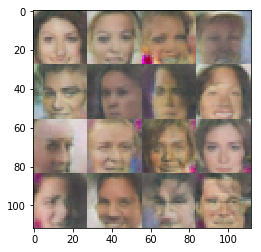

Epoch 6/8... Discriminator Loss: 0.2997... Generator Loss: 1.8867
Epoch 6/8... Discriminator Loss: 0.0168... Generator Loss: 9.0428
Epoch 6/8... Discriminator Loss: 0.3288... Generator Loss: 7.6357
Epoch 6/8... Discriminator Loss: 0.5907... Generator Loss: 1.0997
Epoch 6/8... Discriminator Loss: 0.0387... Generator Loss: 7.2699
Epoch 6/8... Discriminator Loss: 0.0745... Generator Loss: 4.3681
Epoch 6/8... Discriminator Loss: 0.3344... Generator Loss: 4.7906
Epoch 6/8... Discriminator Loss: 1.0590... Generator Loss: 0.6803
Epoch 6/8... Discriminator Loss: 1.2569... Generator Loss: 0.4851
Epoch 6/8... Discriminator Loss: 0.7383... Generator Loss: 0.9444


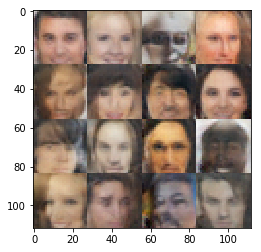

Epoch 6/8... Discriminator Loss: 1.1506... Generator Loss: 0.5016
Epoch 6/8... Discriminator Loss: 1.2333... Generator Loss: 0.6724
Epoch 6/8... Discriminator Loss: 1.6369... Generator Loss: 0.3277
Epoch 6/8... Discriminator Loss: 1.3722... Generator Loss: 0.4421
Epoch 6/8... Discriminator Loss: 1.2853... Generator Loss: 0.5752
Epoch 6/8... Discriminator Loss: 1.0248... Generator Loss: 0.9475
Epoch 6/8... Discriminator Loss: 1.1232... Generator Loss: 0.6442
Epoch 6/8... Discriminator Loss: 1.2208... Generator Loss: 0.5798
Epoch 6/8... Discriminator Loss: 1.6065... Generator Loss: 0.3029
Epoch 6/8... Discriminator Loss: 1.3851... Generator Loss: 0.4029


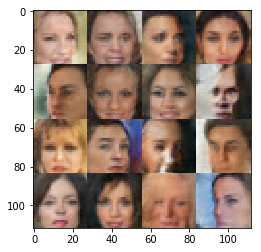

Epoch 6/8... Discriminator Loss: 1.5768... Generator Loss: 0.3058
Epoch 6/8... Discriminator Loss: 1.2483... Generator Loss: 0.5461
Epoch 6/8... Discriminator Loss: 1.6097... Generator Loss: 0.3752
Epoch 6/8... Discriminator Loss: 1.4354... Generator Loss: 0.5480
Epoch 6/8... Discriminator Loss: 1.4837... Generator Loss: 0.4492
Epoch 6/8... Discriminator Loss: 1.4878... Generator Loss: 0.4369
Epoch 6/8... Discriminator Loss: 1.2600... Generator Loss: 0.6579
Epoch 6/8... Discriminator Loss: 1.6276... Generator Loss: 0.5209
Epoch 6/8... Discriminator Loss: 1.1333... Generator Loss: 0.5810
Epoch 6/8... Discriminator Loss: 1.2062... Generator Loss: 0.6161


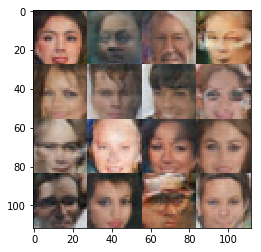

Epoch 6/8... Discriminator Loss: 1.3578... Generator Loss: 0.7055
Epoch 6/8... Discriminator Loss: 1.4553... Generator Loss: 0.4335
Epoch 6/8... Discriminator Loss: 1.5884... Generator Loss: 0.3689
Epoch 6/8... Discriminator Loss: 1.3410... Generator Loss: 0.4392
Epoch 6/8... Discriminator Loss: 1.7090... Generator Loss: 0.3518
Epoch 6/8... Discriminator Loss: 1.1791... Generator Loss: 0.6779
Epoch 6/8... Discriminator Loss: 1.0459... Generator Loss: 0.8892
Epoch 6/8... Discriminator Loss: 1.8555... Generator Loss: 1.0074
Epoch 6/8... Discriminator Loss: 1.0991... Generator Loss: 0.7041
Epoch 6/8... Discriminator Loss: 1.3308... Generator Loss: 0.5440


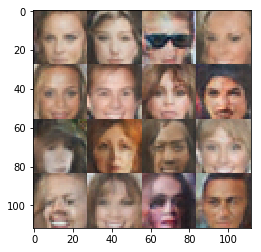

Epoch 6/8... Discriminator Loss: 1.1052... Generator Loss: 0.9487
Epoch 6/8... Discriminator Loss: 1.4793... Generator Loss: 0.5193
Epoch 6/8... Discriminator Loss: 1.1872... Generator Loss: 0.4759
Epoch 6/8... Discriminator Loss: 1.1807... Generator Loss: 0.6663
Epoch 6/8... Discriminator Loss: 1.0928... Generator Loss: 0.8469
Epoch 6/8... Discriminator Loss: 1.2092... Generator Loss: 0.8213
Epoch 6/8... Discriminator Loss: 1.3743... Generator Loss: 0.6046
Epoch 6/8... Discriminator Loss: 1.2556... Generator Loss: 0.5690
Epoch 6/8... Discriminator Loss: 1.3030... Generator Loss: 0.6247
Epoch 6/8... Discriminator Loss: 1.4042... Generator Loss: 0.5481


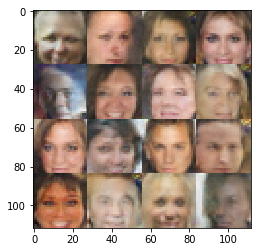

Epoch 6/8... Discriminator Loss: 1.1766... Generator Loss: 0.7177
Epoch 6/8... Discriminator Loss: 1.4547... Generator Loss: 0.6459
Epoch 6/8... Discriminator Loss: 1.4815... Generator Loss: 0.4085
Epoch 6/8... Discriminator Loss: 1.4249... Generator Loss: 0.4527
Epoch 6/8... Discriminator Loss: 1.3020... Generator Loss: 0.5621
Epoch 6/8... Discriminator Loss: 1.2897... Generator Loss: 0.5192
Epoch 6/8... Discriminator Loss: 1.3616... Generator Loss: 0.4609
Epoch 6/8... Discriminator Loss: 1.2870... Generator Loss: 0.5346
Epoch 6/8... Discriminator Loss: 1.0335... Generator Loss: 1.1518
Epoch 6/8... Discriminator Loss: 1.4096... Generator Loss: 0.6235


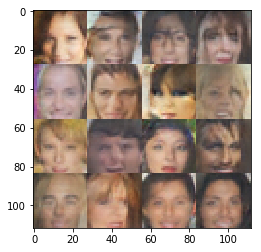

Epoch 6/8... Discriminator Loss: 0.9260... Generator Loss: 0.9464
Epoch 6/8... Discriminator Loss: 1.3809... Generator Loss: 0.4614
Epoch 6/8... Discriminator Loss: 1.2925... Generator Loss: 0.5457
Epoch 6/8... Discriminator Loss: 1.0871... Generator Loss: 0.5901
Epoch 6/8... Discriminator Loss: 1.6390... Generator Loss: 0.3686
Epoch 6/8... Discriminator Loss: 1.3711... Generator Loss: 0.5968
Epoch 6/8... Discriminator Loss: 1.7212... Generator Loss: 0.2866
Epoch 6/8... Discriminator Loss: 1.4883... Generator Loss: 0.5423
Epoch 6/8... Discriminator Loss: 1.8711... Generator Loss: 0.3570
Epoch 6/8... Discriminator Loss: 1.1003... Generator Loss: 0.6386


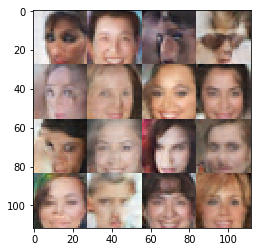

Epoch 6/8... Discriminator Loss: 0.7622... Generator Loss: 1.0170
Epoch 6/8... Discriminator Loss: 1.2923... Generator Loss: 0.4446
Epoch 6/8... Discriminator Loss: 1.6371... Generator Loss: 0.4721
Epoch 6/8... Discriminator Loss: 1.2816... Generator Loss: 0.5885
Epoch 6/8... Discriminator Loss: 0.9722... Generator Loss: 1.2628
Epoch 6/8... Discriminator Loss: 1.3968... Generator Loss: 0.4631
Epoch 6/8... Discriminator Loss: 1.4077... Generator Loss: 0.4356
Epoch 6/8... Discriminator Loss: 0.9036... Generator Loss: 0.9645
Epoch 6/8... Discriminator Loss: 1.4817... Generator Loss: 0.4005
Epoch 6/8... Discriminator Loss: 1.4789... Generator Loss: 0.4844


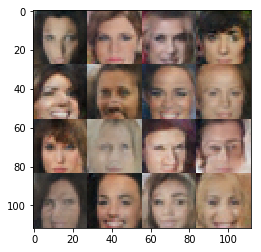

Epoch 6/8... Discriminator Loss: 1.0667... Generator Loss: 0.6571
Epoch 6/8... Discriminator Loss: 1.0932... Generator Loss: 0.8471
Epoch 6/8... Discriminator Loss: 1.0940... Generator Loss: 0.6098
Epoch 6/8... Discriminator Loss: 1.3072... Generator Loss: 0.4573
Epoch 6/8... Discriminator Loss: 1.0129... Generator Loss: 0.7896
Epoch 6/8... Discriminator Loss: 1.6191... Generator Loss: 0.3625
Epoch 6/8... Discriminator Loss: 1.4561... Generator Loss: 0.5262
Epoch 6/8... Discriminator Loss: 1.5955... Generator Loss: 0.3565
Epoch 6/8... Discriminator Loss: 1.2423... Generator Loss: 0.6963
Epoch 6/8... Discriminator Loss: 0.6393... Generator Loss: 1.1788


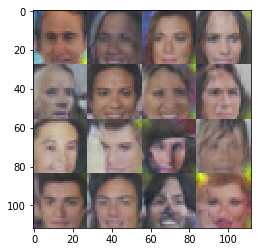

Epoch 6/8... Discriminator Loss: 0.9636... Generator Loss: 0.6695
Epoch 6/8... Discriminator Loss: 0.4865... Generator Loss: 1.5338
Epoch 6/8... Discriminator Loss: 0.0374... Generator Loss: 6.3732
Epoch 6/8... Discriminator Loss: 0.0573... Generator Loss: 5.4668
Epoch 6/8... Discriminator Loss: 0.3523... Generator Loss: 1.6804
Epoch 6/8... Discriminator Loss: 0.0586... Generator Loss: 9.0868
Epoch 6/8... Discriminator Loss: 0.0643... Generator Loss: 7.5208
Epoch 6/8... Discriminator Loss: 0.0823... Generator Loss: 4.2054
Epoch 6/8... Discriminator Loss: 0.0061... Generator Loss: 12.2512
Epoch 6/8... Discriminator Loss: 0.0060... Generator Loss: 8.3913


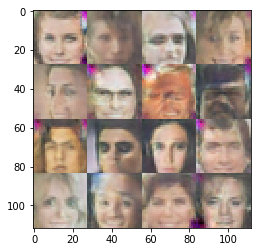

Epoch 6/8... Discriminator Loss: 0.4474... Generator Loss: 1.4759
Epoch 6/8... Discriminator Loss: 0.0300... Generator Loss: 7.6887
Epoch 6/8... Discriminator Loss: 0.0217... Generator Loss: 11.3956
Epoch 6/8... Discriminator Loss: 0.1801... Generator Loss: 2.3709
Epoch 6/8... Discriminator Loss: 0.1520... Generator Loss: 4.4104
Epoch 6/8... Discriminator Loss: 0.1604... Generator Loss: 11.3691
Epoch 6/8... Discriminator Loss: 0.1872... Generator Loss: 2.2883
Epoch 6/8... Discriminator Loss: 0.2566... Generator Loss: 2.2221
Epoch 6/8... Discriminator Loss: 0.1068... Generator Loss: 7.8144
Epoch 6/8... Discriminator Loss: 0.0110... Generator Loss: 12.2628


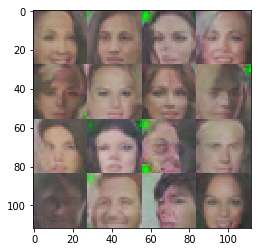

Epoch 6/8... Discriminator Loss: 0.8916... Generator Loss: 4.8124
Epoch 6/8... Discriminator Loss: 0.8069... Generator Loss: 0.8768
Epoch 6/8... Discriminator Loss: 1.1887... Generator Loss: 0.8891
Epoch 6/8... Discriminator Loss: 0.8304... Generator Loss: 0.8606
Epoch 6/8... Discriminator Loss: 0.7276... Generator Loss: 1.2131
Epoch 6/8... Discriminator Loss: 0.5771... Generator Loss: 1.3851
Epoch 6/8... Discriminator Loss: 0.3972... Generator Loss: 8.5510
Epoch 6/8... Discriminator Loss: 0.0745... Generator Loss: 3.9569
Epoch 6/8... Discriminator Loss: 0.0971... Generator Loss: 3.7972
Epoch 6/8... Discriminator Loss: 0.1329... Generator Loss: 11.1709


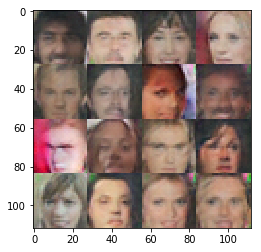

Epoch 6/8... Discriminator Loss: 0.1721... Generator Loss: 5.1273
Epoch 6/8... Discriminator Loss: 0.1974... Generator Loss: 2.3516
Epoch 6/8... Discriminator Loss: 0.0127... Generator Loss: 13.7961
Epoch 6/8... Discriminator Loss: 0.0351... Generator Loss: 5.0859
Epoch 6/8... Discriminator Loss: 0.1378... Generator Loss: 11.1524
Epoch 6/8... Discriminator Loss: 0.4870... Generator Loss: 14.7079
Epoch 6/8... Discriminator Loss: 0.6563... Generator Loss: 4.0373
Epoch 6/8... Discriminator Loss: 0.0042... Generator Loss: 7.1929
Epoch 6/8... Discriminator Loss: 0.0340... Generator Loss: 14.6453
Epoch 6/8... Discriminator Loss: 0.0200... Generator Loss: 11.0862


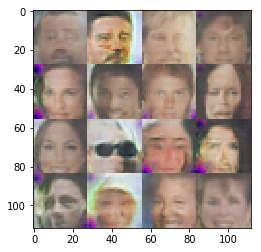

Epoch 6/8... Discriminator Loss: 0.0765... Generator Loss: 11.8403
Epoch 6/8... Discriminator Loss: 0.0246... Generator Loss: 8.6308
Epoch 6/8... Discriminator Loss: 0.0081... Generator Loss: 8.8456
Epoch 6/8... Discriminator Loss: 0.3141... Generator Loss: 2.0407
Epoch 6/8... Discriminator Loss: 1.1605... Generator Loss: 1.6680
Epoch 6/8... Discriminator Loss: 0.0231... Generator Loss: 7.2714
Epoch 6/8... Discriminator Loss: 0.1175... Generator Loss: 7.3781
Epoch 6/8... Discriminator Loss: 0.0160... Generator Loss: 6.0333
Epoch 6/8... Discriminator Loss: 1.5919... Generator Loss: 0.3541
Epoch 6/8... Discriminator Loss: 1.4888... Generator Loss: 0.3809


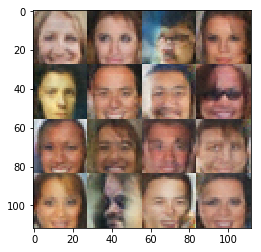

Epoch 6/8... Discriminator Loss: 1.4688... Generator Loss: 0.3494
Epoch 6/8... Discriminator Loss: 1.1065... Generator Loss: 0.6337
Epoch 6/8... Discriminator Loss: 1.5319... Generator Loss: 0.4468
Epoch 6/8... Discriminator Loss: 0.9210... Generator Loss: 0.7290
Epoch 6/8... Discriminator Loss: 1.3348... Generator Loss: 0.4234
Epoch 6/8... Discriminator Loss: 0.9623... Generator Loss: 0.7905
Epoch 6/8... Discriminator Loss: 0.7826... Generator Loss: 1.1893
Epoch 6/8... Discriminator Loss: 1.0073... Generator Loss: 1.1863
Epoch 6/8... Discriminator Loss: 0.9028... Generator Loss: 0.9856
Epoch 6/8... Discriminator Loss: 0.9921... Generator Loss: 0.7234


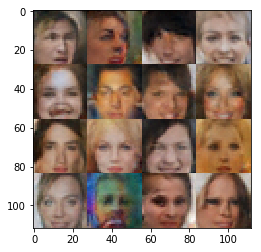

Epoch 6/8... Discriminator Loss: 0.9760... Generator Loss: 0.9359
Epoch 6/8... Discriminator Loss: 1.1282... Generator Loss: 0.6097
Epoch 6/8... Discriminator Loss: 1.7128... Generator Loss: 0.4335
Epoch 6/8... Discriminator Loss: 1.2225... Generator Loss: 0.6164
Epoch 6/8... Discriminator Loss: 1.2473... Generator Loss: 0.5587
Epoch 6/8... Discriminator Loss: 1.2824... Generator Loss: 0.6294
Epoch 6/8... Discriminator Loss: 0.7312... Generator Loss: 1.3129
Epoch 6/8... Discriminator Loss: 1.1515... Generator Loss: 0.7814
Epoch 6/8... Discriminator Loss: 1.2680... Generator Loss: 0.5957
Epoch 6/8... Discriminator Loss: 0.9993... Generator Loss: 0.7918


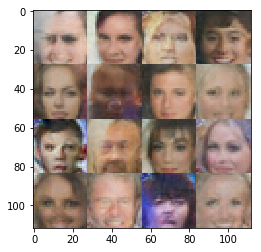

Epoch 6/8... Discriminator Loss: 1.4705... Generator Loss: 0.4182
Epoch 6/8... Discriminator Loss: 1.1879... Generator Loss: 0.6611
Epoch 6/8... Discriminator Loss: 1.1297... Generator Loss: 1.2084
Epoch 6/8... Discriminator Loss: 1.2199... Generator Loss: 0.6195
Epoch 6/8... Discriminator Loss: 1.4973... Generator Loss: 0.4293
Epoch 6/8... Discriminator Loss: 1.1067... Generator Loss: 0.7641
Epoch 6/8... Discriminator Loss: 1.1359... Generator Loss: 0.6827
Epoch 6/8... Discriminator Loss: 1.0055... Generator Loss: 0.7219
Epoch 6/8... Discriminator Loss: 1.2235... Generator Loss: 0.6638
Epoch 6/8... Discriminator Loss: 1.5489... Generator Loss: 0.3455


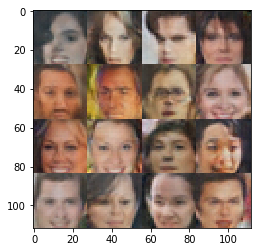

Epoch 6/8... Discriminator Loss: 0.9655... Generator Loss: 0.7955
Epoch 6/8... Discriminator Loss: 1.1680... Generator Loss: 0.8745
Epoch 6/8... Discriminator Loss: 0.7556... Generator Loss: 1.0908
Epoch 6/8... Discriminator Loss: 1.3029... Generator Loss: 0.4486
Epoch 6/8... Discriminator Loss: 1.4415... Generator Loss: 0.4150
Epoch 6/8... Discriminator Loss: 1.1143... Generator Loss: 1.0501
Epoch 6/8... Discriminator Loss: 1.5109... Generator Loss: 0.3947
Epoch 6/8... Discriminator Loss: 1.2946... Generator Loss: 0.5162
Epoch 6/8... Discriminator Loss: 1.2286... Generator Loss: 0.7926
Epoch 6/8... Discriminator Loss: 1.7267... Generator Loss: 0.3280


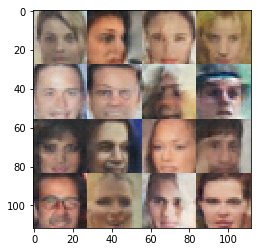

Epoch 6/8... Discriminator Loss: 1.6193... Generator Loss: 0.3335
Epoch 6/8... Discriminator Loss: 1.2042... Generator Loss: 0.5644
Epoch 6/8... Discriminator Loss: 1.2311... Generator Loss: 0.5809
Epoch 6/8... Discriminator Loss: 1.5553... Generator Loss: 0.4357
Epoch 6/8... Discriminator Loss: 0.9433... Generator Loss: 0.7943
Epoch 6/8... Discriminator Loss: 1.1735... Generator Loss: 1.1734
Epoch 6/8... Discriminator Loss: 1.2084... Generator Loss: 0.7932
Epoch 6/8... Discriminator Loss: 1.3529... Generator Loss: 1.2858
Epoch 6/8... Discriminator Loss: 1.1232... Generator Loss: 0.6205
Epoch 6/8... Discriminator Loss: 1.3538... Generator Loss: 0.6419


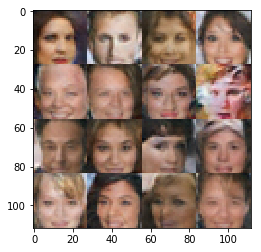

Epoch 6/8... Discriminator Loss: 0.7143... Generator Loss: 1.1226
Epoch 6/8... Discriminator Loss: 1.4848... Generator Loss: 0.4684
Epoch 6/8... Discriminator Loss: 0.8442... Generator Loss: 1.5185
Epoch 6/8... Discriminator Loss: 1.3656... Generator Loss: 0.5989
Epoch 6/8... Discriminator Loss: 1.5125... Generator Loss: 0.3730
Epoch 6/8... Discriminator Loss: 1.3771... Generator Loss: 0.5171
Epoch 6/8... Discriminator Loss: 1.1784... Generator Loss: 0.6865
Epoch 6/8... Discriminator Loss: 1.9617... Generator Loss: 0.2477
Epoch 6/8... Discriminator Loss: 0.8409... Generator Loss: 0.8917
Epoch 6/8... Discriminator Loss: 1.3418... Generator Loss: 0.5434


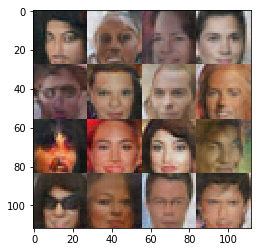

Epoch 6/8... Discriminator Loss: 1.2586... Generator Loss: 0.5101
Epoch 6/8... Discriminator Loss: 0.8378... Generator Loss: 0.7989
Epoch 6/8... Discriminator Loss: 1.2636... Generator Loss: 0.5184
Epoch 6/8... Discriminator Loss: 0.9531... Generator Loss: 1.0252
Epoch 6/8... Discriminator Loss: 1.1391... Generator Loss: 0.6609
Epoch 6/8... Discriminator Loss: 1.4538... Generator Loss: 0.4729
Epoch 6/8... Discriminator Loss: 1.1599... Generator Loss: 0.7009
Epoch 6/8... Discriminator Loss: 1.0919... Generator Loss: 0.7880
Epoch 6/8... Discriminator Loss: 1.5392... Generator Loss: 0.3797
Epoch 6/8... Discriminator Loss: 0.9997... Generator Loss: 0.8625


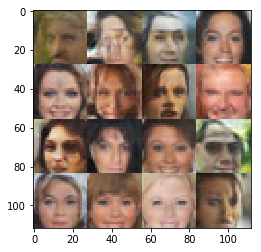

Epoch 6/8... Discriminator Loss: 1.1917... Generator Loss: 1.1129
Epoch 6/8... Discriminator Loss: 1.2964... Generator Loss: 0.6202
Epoch 6/8... Discriminator Loss: 1.1466... Generator Loss: 0.5650
Epoch 6/8... Discriminator Loss: 1.4427... Generator Loss: 0.3932
Epoch 6/8... Discriminator Loss: 1.6631... Generator Loss: 0.3402
Epoch 6/8... Discriminator Loss: 0.9098... Generator Loss: 0.8122
Epoch 6/8... Discriminator Loss: 1.1526... Generator Loss: 0.5862
Epoch 6/8... Discriminator Loss: 1.2618... Generator Loss: 0.8084
Epoch 6/8... Discriminator Loss: 1.4026... Generator Loss: 0.4784
Epoch 6/8... Discriminator Loss: 1.2754... Generator Loss: 0.8867


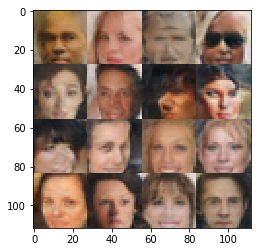

Epoch 6/8... Discriminator Loss: 1.1464... Generator Loss: 0.5849
Epoch 6/8... Discriminator Loss: 1.2951... Generator Loss: 0.4780
Epoch 6/8... Discriminator Loss: 1.4341... Generator Loss: 0.3808
Epoch 6/8... Discriminator Loss: 1.8560... Generator Loss: 0.2603
Epoch 6/8... Discriminator Loss: 1.4728... Generator Loss: 0.3699
Epoch 6/8... Discriminator Loss: 1.1026... Generator Loss: 0.6355
Epoch 6/8... Discriminator Loss: 1.3583... Generator Loss: 0.4944
Epoch 6/8... Discriminator Loss: 1.0412... Generator Loss: 0.8620
Epoch 6/8... Discriminator Loss: 1.2122... Generator Loss: 0.6838
Epoch 6/8... Discriminator Loss: 1.4599... Generator Loss: 0.4643


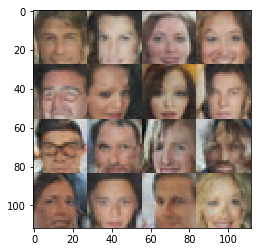

Epoch 6/8... Discriminator Loss: 1.5597... Generator Loss: 0.5626
Epoch 6/8... Discriminator Loss: 1.1537... Generator Loss: 1.2592
Epoch 6/8... Discriminator Loss: 1.0620... Generator Loss: 1.3262
Epoch 6/8... Discriminator Loss: 0.6942... Generator Loss: 1.2105
Epoch 6/8... Discriminator Loss: 1.3881... Generator Loss: 0.5902
Epoch 6/8... Discriminator Loss: 1.5164... Generator Loss: 0.3442
Epoch 6/8... Discriminator Loss: 1.4982... Generator Loss: 0.3749
Epoch 6/8... Discriminator Loss: 1.0793... Generator Loss: 0.9838
Epoch 6/8... Discriminator Loss: 1.3631... Generator Loss: 0.6286
Epoch 6/8... Discriminator Loss: 1.1796... Generator Loss: 0.7263


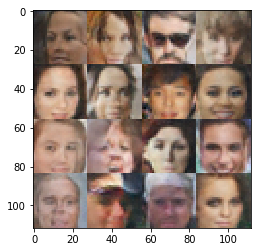

Epoch 6/8... Discriminator Loss: 1.8142... Generator Loss: 0.2790
Epoch 6/8... Discriminator Loss: 1.4168... Generator Loss: 1.0362
Epoch 6/8... Discriminator Loss: 1.4328... Generator Loss: 0.5079
Epoch 6/8... Discriminator Loss: 1.2152... Generator Loss: 0.9960
Epoch 6/8... Discriminator Loss: 1.2052... Generator Loss: 0.5859
Epoch 6/8... Discriminator Loss: 1.3808... Generator Loss: 0.4552
Epoch 6/8... Discriminator Loss: 1.4505... Generator Loss: 0.5442
Epoch 6/8... Discriminator Loss: 1.6987... Generator Loss: 0.3458
Epoch 6/8... Discriminator Loss: 1.3791... Generator Loss: 0.4569
Epoch 6/8... Discriminator Loss: 1.3272... Generator Loss: 0.4838


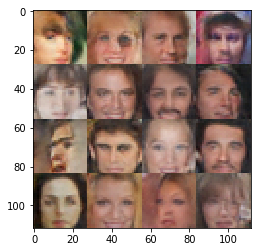

Epoch 6/8... Discriminator Loss: 1.0889... Generator Loss: 0.7325
Epoch 6/8... Discriminator Loss: 1.2365... Generator Loss: 0.5698
Epoch 6/8... Discriminator Loss: 1.3646... Generator Loss: 0.4788
Epoch 6/8... Discriminator Loss: 1.7294... Generator Loss: 0.2872
Epoch 6/8... Discriminator Loss: 1.1858... Generator Loss: 0.7542
Epoch 6/8... Discriminator Loss: 1.3866... Generator Loss: 0.7039
Epoch 6/8... Discriminator Loss: 1.4820... Generator Loss: 0.5479
Epoch 6/8... Discriminator Loss: 1.1327... Generator Loss: 0.9967
Epoch 6/8... Discriminator Loss: 1.8190... Generator Loss: 0.2499
Epoch 6/8... Discriminator Loss: 1.3450... Generator Loss: 0.5577


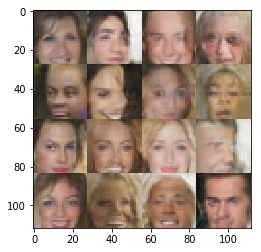

Epoch 6/8... Discriminator Loss: 1.2899... Generator Loss: 0.5046
Epoch 6/8... Discriminator Loss: 0.9920... Generator Loss: 0.7067
Epoch 6/8... Discriminator Loss: 1.8446... Generator Loss: 0.2486
Epoch 6/8... Discriminator Loss: 1.2802... Generator Loss: 0.6080
Epoch 6/8... Discriminator Loss: 1.0331... Generator Loss: 0.9604
Epoch 6/8... Discriminator Loss: 1.6094... Generator Loss: 0.5875
Epoch 6/8... Discriminator Loss: 1.0555... Generator Loss: 0.8996
Epoch 6/8... Discriminator Loss: 0.7764... Generator Loss: 1.1372
Epoch 6/8... Discriminator Loss: 1.6141... Generator Loss: 0.3744
Epoch 6/8... Discriminator Loss: 1.4363... Generator Loss: 0.4508


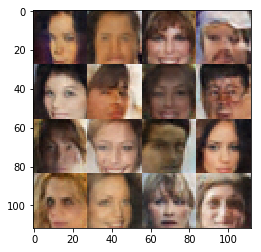

Epoch 6/8... Discriminator Loss: 0.7901... Generator Loss: 0.9548
Epoch 6/8... Discriminator Loss: 1.3431... Generator Loss: 0.7174
Epoch 6/8... Discriminator Loss: 1.0082... Generator Loss: 0.9755
Epoch 6/8... Discriminator Loss: 1.4904... Generator Loss: 0.4748
Epoch 6/8... Discriminator Loss: 1.4548... Generator Loss: 0.4261
Epoch 6/8... Discriminator Loss: 1.3183... Generator Loss: 0.4702
Epoch 6/8... Discriminator Loss: 1.4071... Generator Loss: 0.5526
Epoch 6/8... Discriminator Loss: 1.1617... Generator Loss: 0.6698
Epoch 6/8... Discriminator Loss: 1.0576... Generator Loss: 0.7238
Epoch 7/8... Discriminator Loss: 1.0028... Generator Loss: 0.7498


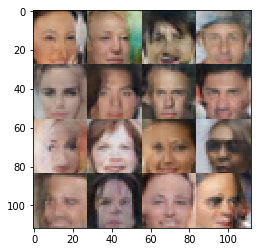

Epoch 7/8... Discriminator Loss: 1.2105... Generator Loss: 0.6797
Epoch 7/8... Discriminator Loss: 1.5066... Generator Loss: 0.3667
Epoch 7/8... Discriminator Loss: 1.1622... Generator Loss: 0.7707
Epoch 7/8... Discriminator Loss: 1.0161... Generator Loss: 0.6639
Epoch 7/8... Discriminator Loss: 1.4322... Generator Loss: 0.4711
Epoch 7/8... Discriminator Loss: 1.4350... Generator Loss: 0.4253
Epoch 7/8... Discriminator Loss: 1.2689... Generator Loss: 0.6525
Epoch 7/8... Discriminator Loss: 1.3699... Generator Loss: 0.5241
Epoch 7/8... Discriminator Loss: 1.6535... Generator Loss: 0.3643
Epoch 7/8... Discriminator Loss: 1.6251... Generator Loss: 0.3119


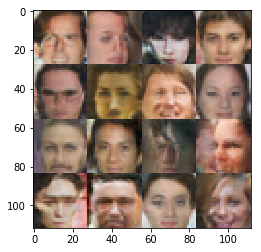

Epoch 7/8... Discriminator Loss: 1.5520... Generator Loss: 0.5551
Epoch 7/8... Discriminator Loss: 1.2329... Generator Loss: 0.5752
Epoch 7/8... Discriminator Loss: 1.2014... Generator Loss: 0.5886
Epoch 7/8... Discriminator Loss: 1.6310... Generator Loss: 0.2998
Epoch 7/8... Discriminator Loss: 1.5515... Generator Loss: 0.4157
Epoch 7/8... Discriminator Loss: 1.6808... Generator Loss: 0.3200
Epoch 7/8... Discriminator Loss: 1.8547... Generator Loss: 0.3727


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.